# 🎯 Project Brief

Final ranking position will be awarded based upon:
* the smallest test set
* highest accuracy rate in part 1
* highest accuracy rate in part 2

### The Problem

The aim of this project is to accurately predict which multiple choice answers a student will choose given different forms of comprehension problems.


**Project Objective**

The model's output (predicting a student's response) involves 2 parts:
- predicting whether the student will get an answer right or wrong, and 
- predicting the exact option the student will choose in a test.

Solving for the first part is very important in determining the answer to the second part. 

### Frame The Problem
The problem is a supervised learning problem. The values to be predicted (`pass` / `fail`) and selected value are contained or derivable from the dataset.

The problem is a binary and multi-class classification, since our model prediction options are Yes/No and one of 4 multiple choice options. 

The project will use batch learning of already collected data: the 11,402 student response data points.

### Select a Performance Measure

We'll be testing our model's performance using accuracy. We'll use cross-validation to evaluate our model.

### Create the Workspace

In [1]:
%matplotlib inline

import datetime as dt
import re

# Data Analysis
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns

# Data Extraction & Cleaning
import openpyxl
import docx
import spacy
from textstat.textstat import textstatistics
from textstat import textstat
from readability import Readability
import PyPDF2

# Feature Transformation
from sklearn.feature_selection import SelectPercentile
from sklearn.preprocessing import OneHotEncoder, PolynomialFeatures, StandardScaler, SplineTransformer, LabelEncoder
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.feature_selection import SequentialFeatureSelector
from sklearn.decomposition import PCA
from sklearn.model_selection import GridSearchCV, train_test_split, cross_val_score

# ML Models
from sklearn.linear_model import LogisticRegression, SGDClassifier
from sklearn.svm import SVC, LinearSVC
from sklearn.naive_bayes import GaussianNB, BernoulliNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import BaggingClassifier, RandomForestClassifier, VotingClassifier, ExtraTreesClassifier, GradientBoostingClassifier
from sklearn.neural_network import MLPClassifier
from xgboost import XGBClassifier

# ML Evaluation Metrics
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report


### Load the Data
There are 11,402 student response data points.

* **Mock Exams (folder)**
    * Questions: this is a folder that contains all the original comprehension passages and questions
    * Text: this is a folder that contains any additional comprehension passages that are not found in the Questions folder
    * Mock Exam Data (Labelled).xlsx: this is a spreadsheet containing all the student responses for the mock exams. Each tab is for each mock exam, the passage type is highlighted in yellow in A1, there is a column for the question type, the question number, the answer, and each student's response with the time in which they completed it.
* **Worksheets (folder)**
    * Questions: this is a folder that contains all the original comprehension passages and questions
    * worksheet data.xlsx: this is a spreadsheet containing all the student responses for the mock exams. It is structured similarly to the Mock Exam Data (Labelled) spreadsheet.
* question key: this is a spreadsheet defining the question types.
* student profiles: this is a spreadsheet containing the student's ID number and their birthday.

In [2]:
wb = openpyxl.load_workbook('Mock Exams/Mock Exam Data (Labelled).xlsx')

wb2 = openpyxl.load_workbook('Worksheets/worksheet data.xlsx')

question_key = pd.read_excel('question key.xlsx')

student_profiles = pd.read_excel('student profiles.xlsx')
student_profiles.columns = student_profiles.columns.str.strip()

**Student's Profiles**

Some students don't have birthdays. Others have only have birth years, which is not helpful to the date calculations in some profile columns. We'll impute values as follows:
1. For values with only years, we'll use Jan 1 as Month & Date
2. For missing values, we'll impute with the mode.

In [3]:
student_profiles.Birthday = student_profiles.Birthday.apply(lambda x: f'{x}-01-01' if (len(str(x))) == 4 else x)
student_profiles.Birthday = student_profiles.Birthday.apply(lambda x: '2012-01-01' if pd.isna(x) else x)
student_profiles.Birthday = pd.to_datetime(student_profiles.Birthday)

/var/folders/t4/x7zw1vdd2gx4d5lg3pnpdnwm0000gn/T/ipykernel_1555/2058567521.py:1: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype=datetime64[ns])
  student_profiles.Birthday = student_profiles.Birthday.apply(lambda x: f'{x}-01-01' if (len(str(x))) == 4 else x)
/var/folders/t4/x7zw1vdd2gx4d5lg3pnpdnwm0000gn/T/ipykernel_1555/2058567521.py:2: FutureWarning: Inferring datetime64[ns] from data containing strings is deprecated and will be removed in a future version. To retain the old behavior explicitly pass Series(data, dtype=datetime64[ns])
  student_profiles.Birthday = student_profiles.Birthday.apply(lambda x: '2012-01-01' if pd.isna(x) else x)


Spread of birth years:

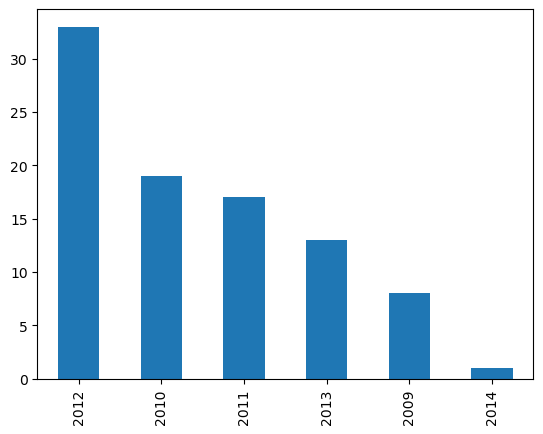

In [4]:
student_profiles.Birthday.dt.year.value_counts().plot(
    kind='bar'
)
plt.show()

**Mock Exams & Worksheet Data**

In [5]:
genres = {
    'bluebird': 'poem',
    'dorian gray': 'fiction',
    'jane eyre': 'fiction',
    'notre-dame': 'non-fiction',
    'metamorphosis': 'fiction',
    'sleepy hollow': 'fiction',
    'the hobbit': 'fiction',
    'those winter': 'poem',
    'anne': 'fiction',
    '1984': 'fiction',
    'alice': 'fiction',
    'baskervilles': 'fiction',
    'black beauty': 'fiction',
    'brazilian': 'non-fiction',
    'charlottes': 'fiction',
    'court life': 'fiction',
    'DORIAN': 'fiction',
    'dreams of a giant life': 'poem',
    'economics': 'non-fiction',
    'fauntleroy': 'fiction',
    'frankenstein': 'fiction',
    'friendship': 'non-fiction',
    'frost': 'poem',
    'gatsby': 'fiction',
    'gibson': 'fiction',
    'growth': 'non-fiction',
    'gulliver': 'fiction',
    'homing pigeon': 'non-fiction',
    'honeybees': 'non-fiction',
    'huck': 'fiction',
    'i have a dream': 'non-fiction',
    'jabberwocky': 'poem',
    'JANE EYRE': 'fiction',
    'jekyll': 'fiction',
    'lion': 'fiction',
    'little women': 'fiction',
    'lochinvar': 'poem',
    'lost treasure': 'fiction',
    'magic city': 'fiction',
    'marathon': 'non-fiction',
    'matilda': 'poem',
    'meg': 'fiction',
    'no enemies': 'poem',
    'nothing gold': 'poem',
    'NOTRE DAME': 'non-fiction',
    'oliver twist -master': 'fiction',
    'oliver twist -room': 'fiction',
    'sense': 'fiction',
    'patagonia': 'fiction',
    'peter': 'fiction',
    'rebecca': 'fiction',
    'sea fever': 'poem',
    'secret garden': 'poem',
    'shiba': 'non-fiction',
    'snowy river': 'poem',
    'sonnet 18': 'poem',
    'stopping by': 'poem',
    'this is going to hurt': 'fiction',
    'THOSE WINTER': 'poem',
    'tom sawyer': 'fiction',
    'treasure island': 'fiction',
    'tyger': 'poem',
    'umami': 'non-fiction',
    'van': 'letter',
    'voyage': 'fiction',
    'war of the worlds': 'poem',
    'when u r old': 'poem',
    'wind in the willows': 'fiction',
    'wizard': 'fiction',
}

In [6]:
# Create a dictionary of mock exam dataframes
mock_dfs = {col: pd.DataFrame(wb[col].values)\
    .dropna(axis=0, how='all') for col in wb.sheetnames}

# Set column headers using relevant index row in dfs
mock_dfs = {key: val.set_axis(
    np.where(
        val.loc[1, 0] == 'Question Type',
        val.loc[1, :],
        np.where(
            val.loc[2, 0] == 'Question Type',
            val.loc[2, :],
            val.loc[3, :]
        )
    ), axis=1) \
    # Drop any columns with all missing values
    .dropna(axis=1, how='all')\
    .assign(
    # create new columns for title and genre
    text_title=key,
    text_genres=lambda x:x.text_title.map(genres)) \
    .reset_index(drop=True)
       for key, val in mock_dfs.items()}

# Drop rows used as column headers
for i in range(8):
    if mock_dfs[wb.sheetnames[i]].iloc[1, 0] == 'Question Type':
        mock_dfs[wb.sheetnames[i]] = mock_dfs[wb.sheetnames[i]].drop(index=1)
    elif mock_dfs[wb.sheetnames[i]].iloc[2, 0] == 'Question Type':
        mock_dfs[wb.sheetnames[i]] = mock_dfs[wb.sheetnames[i]].drop(index=2)
    elif mock_dfs[wb.sheetnames[i]].iloc[3, 0] == 'Question Type':
        mock_dfs[wb.sheetnames[i]] = mock_dfs[wb.sheetnames[i]].drop(index=3)

In [7]:
# Create a dictionary of worksheet dataframes
work_dfs = {col: pd.DataFrame(wb2[col].values) \
    # Drop any rows & columns with all missing values
    .dropna(axis=0, how='all') \
    .dropna(axis=1, how='all') for col in wb2.sheetnames}

# Remove dfs without texts from work_dfs dict
for key in ['Sheet 17', 'robin -happened', 'robin -considered']:
    if key in work_dfs:
        del work_dfs[key]

# Create columns for Question Type where missing from df
mixed_vals = [
    'lost treasure', 'magic city', 'marathon', 'matilda',
    'meg', 'no enemies', 'nothing gold',
    'oliver twist -master', 'oliver twist -room', 'sense',
    'patagonia', 'peter', 'rebecca', 'sea fever',
    'secret garden', 'shiba', 'snowy river', 'sonnet 18',
    'stopping by', 'this is going to hurt', 'THOSE WINTER',
    'tom sawyer', 'treasure island', 'tyger', 'umami',
    'van', 'voyage', 'war of the worlds', 'when u r old',
    'wind in the willows', 'wizard'
]

for i in mixed_vals:
    if (work_dfs[i].iloc[1, 0] == 'Question') | (work_dfs[i].iloc[2, 0] == 'Question'):
        work_dfs[i].insert(0, 'Question Type', 'Question Type')

# Set column headers using relevant index row in dfs
work_dfs = {key: val.set_axis(
    np.where(
        (val.iloc[1, 0] == 'Question Type')
        &
        (val.iloc[1, 0] == 'Question'),
        val.iloc[1, :],
        np.where(
            val.iloc[2, 1] == 'Question',
            val.iloc[2, :],
            val.iloc[1, :]
        )
    ), axis=1) \
    .dropna(axis=1, how='all') \
    .assign(
    # create new columns for title & genre
    text_title=key,
    text_genres=lambda x:x.text_title.map(genres)) \
    .reset_index(drop=True)
            for key, val in work_dfs.items()}

# Drop rows used as column headers
for key, val in work_dfs.items():
    if val.iloc[1].tolist()[:-2] == list(val.columns)[:-2]:
        work_dfs[key] = work_dfs[key].drop(index=1)

    elif val.iloc[2].tolist()[:-2] == list(val.columns)[:-2]:
        work_dfs[key] = work_dfs[key].drop(index=2)

    elif val.iloc[3].tolist()[:-2] == list(val.columns)[:-2]:
        work_dfs[key] = work_dfs[key].drop(index=3)

# Clean column headers
for key, df in work_dfs.items():
    work_dfs[key] = work_dfs[key].rename(columns={'Answers':'Answer'})
    work_dfs[key] = work_dfs[key].rename(columns={'answers':'Answer'})
    work_dfs[key] = work_dfs[key].rename(columns={'A':'Answer'})
    work_dfs[key] = work_dfs[key].rename(columns={None:'Answer'})
    work_dfs[key] = work_dfs[key].rename(columns={'Type':'Question Type'})
    work_dfs[key] = work_dfs[key].rename(columns={'Question (question numbers changed to match the mock version)':'Question'})

We need to include `Question Type` values for a number of dataframes, so we can make index computations. We'll make a list of dataframes with None in their `Question Type` and use the texts to fill their values.

In [8]:
none_qts = {key:[] for key, df in work_dfs.items() if df['Question Type'].iloc[5] is None or df['Question Type'].iloc[5] == 'Question Type' or df['Question Type'].iloc[5] == np.nan}

In [9]:
none_qts['black beauty'] = [None, 'H', 'M', 'H', 'P', 'H', 'V', 'M', 'M', 'M', 'P', 'H', 'M']
none_qts['brazilian'] =[None, 'V', 'H', 'T/F', 'P', 'T/F', 'H', 'T/F', 'G', 'H', 'M', 'H', 'M', 'H', 'H', 'M']
none_qts['court life'] = [None, 'M', 'M', 'M', 'M, V', 'H', 'M, H', 'H', 'G', 'P', 'V', 'H', 'H', 'H, M']
none_qts['DORIAN'] = [None, 'M', 'M', 'P', 'P', 'V', 'H', 'H', 'M, H', 'M, H', 'G', 'H', 'V', 'P', 'H', 'H, V', 'H', 'G', 'P, H', 'G', 'G', 'G', 'V', 'H', 'T/F', 'H','V', 'M', 'V']
none_qts['dreams of a giant life'] = [None, 'H, M', 'H, P', 'P', 'V', 'G', 'H', 'P', 'P', 'H', 'G', 'V', 'V', 'P', 'G', 'H', 'M', 'T/F', 'P']
none_qts['economics'] = [None, 'M', 'V', 'M', 'H', 'M', 'M', 'T/F', 'V, M', 'H', 'M', 'M', 'H', 'H', 'H']
none_qts['fauntleroy'] = [None, 'V', 'H', 'P', 'P', 'H', 'G','H','M', 'P', 'M', 'H', 'M']
none_qts['frankenstein'] = [None, 'H', 'H', 'T/F', 'H', 'G', 'T/F', 'P', 'M', 'G', 'M', 'H', 'H', 'M', 'H']
none_qts['friendship'] = [None, 'G', 'V', 'H', 'V', 'V', 'M', 'H', 'H', 'P', 'G', 'V, H', 'P', 'G', 'H']
none_qts['frost'] = [None, 'P', 'G', 'H', 'P', 'H', 'P', 'P', 'V', 'G', 'P', 'G', 'G', 'V', 'H', 'M', 'V', 'G', 'G', 'G']
none_qts['gatsby'] = [None, 'T/F', 'T/F', 'P', 'P', 'G', 'H', 'M', 'H', 'H', 'G', 'P', 'P', 'H', 'H', 'G', 'P', 'P', 'M']
none_qts['gibson'] = [None, 'M', 'V, M,', 'H', 'P', 'H', 'G', 'V', 'H', 'V', 'H', 'T/F', 'H', 'H', 'H', 'M', 'H', 'H']
none_qts['growth'] = [None, 'V', 'H', 'V', 'H', 'H', 'P', 'M', 'M', 'T/F', 'G', 'G', 'T/F', 'H', 'H', 'T/F', 'G', 'T/F', 'P', 'V', 'H']
none_qts['gulliver'] = [None, 'H', 'M', 'H', 'P', 'T/F', 'V', 'M', 'M', 'V', 'T/F']
none_qts['homing pigeon'] = [None, 'M', 'V', 'P', 'M', 'M', 'T/F', 'M', 'M', 'M', 'T/F', 'M', 'V', 'P', 'V', 'P', 'P']
none_qts['honeybees'] = [None, 'V', 'V', 'M', 'M', 'M', 'P', 'T/F', 'P', 'M', 'H', 'H', 'P', 'P', 'H', 'P', 'H', 'M', 'T/F', 'T/F', 'H']
none_qts['huck'] = [None, 'T/F', 'H', 'T/F', 'H', 'H', 'H', 'H, V', 'H', 'G', 'H', 'H', 'H', 'H', 'H', 'H']
none_qts['i have a dream'] = [None, 'G', 'M', 'M', 'M', 'T/F', 'M', 'M', 'M, H', 'M', 'M', 'M', 'H', 'P', 'H', 'V']
none_qts['jabberwocky'] = [None, 'G', 'M', 'G', 'G', 'G, H', 'G', 'H', 'T/F', 'H', 'P', 'M', 'P', 'P']
none_qts['jekyll'] = [None, 'M, H', 'V', 'H', 'P', 'M, H', 'H', 'V', 'M', 'H', 'P', 'G', 'H', 'P', 'H', 'P', 'T/F', 'H', 'H']
none_qts['lion'] = [None, 'H', 'M, V', 'V, P', 'V, P', 'H', 'G', 'V', 'P', 'H', 'M, V', 'V, P', 'V, P', 'H', 'G', 'V', 'H', 'H']
none_qts['little women'] = [None, 'M', 'H', 'H', 'M', 'M', 'H', 'G', 'P', 'H', 'M', 'M', 'M', 'V', 'G', 'H', 'M', 'M', 'H']
none_qts['lochinvar'] = [None, 'G', 'P', 'M', 'M', 'T/F', 'H', 'V', 'M', 'P', 'V', 'H', 'V', 'T/F', 'M', 'T/F', 'V', 'V']
none_qts['magic city'] = [None, 'H', 'H', 'P', 'M', 'P', 'V', 'P', 'T/F', 'M', 'H', 'H', 'H', 'H', 'V']
none_qts['matilda'] = [None, 'V', 'H', 'M', 'M', 'T/F', 'P', 'V', 'P', 'H', 'H', 'P', 'M', 'T/F', 'H', 'H', 'V', 'V', 'P']
none_qts['meg'] = [None, 'G', 'V', 'H', 'V', 'M', 'H', 'V', 'H', 'T/F', 'G', 'M', 'M', 'T/F', 'P', 'V', 'G', 'P', 'H', 'G', 'P', 'H', 'H', 'V', 'T/F', 'G, V', 'H', 'V', 'M', 'P', 'V']
none_qts['oliver twist -master'] = [None, 'P', 'P', 'M', 'H', 'M', None, 'H', 'M', 'H']
none_qts['oliver twist -room'] = [None, 'G', 'M', None, 'M', 'T/F', 'T/F', 'M, H', 'M, H', 'H', 'M', 'H, P', 'P', 'M']
none_qts['sense'] = [None, 'H', 'M', 'V', 'P', 'M', 'M', 'M', 'M', 'V', 'P', 'M', 'H']
none_qts['rebecca'] = [None, 'H', 'V', 'H', 'M', 'M', 'P', 'H', 'V', 'H', 'M', 'V', 'H']
none_qts['sea fever'] = [None, 'P', 'H', 'P', 'P', 'G', 'H', 'H', 'M', 'H', 'P', 'P', 'H']
none_qts['secret garden'] = [None, None, 'H', 'M', 'M', 'H', 'P', 'M', 'H', None, 'T/F', 'P', 'H', 'V', 'V', 'P', 'H']
none_qts['shiba'] = [None, None, 'M', 'V', 'M', 'P', 'P', 'M', 'M', 'P', 'V', 'P', 'P', 'M', 'H', 'H', 'H', 'M', 'P', 'T/F', 'H']
none_qts['snowy river'] = [None, 'V', 'M', 'H', 'M', 'V', 'V', 'H', 'M', 'H', 'H', 'T', 'M', 'H', 'M']
none_qts['sonnet 18'] = [None, 'V', 'M', 'V', 'H', 'P', 'G', 'V', 'V', 'M', 'M', 'P', 'M', 'V', 'H', 'P', 'M', 'P', 'H', 'H', 'H', 'H', 'H']
none_qts['stopping by'] = [None, 'G', 'P', 'P', 'M', 'T/F', 'H', 'P', 'P', 'P', 'P', 'G', 'H']
none_qts['this is going to hurt'] = [None, 'M', 'M', 'T/F', 'H', 'H', 'M', 'V', 'V']
none_qts['tom sawyer'] = [None, 'M', 'H', 'P', 'H', 'H', 'M', 'H', 'M', 'M', 'M', 'M', 'P', 'P', 'H', 'M', 'P', 'H']
none_qts['tyger'] = [None, None, 'M', 'M', 'V', 'G', 'M', 'V', 'M', 'G', 'M', 'T/F', 'G', 'P', 'T/F', 'G']
none_qts['umami'] = [None, 'V', 'V', 'M', 'H', 'P', 'T/F', 'P', 'T/F', 'V', 'G', 'P', 'M', 'P', 'H', 'T/F', 'M', 'M', 'H', 'G', 'P', 'G', 'H']
none_qts['van'] = [None, None, 'P', 'P', 'P', 'M', 'M', 'T/F', 'H', 'M', 'M', 'H', 'P', 'G', 'V', 'V']
none_qts['voyage'] = [None, 'H', 'V', 'H', 'T/F', 'V', 'V', 'G', 'P', 'P', 'T/F', 'P', 'M', 'P', 'M', 'V']
none_qts['war of the worlds'] = [None, 'P', 'T/F', 'P', 'P', 'H', 'V', 'T/F', 'P', 'P', 'M', 'V', 'M', None, 'V', 'H']
none_qts['wind in the willows'] = [None, 'P', 'P', 'P', 'H', 'P', 'H', 'T', 'V', 'P', 'H', 'V', 'P', 'H', 'V', 'H']
none_qts['wizard'] = [None, 'M', 'M', 'M', 'H', 'M', 'V', 'M', 'V', 'H', 'V', 'M', 'V', 'G']
none_qts['shiba'] = [None, None, 'M', 'V', 'M', 'P', 'P', 'M', 'M', 'P', 'V', 'P', 'P', 'M', 'H', 'H', 'H', 'M', 'P', 'T/F', 'H', 'M']
none_qts['patagonia'] = [None, 'G', 'P', 'V', 'M', 'P', 'P', 'V', 'M', 'V', 'V', 'V', 'V', 'P', 'P', 'P', 'M', 'P', 'P', 'T/F']

In [10]:
for k1, type in none_qts.items():
    for k2, df in work_dfs.items():
        if k1 == k2:
            work_dfs[k2]['Question Type'] = type

**Texts**

In [11]:
# import texts into workspace
texts = list(mock_dfs.keys())
mock_files = dict()
for i in texts:
    doc = docx.Document(f'Mock Exams/Questions/{i}.docx')
    doc_content = ''
    for paragraph in doc.paragraphs:
        doc_content += paragraph.text + '\n'

    mock_files[i] = mock_files.get(i, doc_content)

In [12]:
texts2 = list(work_dfs.keys())

file_list = list()
filenames = list()

for i in texts2:
    for extension in ['docx', 'pdf']:
        filepath = f'Worksheets/Questions/{i}.{extension}'.lower()
        # check if file exists:
        try:
            if open(filepath, 'r'):
                file_list.append(filepath)
                filenames.append(i)
        except FileNotFoundError:
            pass

In [13]:
work_files = dict()

for file, name in zip(file_list, filenames):
    # check if the file is a Word document
    if file.split('.')[-1] == 'docx':
        doc = docx.Document(file)
        doc_content = ''    
        # scrape text in document
        for paragraph in doc.paragraphs:
            doc_content += paragraph.text + '\n'

        # check for tables
        if doc.tables:
            keys = None
            table_content = list()
            tables = [
                doc.tables[i] for i in range(len(doc.tables))
            ]
            # scrape tables into a dictionary
            for table in tables:
                for i, row in enumerate(table.rows):
                    text = (cell.text for cell in row.cells)
                    if i == 0:
                        keys = tuple(text)
                        continue
                    row_data = dict(zip(keys, text))
                    table_content.append(row_data)

        # where no tables, check for `questions` in text
        else:
            pattern = 'questions'
            match = re.search(pattern, doc_content, re.I)
            if match:
                # separate text and questions and compile in dictionary
                work_files[name] = work_files.get(
                    name, 
                    [doc_content[:match.start()], 
                     doc_content[match.start():]]
                )
            else:
                pass
            
        # compile text and questions table in dictionary 
        work_files[name] = work_files.get(
            name, [doc_content, table_content]
        )
    
    # check if the file is a pdf document:   
    elif file.split('.')[-1] == 'pdf':
        # scrape pdf document
        pdf_file = open(file, 'rb')
        pdf_reader = PyPDF2.PdfReader(pdf_file)
        text = ''
        for page_num in range(len(pdf_reader.pages)):
            page = pdf_reader.pages[page_num]
            text += page.extract_text()
        pdf_file.close()
        
        # check for and separate questions from the text
        pattern = 'comprehension questions'
        match = re.search(pattern, text, re.I)
        # compile text and questions into dictionary
        if match:
            work_files[name] = work_files.get(name, [text[:match.start()], text[match.start():]])
        else:
            work_files[name] = work_files.get(name, [text, None])  
    else:
        print(f'This file: {file} can\'t be compiled.')

### Take a Quick Look at the Data Structure

In [14]:
for key, val in mock_dfs.items():
    print(key), val.info()

bluebird
<class 'pandas.core.frame.DataFrame'>
Int64Index: 26 entries, 0 to 26
Data columns (total 38 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   Question Type  26 non-null     object
 1   Question       25 non-null     object
 2   Answer         25 non-null     object
 3   Full Name:     1 non-null      object
 4   61             26 non-null     object
 5   36             26 non-null     object
 6   34             26 non-null     object
 7   35             26 non-null     object
 8   37             26 non-null     object
 9   44             26 non-null     object
 10  38             25 non-null     object
 11  39             26 non-null     object
 12  40             26 non-null     object
 13  19             26 non-null     object
 14  25             25 non-null     object
 15  1              25 non-null     object
 16  16             26 non-null     object
 17  62             26 non-null     object
 18  63             26 non-n

In [15]:
for key, val in work_dfs.items():
    print(key), val.info()

anne
<class 'pandas.core.frame.DataFrame'>
Int64Index: 18 entries, 0 to 18
Data columns (total 24 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   Question Type  17 non-null     object
 1   Question       16 non-null     object
 2   Answer         16 non-null     object
 3   Name           2 non-null      object
 4   8              16 non-null     object
 5   15             16 non-null     object
 6   22             16 non-null     object
 7   2              16 non-null     object
 8   6              16 non-null     object
 9   79             3 non-null      object
 10  1              16 non-null     object
 11  3              16 non-null     object
 12  11             16 non-null     object
 13  18             15 non-null     object
 14  19             16 non-null     object
 15  50             18 non-null     object
 16  49             18 non-null     object
 17  44             17 non-null     object
 18  78             17 non-null 

### Data Cleaning
There is a substantial amount of data that needs to be organised. Each piece of work includes its original passage, questions to the passage, multiple-choice options for each, student response data and student data. Each text has metrics which need to be computed. 

The final dataframe should the following fields:
- Indexes: id, date of birth, age at completion (year, month, day), time of completion, text, genre
- questions
- question type
- literary skills (vocabulary skills, punctuation skills, knowledge of idioms)
- application of skills (factual recall, inference, SPaG (spelling, punctuation and grammar), vocabulary, purpose)
- question difficulty (Difficulty Index and Discrimination Index)
- text metrics (flesch, flesch-kincaid, ari, gunning_fog, coleman-liau, linsear write, spache, smog and dale schall scores)
- student response
- correct answer
- pass / fail
- genre score: an ordered category where genre is scored by difficulty
- difficulty index: calculated by computing the total of students who got question correct divided by the total students
- discrimination index: high-scoring half who correctly answered (hc) minus low-scoring half who answered correctly (lc) divided by half of total students

**Text Metrics**

We'll be computing the text metrics using functions from the Readability module, the textstat module and some functions written for the purpose.

Functions for Text Metrics:

In [16]:
def break_sentences(text):
    """
    Splits the text into sentences, using Spacy's sentence segmentation.
    :param text: text to be split into sentences.
    :return: list of sentences broken down from a text.
    """
    text = text.replace('\n', ' ')
    nlp = spacy.load('en_core_web_sm')
    doc = nlp(text)
    return list(doc.sents)


def word_count(text):
    """
    :param text: Text to be used for word count.
    :return: Number of words in the text.
    """
    sentences = break_sentences(text)
    words = 0
    for sentence in sentences:
        words += len([token for token in sentence])
    return words


def sentence_count(text):
    """
    :param text: Text to be used for sentence count.
    :return: Number of sentences in the text
    """
    sentences = break_sentences(text)
    return len(sentences)


def avg_sentence_length(text):
    """
    :param text: Text to be used to be analyzed.
    :return: Average sentence length.
    """
    words = word_count(text)
    sentences = sentence_count(text)
    average_sentence_length = float(words / sentences)
    return average_sentence_length


def syllables_count(word):
    """
    :param word: Word to be analyzed.
    :return: Syllable count for word.
    """
    return textstatistics().syllable_count(word)


def avg_syllables_per_word(text):
    """
    Returns the average number of syllables per word in the text.
    :param text: Text to be analyzed.
    :return: Average number of syllables per word in the text.
    """
    legacy_round = textstat._legacy_round
    syllable = syllables_count(text)
    words = word_count(text)
    ASPW = float(syllable) / float(words)
    return legacy_round(ASPW, 1)


def difficult_words(text):
    """
    Return total Difficult Words in a text.
    :param text: Text to be analyzed.
    :return: Total Difficult Words in a text.
    """
    nlp = spacy.load('en_core_web_sm')
    doc = nlp(text)

    # Find all words in the text
    words = []
    sentences = break_sentences(text)
    for sentence in sentences:
        words += [str(token) for token in sentence]

    # Difficult words are those with syllables >= 2. Textstat provides `easy_word_set` as a list of common words.
    diff_words_set = set()

    for word in words:
        syllable_count = syllables_count(word)
        if word not in nlp.Defaults.stop_words and syllable_count >= 2 or textstat.is_difficult_word(word, 2):
            diff_words_set.add(word)

    return len(diff_words_set)


def poly_syllable_count(text):
    """
    A word is polysyllabic if it has more than 3 syllables. This function returns the number of all such words present in the text.
    :param text: Text to be analyzed.
    :return: The number of polysyllabic in the text.
    """
    count = 0
    words = []
    sentences = break_sentences(text)
    for sentence in sentences:
        words += [str(token) for token in sentence]

    for word in words:
        syllable_count = syllables_count(word)
        if syllable_count >= 3:
            count += 1
    return count

In [17]:
flesch_bin_edges = [0, 30, 50, 60, 70, 80, 90, 100]
flesch_bin_labels = [
    'Very Confusing', 'Difficult', 'Fairly Difficult',
    'Standard', 'Fairly Easy', 'Easy', 'Very Easy'
]
grade_edges = [
    0, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17
]
grade_labels = [
    '4th grade', '5th grade', '6th grade', '7th grade',
    '8th', 'HS Freshman', 'HS Sophomore', 'HS Junior',
    'HS Senior', 'College Freshman', 'College Sophomore',
    'College Junior', 'College Senior', 'College Graduate'
]
dc_edges = [
    0, 5, 6, 7, 8, 9, 10
]
dc_labels = [
    'avg 4th-grade student or lower',
    'avg 5th or 6th-grade student',
    'avg 7th or 8th-grade student',
    'avg 9th or 10th-grade student',
    'avg 11th or 12th-grade student',
    'average 13th to 15th-grade (college) student'
]

date_published = {
    'bluebird': dt.datetime.strptime('1992-01-01', '%Y-%m-%d'),
    'dorian gray': dt.datetime.strptime('1891-07-01', '%Y-%m-%d'),
    'jane eyre': dt.datetime.strptime('1847-01-01', '%Y-%m-%d'),
    'notre-dame': dt.datetime.strptime('1831-01-15', '%Y-%m-%d'),
    'metamorphosis': dt.datetime.strptime('1992-01-01', '%Y-%m-%d'),
    'sleepy hollow': dt.datetime.strptime('1820-01-01', '%Y-%m-%d'),
    'the hobbit': dt.datetime.strptime('1937-09-21', '%Y-%m-%d'),
    'those winter': dt.datetime.strptime('1962-01-01', '%Y-%m-%d'),
    'anne': dt.datetime.strptime('1908-06-01', '%Y-%m-%d'),
    '1984': dt.datetime.strptime('1949-06-08', '%Y-%m-%d'),
    'alice': dt.datetime.strptime('1965-11-01', '%Y-%m-%d'),
    'baskervilles': dt.datetime.strptime('1902-03-25', '%Y-%m-%d'),
    'black beauty': dt.datetime.strptime('1877-11-24', '%Y-%m-%d'),
    'brazilian': dt.datetime.strptime('1914-01-01', '%Y-%m-%d'),
    'charlottes': dt.datetime.strptime('1952-10-15', '%Y-%m-%d'),
    'court life': dt.datetime.strptime('1915-01-01', '%Y-%m-%d'),
    'DORIAN': dt.datetime.strptime('1891-07-01', '%Y-%m-%d'),
    'dreams of a giant life': dt.datetime.strptime('2022-05-23', '%Y-%m-%d'),
    'economics': dt.datetime.strptime('2019-12-06', '%Y-%m-%d'),
    'fauntleroy': dt.datetime.strptime('1886-10-01', '%Y-%m-%d'),
    'frankenstein': dt.datetime.strptime('1818-01-01', '%Y-%m-%d'),
    'friendship': dt.datetime.strptime('2022-06-14', '%Y-%m-%d'),
    'frost': dt.datetime.strptime('1832-01-01', '%Y-%m-%d'),
    'gatsby': dt.datetime.strptime('1925-04-10', '%Y-%m-%d'),
    'gibson': dt.datetime.strptime('2021-11-08', '%Y-%m-%d'),
    'growth': dt.datetime.strptime('2016-12-28', '%Y-%m-%d'),
    'gulliver': dt.datetime.strptime('1726-10-28', '%Y-%m-%d'),
    'homing pigeon': dt.datetime.strptime('1945-01-01', '%Y-%m-%d'),
    'honeybees': dt.datetime.strptime('2022-04-25', '%Y-%m-%d'),
    'huck': dt.datetime.strptime('1884-12-10', '%Y-%m-%d'),
    'i have a dream': dt.datetime.strptime('1963-08-28', '%Y-%m-%d'),
    'jabberwocky': dt.datetime.strptime('1872-01-01', '%Y-%m-%d'),
    'JANE EYRE': dt.datetime.strptime('1847-10-19', '%Y-%m-%d'),
    'jekyll': dt.datetime.strptime('1886-01-05', '%Y-%m-%d'),
    'lion': dt.datetime.strptime('1950-10-16', '%Y-%m-%d'),
    'little women': dt.datetime.strptime('1868-09-30', '%Y-%m-%d'),
    'lochinvar': dt.datetime.strptime('1808-01-01', '%Y-%m-%d'),
    'lost treasure': dt.datetime.strptime('2022-09-29', '%Y-%m-%d'),
    'magic city': dt.datetime.strptime('1910-01-01', '%Y-%m-%d'),
    'marathon': dt.datetime.strptime('2021-11-15', '%Y-%m-%d'),
    'matilda': dt.datetime.strptime('1992-10-27', '%Y-%m-%d'),
    'meg': dt.datetime.strptime('1926-01-01', '%Y-%m-%d'),
    'no enemies': dt.datetime.strptime('2021-09-30', '%Y-%m-%d'),
    'nothing gold': dt.datetime.strptime('1923-10-01', '%Y-%m-%d'),
    'NOTRE DAME': dt.datetime.strptime('1831-01-15', '%Y-%m-%d'),
    'oliver twist -master': dt.datetime.strptime('1838-01-01', '%Y-%m-%d'),
    'oliver twist -room': dt.datetime.strptime('1838-01-01', '%Y-%m-%d'),
    'sense': dt.datetime.strptime('1811-10-30', '%Y-%m-%d'),
    'patagonia': dt.datetime.strptime('1977-01-01', '%Y-%m-%d'),
    'peter': dt.datetime.strptime('1904-01-01', '%Y-%m-%d'),
    'rebecca': dt.datetime.strptime('1903-11-20', '%Y-%m-%d'),
    'sea fever': dt.datetime.strptime('1902-01-01', '%Y-%m-%d'),
    'secret garden': dt.datetime.strptime('1911-01-01', '%Y-%m-%d'),
    'shiba': dt.datetime.strptime('2021-04-26', '%Y-%m-%d'),
    'snowy river': dt.datetime.strptime('1890-04-26', '%Y-%m-%d'),
    'sonnet 18': dt.datetime.strptime('1609-01-01', '%Y-%m-%d'),
    'stopping by': dt.datetime.strptime('1923-01-01', '%Y-%m-%d'),
    'this is going to hurt': dt.datetime.strptime('2017-09-07', '%Y-%m-%d'),
    'THOSE WINTER': dt.datetime.strptime('1962-01-01', '%Y-%m-%d'),
    'tom sawyer': dt.datetime.strptime('1876-01-01', '%Y-%m-%d'),
    'treasure island': dt.datetime.strptime('1882-01-28', '%Y-%m-%d'),
    'tyger': dt.datetime.strptime('1794-01-01', '%Y-%m-%d'),
    'umami': dt.datetime.strptime('2022-06-27', '%Y-%m-%d'),
    'van': dt.datetime.strptime('2021-09-27', '%Y-%m-%d'),
    'voyage': dt.datetime.strptime('1827-01-01', '%Y-%m-%d'),
    'war of the worlds': dt.datetime.strptime('1898-01-01', '%Y-%m-%d'),
    'when u r old': dt.datetime.strptime('2014-09-24', '%Y-%m-%d'),
    'wind in the willows': dt.datetime.strptime('1908-04-01', '%Y-%m-%d'),
    'wizard': dt.datetime.strptime('1900-05-17', '%Y-%m-%d'),
}

In [18]:
def text_analysis(df):
    df = df.copy().assign(
        publication_date=lambda x: x.title.map(date_published),
        break_sentences=lambda x: x.text.apply(break_sentences),
        syllables_count=lambda x: textstat.syllable_count(x.text.iloc[0]),
        lexicon_count=lambda x: textstat.lexicon_count(x.text.iloc[0], removepunct=True),
        sentence_count=lambda x: textstat.sentence_count(x.text.iloc[0]),
        avg_sentence_length=lambda x: x.lexicon_count.div(x.sentence_count),
        avg_syllables_per_word=lambda x: x.text.apply(avg_syllables_per_word),
        difficult_words=lambda x: x.text.apply(difficult_words),
        percentage_difficult_words=lambda x: x.difficult_words / x.lexicon_count,
        poly_syllable_count=lambda x: x.text.apply(poly_syllable_count),
        flesch_rds=lambda x: Readability(x.text.iloc[0]).flesch().score,
        flesch_label_rds=lambda x: Readability(x.text.iloc[0]).flesch().ease,
        flesch_ts=lambda x: textstat.flesch_reading_ease(x.text.iloc[0]),
        flesch_label_ts=lambda x: pd.cut(x.flesch_ts, bins=flesch_bin_edges, labels=flesch_bin_labels),
        gunning_fog_rds=lambda x: Readability(x.text.iloc[0]).gunning_fog().score,
        gunning_fog_label_rds=lambda x: Readability(x.text.iloc[0]).gunning_fog().grade_level,
        gunning_fog_ts=lambda x: textstat.gunning_fog(x.text.iloc[0]),
        gunning_fog_label_ts=lambda x: pd.cut(x.gunning_fog_ts, bins=grade_edges, labels=grade_labels),
        flesch_kincaid_rds=lambda x: Readability(x.text.iloc[0]).flesch_kincaid().score,
        flesch_kincaid_label_rds=lambda x: Readability(x.text.iloc[0]).flesch_kincaid().grade_level,
        flesch_kincaid_ts=lambda x: textstat.flesch_kincaid_grade(x.text.iloc[0]),
        flesch_kincaid_label_ts=lambda x: pd.cut(x.flesch_kincaid_ts, bins=grade_edges, labels=grade_labels),
        coleman_liau_rds=lambda x: Readability(x.text.iloc[0]).coleman_liau().score,
        coleman_liau_label_rds=lambda x: Readability(x.text.iloc[0]).coleman_liau().grade_level,
        coleman_liau_ts=lambda x: textstat.coleman_liau_index(x.text.iloc[0]),
        coleman_liau_label_ts=lambda x: pd.cut(x.coleman_liau_ts, bins=grade_edges, labels=grade_labels),
        linsear_write_rds=lambda x: Readability(x.text.iloc[0]).linsear_write().score,
        linsear_write_label_rds=lambda x: Readability(x.text.iloc[0]).linsear_write().grade_level,
        linsear_write_ts=lambda x: textstat.linsear_write_formula(x.text.iloc[0]),
        linsear_write_label_ts=lambda x: pd.cut(x.linsear_write_ts, bins=grade_edges, labels=grade_labels),
        spache_rds=lambda x: Readability(x.text.iloc[0]).spache().score,
        spache_label_rds=lambda x: Readability(x.text.iloc[0]).spache().grade_level,
        spache_ts=lambda x: textstat.spache_readability(x.text.iloc[0]),
        spache_label_ts=lambda x: pd.cut(x.spache_ts, bins=grade_edges, labels=grade_labels),
        ari_rds=lambda x: Readability(x.text.iloc[0]).ari().score,
        ari_ts=lambda x: textstat.automated_readability_index(x.text.iloc[0]),
        ari_label_ts=lambda x: pd.cut(x.ari_ts, bins=grade_edges, labels=grade_labels),
        smog_ts=lambda x: textstat.smog_index(x.text.iloc[0]),
        smog_label_ts=lambda x: pd.cut(x.smog_ts, bins=grade_edges, labels=grade_labels),
        dale_chall_rds=lambda x: Readability(x.text.iloc[0]).dale_chall().score,
        dale_chall_ts=lambda x: textstat.dale_chall_readability_score(x.text.iloc[0]),
        dale_chall_label_ts=lambda x: pd.cut(x.dale_chall_ts, bins=dc_edges, labels=dc_labels),
        consensus_ts=lambda x: textstat.text_standard(x.text.iloc[0], float_output=True),
        consensus_label_ts=lambda x: textstat.text_standard(x.text.iloc[0]),
    )
    return df


def adjusted_text_analysis(df):
    # for texts where certain text metrics will return errors. Those metrics are omitted here.
    df = df.copy().assign(
        publication_date=lambda x: x.title.map(date_published),
        syllables_count=lambda x: textstat.syllable_count(x.text.iloc[0]),
        lexicon_count=lambda x: textstat.lexicon_count(x.text.iloc[0], removepunct=True),
        sentence_count=lambda x: textstat.sentence_count(x.text.iloc[0]),
        avg_sentence_length=lambda x: x.lexicon_count.div(x.sentence_count),
        flesch_ts=lambda x: textstat.flesch_reading_ease(x.text.iloc[0]),
        flesch_label_ts=lambda x: pd.cut(x.flesch_ts, bins=flesch_bin_edges, labels=flesch_bin_labels),
        gunning_fog_ts=lambda x: textstat.gunning_fog(x.text.iloc[0]),
        gunning_fog_label_ts=lambda x: pd.cut(x.gunning_fog_ts, bins=grade_edges, labels=grade_labels),
        flesch_kincaid_ts=lambda x: textstat.flesch_kincaid_grade(x.text.iloc[0]),
        flesch_kincaid_label_ts=lambda x: pd.cut(x.flesch_kincaid_ts, bins=grade_edges, labels=grade_labels),
        coleman_liau_ts=lambda x: textstat.coleman_liau_index(x.text.iloc[0]),
        coleman_liau_label_ts=lambda x: pd.cut(x.coleman_liau_ts, bins=grade_edges, labels=grade_labels),
        linsear_write_ts=lambda x: textstat.linsear_write_formula(x.text.iloc[0]),
        linsear_write_label_ts=lambda x: pd.cut(x.linsear_write_ts, bins=grade_edges, labels=grade_labels),
        spache_ts=lambda x: textstat.spache_readability(x.text.iloc[0]),
        spache_label_ts=lambda x: pd.cut(x.spache_ts, bins=grade_edges, labels=grade_labels),
        ari_ts=lambda x: textstat.automated_readability_index(x.text.iloc[0]),
        ari_label_ts=lambda x: pd.cut(x.ari_ts, bins=grade_edges, labels=grade_labels),
        smog_ts=lambda x: textstat.smog_index(x.text.iloc[0]),
        smog_label_ts=lambda x: pd.cut(x.smog_ts, bins=grade_edges, labels=grade_labels),
        dale_chall_ts=lambda x: textstat.dale_chall_readability_score(x.text.iloc[0]),
        dale_chall_label_ts=lambda x: pd.cut(x.dale_chall_ts, bins=dc_edges, labels=dc_labels),
        consensus_ts=lambda x: textstat.text_standard(x.text.iloc[0], float_output=True),
        consensus_label_ts=lambda x: textstat.text_standard(x.text.iloc[0]),
    )
    return df

Parse Text & Apply Functions:

In [19]:
mock_text_dfs = {key:pd.DataFrame(data={'text':val, 'title':key}, index=[0]) for key, val in mock_files.items()}

work_text_dfs = {key:pd.DataFrame(data={'text':val[0], 'title':key}, index=[0]) for key, val in work_files.items()}

In [20]:
mock_text_dfs = {key:text_analysis(val) for key, val in mock_text_dfs.items()}

for key, val in work_text_dfs.items():
    try:
        work_text_dfs[key] = text_analysis(val)
    except:
        work_text_dfs[key] = adjusted_text_analysis(val)

**Dictionary of Student's Profiles**

In [21]:
student_dfs = dict()

# Parse relevant columns with student response into individual dfs
for key1, val in student_profiles['Student ID'].items():
    for key2, df in mock_dfs.items():
        if val in df.columns:
            if val in student_dfs.keys():
                student_dfs[val].append(df[['text_title', 'text_genres', 'Question Type', 'Question', 'Answer', val]])
            else:
                student_dfs[val] = [df[['text_title', 'text_genres', 'Question Type', 'Question', 'Answer', val]]]

for key1, val in student_profiles['Student ID'].items():
    for key2, df in work_dfs.items():
        if val in df.columns:
            if val in student_dfs.keys():
                student_dfs[val].append(df[['text_title', 'text_genres', 'Question Type', 'Question', 'Answer', val]])
            else:
                student_dfs[val] = [df[['text_title', 'text_genres', 'Question Type', 'Question', 'Answer', val]]]

In [22]:
# Reset indexes for all dfs
for key, df_list in student_dfs.items():
    for i, df in enumerate(df_list):
        student_dfs[key][i] = student_dfs[key][i].reset_index(drop=True)
        student_dfs[key][i] = student_dfs[key][i].reset_index(drop=True)

We expect that all dataframes in the list of dataframes attached to a student id have 6 columns. 

However, there are some dataframes with more than 6 columns:

In [23]:
for num, df_list in student_dfs.items():
    for i, df in enumerate(df_list):
        if df.shape[1] > 6:
            print(i, num, df.shape)

0 1 (26, 8)
2 1 (32, 8)
4 1 (27, 8)
5 1 (21, 8)
4 2 (19, 7)
24 2 (16, 7)
9 6 (16, 7)
30 12 (18, 8)
1 15 (32, 7)
11 15 (20, 7)
29 15 (18, 8)
30 15 (16, 7)
16 17 (19, 7)
29 17 (18, 8)
10 20 (19, 8)
23 20 (18, 8)
6 21 (13, 7)
20 21 (18, 8)
21 21 (16, 7)
22 22 (16, 7)
9 27 (19, 7)
18 27 (18, 8)
1 33 (32, 9)
2 46 (19, 7)
8 51 (16, 7)
1 55 (32, 7)
1 56 (32, 7)
0 80 (32, 8)
0 81 (32, 7)
0 82 (32, 7)
4 4 (13, 7)
15 4 (18, 8)
16 4 (16, 7)
3 8 (19, 7)
22 8 (16, 7)
1 23 (19, 7)
14 23 (19, 8)
30 23 (18, 8)
32 23 (16, 7)
5 24 (17, 7)
13 24 (18, 8)
2 43 (19, 7)
6 43 (18, 8)
5 52 (16, 7)
2 79 (16, 7)


We will set aside dataframes from the student_dfs dictionary that have more than 6 columns. This is because they have more than one record for the relevant student on the test in question:

In [24]:
student_dfs_2 = dict()

for num, df_list in student_dfs.items():
    for i, df in enumerate(df_list):
        if df.shape[1] > 6:
            if num in student_dfs_2:
                student_dfs_2[num].append(student_dfs[num][i])
            else:
                student_dfs_2[num] = [student_dfs[num][i]]

# Remove dataframes from keys where columns are more than 6
for num, df_list in student_dfs.items():
    for i, df in enumerate(df_list):
        if df.shape[1] > 6:
            student_dfs[num].pop(i)

for num, df_list in student_dfs.items():
    for i, df in enumerate(df_list):
        if df.shape[1] > 6:
            student_dfs[num].pop(i)


# check for empty keys:
empty_keys = list()
for num, df_list in student_dfs.items():
    if not df_list:
        empty_keys.append(num)

# Remove empty dfs
for key in empty_keys:
    student_dfs.pop(key, None)

Check for dfs with more (or less) than 6 columns in student_dfs dictionary:

In [25]:
for num, df_list in student_dfs.items():
    for i, df in enumerate(df_list):
        if df.shape[1] > 6:
            print(i, num, df.shape)

Let's clean the student_dfs_2 dictionary of dfs and append them to the main student_dfs dictionary

In [26]:
print(student_dfs_2.keys())

for num, df_list in student_dfs_2.items():
    for i, df in enumerate(df_list):
        print(i, num, df.shape)

dict_keys([1, 2, 6, 12, 15, 17, 20, 21, 22, 27, 33, 46, 51, 55, 56, 80, 81, 82, 4, 8, 23, 24, 43, 52, 79])
0 1 (26, 8)
1 1 (32, 8)
2 1 (27, 8)
3 1 (21, 8)
0 2 (19, 7)
1 2 (16, 7)
0 6 (16, 7)
0 12 (18, 8)
0 15 (32, 7)
1 15 (20, 7)
2 15 (18, 8)
3 15 (16, 7)
0 17 (19, 7)
1 17 (18, 8)
0 20 (19, 8)
1 20 (18, 8)
0 21 (13, 7)
1 21 (18, 8)
2 21 (16, 7)
0 22 (16, 7)
0 27 (19, 7)
1 27 (18, 8)
0 33 (32, 9)
0 46 (19, 7)
0 51 (16, 7)
0 55 (32, 7)
0 56 (32, 7)
0 80 (32, 8)
0 81 (32, 7)
0 82 (32, 7)
0 4 (13, 7)
1 4 (18, 8)
2 4 (16, 7)
0 8 (19, 7)
1 8 (16, 7)
0 23 (19, 7)
1 23 (19, 8)
2 23 (18, 8)
3 23 (16, 7)
0 24 (17, 7)
1 24 (18, 8)
0 43 (19, 7)
1 43 (18, 8)
0 52 (16, 7)
0 79 (16, 7)


Add suffixes to duplicate column headers:

In [27]:
for num, df_list in student_dfs_2.items():
    for i, df in enumerate(df_list):
        # Rename duplicate columns with unique suffixes
        suffix_counter = 0
        new_columns = []

        for column in df.columns:
            if df.columns.tolist().count(column) > 1:
                new_columns.append(str(column) + '_' + str(suffix_counter))
                suffix_counter += 1
            else:
                new_columns.append(column)
        df.columns = new_columns

In [28]:
for key, df_list in student_dfs_2.items():
    for i, df in enumerate(df_list):
        print(num, i, list(df.columns))

79 0 ['text_title', 'text_genres', 'Question Type', 'Question', 'Answer', '1_0', '1_1', '1_2']
79 1 ['text_title', 'text_genres', 'Question Type', 'Question', 'Answer', '1_0', '1_1', '1_2']
79 2 ['text_title', 'text_genres', 'Question Type', 'Question', 'Answer', '1_0', '1_1', '1_2']
79 3 ['text_title', 'text_genres', 'Question Type', 'Question', 'Answer', '1_0', '1_1', '1_2']
79 0 ['text_title', 'text_genres', 'Question Type', 'Question', 'Answer', '2_0', '2_1']
79 1 ['text_title', 'text_genres', 'Question Type', 'Question', 'Answer_0', 'Answer_1', 2]
79 0 ['text_title', 'text_genres', 'Question Type', 'Question', 'Answer_0', 'Answer_1', 6]
79 0 ['text_title', 'text_genres', 'Question Type', 'Question', 'Answer_0', 'Answer_1', 'Answer_2', 12]
79 0 ['text_title', 'text_genres', 'Question Type', 'Question', 'Answer', '15_0', '15_1']
79 1 ['text_title', 'text_genres', 'Question Type', 'Question', 'Answer', '15_0', '15_1']
79 2 ['text_title', 'text_genres', 'Question Type', 'Question', 'A

There are a number of dfs with the Answer feature as the duplicate feature. Upon review, we found that the second (and third) answer feature (`Answer_1`) contains irrelevant data to be dropped. Let's drop it:

In [29]:
student_dfs_2[43][1].head()

,text_title,text_genres,Question Type,Question,Answer_0,Answer_1,Answer_2,43
0,treasure island,fiction,None,version 1,None,(ver),None,None
1,treasure island,fiction,None,Date of Completion,fiction,None,None,2022-08-14 00:00:00
2,treasure island,fiction,M,1,C,1,None,B
3,treasure island,fiction,M,2,B,2,None,None
4,treasure island,fiction,M,3,D,None,None,D


In [30]:
for key, df_list in student_dfs_2.items():
    for i, df in enumerate(df_list):
        if 'Answer_1' in df.columns:
            student_dfs_2[key][i] = student_dfs_2[key][i].drop(columns='Answer_1').rename(columns={'Answer_0':'Answer'})
        if 'Answer_2' in df.columns:
            student_dfs_2[key][i] = student_dfs_2[key][i].drop(columns='Answer_2')

In [31]:
student_dfs_2[43][1].head()

,text_title,text_genres,Question Type,Question,Answer,43
0,treasure island,fiction,None,version 1,None,None
1,treasure island,fiction,None,Date of Completion,fiction,2022-08-14 00:00:00
2,treasure island,fiction,M,1,C,B
3,treasure island,fiction,M,2,B,None
4,treasure island,fiction,M,3,D,D


Let's move dataframes with 6 columns to the original student_dfs dictionary and removed from student_dfs_2:

In [32]:
for num, df_list in student_dfs_2.items():
    for i, df in enumerate(df_list):
        if df.shape[1] == 6:
            if num in student_dfs:
                student_dfs[num].append(student_dfs_2[num][i])
            else:
                student_dfs[num] = [student_dfs_2[num][i]]

# Remove dataframes from keys where columns are equal to 6
for num, df_list in student_dfs_2.items():
    for i, df in enumerate(df_list):
        if df.shape[1] == 6:
            student_dfs_2[num].pop(i)


In [33]:
for num, df_list in student_dfs_2.items():
    for i, df in enumerate(df_list):
        if df.shape[1] == 6:
            print(i, num, df.shape)

2 15 (16, 6)
1 21 (16, 6)
1 4 (16, 6)


In [34]:
student_dfs_2[4][1].head()

,text_title,text_genres,Question Type,Question,Answer,4
0,tyger,poem,None,poem,None,(ver)
1,tyger,poem,None,Date of Completion,None,2022-09-15 00:00:00
2,tyger,poem,M,"1, (1)",None,B
3,tyger,poem,M,"2, (2)",None,A
4,tyger,poem,V,"3, (3)",None,A


These remaining values are from the text `tyger`. We've confirmed that it's already been passed to the original student_dfs dictionary:

In [35]:
for i in range(len(student_dfs[21])):
    print(student_dfs[21][i].iloc[0, 0])

sleepy hollow
the hobbit
alice
black beauty
dreams of a giant life
economics
frost
growth
gulliver
homing pigeon
jabberwocky
jekyll
lion
magic city
no enemies
oliver twist -room
peter
rebecca
stopping by
van
voyage
when u r old
wizard
treasure island
tyger


Let's pop them:

In [36]:
# Remove dataframes from keys where columns are equal to 6
for num, df_list in student_dfs_2.items():
    for i, df in enumerate(df_list):
        if df.shape[1] == 6:
            student_dfs_2[num].pop(i)

# Confirm that it's all been cleared:
for num, df_list in student_dfs_2.items():
    for i, df in enumerate(df_list):
        if df.shape[1] == 6:
            print(i, num, df.shape)

Quick look at the remaining dfs in student_dfs_2:

In [37]:
for key, df_list in student_dfs_2.items():
    for i, df in enumerate(df_list):
        print(key, i, df.shape)
        print(list(df.columns))

1 0 (26, 8)
['text_title', 'text_genres', 'Question Type', 'Question', 'Answer', '1_0', '1_1', '1_2']
1 1 (32, 8)
['text_title', 'text_genres', 'Question Type', 'Question', 'Answer', '1_0', '1_1', '1_2']
1 2 (27, 8)
['text_title', 'text_genres', 'Question Type', 'Question', 'Answer', '1_0', '1_1', '1_2']
1 3 (21, 8)
['text_title', 'text_genres', 'Question Type', 'Question', 'Answer', '1_0', '1_1', '1_2']
2 0 (19, 7)
['text_title', 'text_genres', 'Question Type', 'Question', 'Answer', '2_0', '2_1']
15 0 (32, 7)
['text_title', 'text_genres', 'Question Type', 'Question', 'Answer', '15_0', '15_1']
15 1 (20, 7)
['text_title', 'text_genres', 'Question Type', 'Question', 'Answer', '15_0', '15_1']
17 0 (19, 7)
['text_title', 'text_genres', 'Question Type', 'Question', 'Answer', '17_0', '17_1']
20 0 (19, 8)
['text_title', 'text_genres', 'Question Type', 'Question', 'Answer', '20_0', '20_1', '20_2']
21 0 (13, 7)
['text_title', 'text_genres', 'Question Type', 'Question', 'Answer', '21_0', '21_1']

Let's create a new dataframe dictionary with each student response option as its own key/value pair:

In [38]:
student_dfs_2.keys()

dict_keys([1, 2, 6, 12, 15, 17, 20, 21, 22, 27, 33, 46, 51, 55, 56, 80, 81, 82, 4, 8, 23, 24, 43, 52, 79])

In [39]:
student_dfs_2[23][1].head()

,text_title,text_genres,Question Type,Question,Answer,23_0,23_1,23_2
0,jekyll,fiction,None,None,None,None,[ver],(VER)
1,jekyll,fiction,"M, H",None,None,2021-11-04 00:00:00,2022-07-27 00:00:00,2022-08-03 00:00:00
2,jekyll,fiction,V,"1, (1), [1]",D,D,D,D
3,jekyll,fiction,H,"2, (2), [2]",A,A,A,A
4,jekyll,fiction,P,"3, (3), [3]",C,C,C,C


In [40]:
# new dictionary of ordered student_dfs_2 dfs:
ndf = dict()
for num, df_list in student_dfs_2.items():
    num_cols = list()
    for i, df in enumerate(df_list):
        for col in df.columns:
            if str(num) in col:
                num_cols.append(col)
        try:       
            for j in num_cols:
                if j in ndf.keys():
                    ndf[j].append(df[['text_title', 'text_genres', 'Question Type', 'Question', 'Answer', j]])
                else:
                    ndf[j] = [df[['text_title', 'text_genres', 'Question Type', 'Question', 'Answer', j]]]
        except KeyError as e:
            print(j, e)

23_2 "['23_2'] not in index"


Append ndf values to original df dictionary:

In [41]:
ndf.keys()

dict_keys(['1_0', '1_1', '1_2', '2_0', '2_1', '15_0', '15_1', '17_0', '17_1', '20_0', '20_1', '20_2', '21_0', '21_1', '27_0', '27_1', '33_0', '33_1', '33_2', '33_3', '46_0', '46_1', '55_0', '55_1', '56_0', '56_1', '80_0', '80_1', '80_2', '81_0', '81_1', '82_0', '82_1', '4_0', '4_1', '8_0', '8_1', '23_0', '23_1', '23_2', '24_0', '24_1', '43_0', '43_1'])

In [42]:
for num, df_list in ndf.items():
    for i, df in enumerate(df_list):
        print(i, num, df.shape)

0 1_0 (26, 6)
1 1_0 (32, 6)
2 1_0 (32, 6)
3 1_0 (27, 6)
4 1_0 (27, 6)
5 1_0 (27, 6)
6 1_0 (21, 6)
7 1_0 (21, 6)
8 1_0 (21, 6)
9 1_0 (21, 6)
0 1_1 (26, 6)
1 1_1 (32, 6)
2 1_1 (32, 6)
3 1_1 (27, 6)
4 1_1 (27, 6)
5 1_1 (27, 6)
6 1_1 (21, 6)
7 1_1 (21, 6)
8 1_1 (21, 6)
9 1_1 (21, 6)
0 1_2 (26, 6)
1 1_2 (32, 6)
2 1_2 (32, 6)
3 1_2 (27, 6)
4 1_2 (27, 6)
5 1_2 (27, 6)
6 1_2 (21, 6)
7 1_2 (21, 6)
8 1_2 (21, 6)
9 1_2 (21, 6)
0 2_0 (19, 6)
0 2_1 (19, 6)
0 15_0 (32, 6)
1 15_0 (20, 6)
2 15_0 (20, 6)
0 15_1 (32, 6)
1 15_1 (20, 6)
2 15_1 (20, 6)
0 17_0 (19, 6)
0 17_1 (19, 6)
0 20_0 (19, 6)
0 20_1 (19, 6)
0 20_2 (19, 6)
0 21_0 (13, 6)
0 21_1 (13, 6)
0 27_0 (19, 6)
0 27_1 (19, 6)
0 33_0 (32, 6)
0 33_1 (32, 6)
0 33_2 (32, 6)
0 33_3 (32, 6)
0 46_0 (19, 6)
0 46_1 (19, 6)
0 55_0 (32, 6)
0 55_1 (32, 6)
0 56_0 (32, 6)
0 56_1 (32, 6)
0 80_0 (32, 6)
0 80_1 (32, 6)
0 80_2 (32, 6)
0 81_0 (32, 6)
0 81_1 (32, 6)
0 82_0 (32, 6)
0 82_1 (32, 6)
0 4_0 (13, 6)
0 4_1 (13, 6)
0 8_0 (19, 6)
0 8_1 (19, 6)
0 23_0 (19, 6)
1

In [43]:
for num, df_list in ndf.items():
    for i, df in enumerate(df_list):
        if num in student_dfs:
            student_dfs[num].append(ndf[num][i])
        else:
            student_dfs[num] = [ndf[num][i]]

Now our main df dictionary contains all the  data:

In [44]:
student_dfs.keys()

dict_keys([1, 2, 6, 7, 11, 12, 14, 15, 16, 17, 18, 19, 20, 21, 22, 25, 26, 27, 28, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 44, 46, 47, 51, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 82, 83, 84, 3, 4, 5, 8, 9, 23, 24, 29, 42, 43, 45, 48, 49, 50, 52, 78, 79, 85, 87, 88, 89, 90, 91, '1_0', '1_1', '1_2', '2_0', '2_1', '15_0', '15_1', '17_0', '17_1', '20_0', '20_1', '20_2', '21_0', '21_1', '27_0', '27_1', '33_0', '33_1', '33_2', '33_3', '46_0', '46_1', '55_0', '55_1', '56_0', '56_1', '80_0', '80_1', '80_2', '81_0', '81_1', '82_0', '82_1', '4_0', '4_1', '8_0', '8_1', '23_0', '23_1', '23_2', '24_0', '24_1', '43_0', '43_1'])

Quick Look at the Structure of the Dictionary of Student Dfs Dataframes:

In [45]:
print(student_dfs.keys())

for num, df_list in student_dfs.items():
    for i, df in enumerate(df_list):
        print(i, num, df.shape)

dict_keys([1, 2, 6, 7, 11, 12, 14, 15, 16, 17, 18, 19, 20, 21, 22, 25, 26, 27, 28, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 44, 46, 47, 51, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 82, 83, 84, 3, 4, 5, 8, 9, 23, 24, 29, 42, 43, 45, 48, 49, 50, 52, 78, 79, 85, 87, 88, 89, 90, 91, '1_0', '1_1', '1_2', '2_0', '2_1', '15_0', '15_1', '17_0', '17_1', '20_0', '20_1', '20_2', '21_0', '21_1', '27_0', '27_1', '33_0', '33_1', '33_2', '33_3', '46_0', '46_1', '55_0', '55_1', '56_0', '56_1', '80_0', '80_1', '80_2', '81_0', '81_1', '82_0', '82_1', '4_0', '4_1', '8_0', '8_1', '23_0', '23_1', '23_2', '24_0', '24_1', '43_0', '43_1'])
0 1 (29, 6)
1 1 (27, 6)
2 1 (19, 6)
3 1 (18, 6)
4 1 (18, 6)
5 1 (21, 6)
6 1 (16, 6)
7 1 (10, 6)
8 1 (9, 6)
0 2 (21, 6)
1 2 (18, 6)
2 2 (14, 6)
3 2 (19, 6)
4 2 (16, 6)
5 2 (11, 6)
6 2 (14, 6)
7 2 (15, 6)
8 2 (13, 6)
9 2 (20, 6)
10 2 (14, 6)
11 2 (19, 6)
12 2 (18, 6)
13 2 (12, 6)
14 2 (12, 6)
15 2 (14, 6)
16 2 (13,

Confirm that no values with more than one value for student response is in the `student_dfs` dictionary:

In [46]:
for num, df_list in student_dfs.items():
    for i, df in enumerate(df_list):
        if df.shape[1] > 6:
             print(num, i, df.shape)

**Student Profiles: Birthdays**

The inclusion of new keys with suffixes will result in errors when mapping the student_dfs with student_profiles birthday values. We'll update the student_profiles dataframe to include those values:

In [47]:
student_profiles.head()

,Student ID,Birthday
0,1,2012-09-03
1,2,2011-09-07
2,3,2011-04-08
3,4,2013-07-07
4,5,2012-04-05


In [48]:
new_keys = [
    '1_0', '1_1', '1_2', '2_0', '2_1', '15_0', '15_1', '17_0', '17_1', '20_0', '20_1', '20_2', '21_0', '21_1', '27_0', '27_1', '33_0', '33_1', '33_2', '33_3', '46_0', '46_1', '55_0', '55_1', '56_0', '56_1', '80_0', '80_1', '80_2', '81_0', '81_1', '82_0', '82_1', '4_0', '4_1', '8_0', '8_1', '23_0', '23_1', '23_2', '24_0', '24_1', '43_0', '43_1'
]

def id_to_birthday(key):
    key = int(key.split('_')[0])
    return student_profiles.query(f'`Student ID` == {key}').Birthday

bdays = [id_to_birthday(key).iloc[0] for key in new_keys]

student_profiles = pd.concat([student_profiles, pd.DataFrame({'Student ID':new_keys, 'Birthday':bdays})], ignore_index=True)

**Student Skills Metrics**

Let's compute student skills indices for the `student ids` in the `student_dfs` dictionary of dataframes. The Runtime errors that arise are due to ZeroDivisionError, where no question of a relevant `question type` occurred in a particular text, or the student did not pass any of the occurring questions of that `question type`.

We'll handle this later by replacing the resulting `NaN` values with 0. 

Relevant Functions:

In [49]:
def mock_student_profile(df, num):
    genre_difficulty = {'poem': 3, 'non-fiction': 2, 'fiction': 1, 'letter': 1}
    column_arrangement = [
        'text_title', 'text_genres', 'date_of_birth', 'completion_time', 'age_at_completion', 'Question', 'Question Type', 'question_type_meaning', 'Answer', num, 'passed', 'total_score', 'timed_completion', 'vocabulary_index', 'true_false_index', 'factual_recall_index', 'inference_index', 'SPaG_index', 'purpose_index', 'comprehensive_ability_index', 'genre_score',
    ]

    df = df \
        .copy() \
        .assign(
        # consider total corrects and % corrects
        passed=lambda x: np.where(x.Answer == x[num], 1, 0),
        total_score=lambda x: x.passed.sum(),
        timed_completion=lambda x: True,
        completion_time=lambda x: np.where(
            len(str(x.iloc[0, 3])) >= 19, x.iloc[0, 3],
            np.where(len(str(x.iloc[1, 3])) >= 19, x.iloc[1, 3],
                     np.where(len(str(x.iloc[0, 5])) >= 19,
                              x.iloc[0, 5], x.iloc[1, 5])
                     )
        ).item(),
        date_of_birth=lambda x: pd.to_datetime(student_profiles.query(f'`Student ID` == {num}').Birthday.iloc[0]),
        age_at_completion=lambda x: x.completion_time - x.date_of_birth,
        question_type_meaning=lambda x: x['Question Type'].map(
            question_key[['Type', 'Meaning']]
            .set_index('Type')
            .to_dict()['Meaning']
        ),
        # total correct vocab / total vocab Qs
        vocabulary_index=lambda x: np.nansum(
            np.where(
                (x.passed == 1) & (x['Question Type'] == 'V'), 1, 0)) /
                                   np.nansum(
                                       np.where(x['Question Type'] == 'V', 1, 0)),
        true_false_index=lambda x: np.nansum(
            np.where(
                (x.passed == 1) & (x['Question Type'] == 'T/F'), 1, 0)) /
                                   np.nansum(
                                       np.where(x['Question Type'] == 'T/F', 1, 0)),
        factual_recall_index=lambda x: np.nansum(
            np.where(
                (x.passed == 1) & (x['Question Type'] == 'M'), 1, 0)) /
                                       np.nansum(
                                           np.where(x['Question Type'] == 'M', 1, 0)),
        inference_index=lambda x: np.nansum(
            np.where(
                (x.passed == 1) & (x['Question Type'] == 'H'), 1, 0)) /
                                  np.nansum(
                                      np.where(x['Question Type'] == 'H', 1, 0)),
        SPaG_index=lambda x: np.nansum(
            np.where(
                (x.passed == 1) & (x['Question Type'] == 'G'), 1, 0)) /
                             np.nansum(
                                 np.where(x['Question Type'] == 'G', 1, 0)),
        purpose_index=lambda x: np.nansum(
            np.where(
                (x.passed == 1) & (x['Question Type'] == 'P'), 1, 0)) /
                                np.nansum(
                                    np.where(x['Question Type'] == 'P', 1, 0)),
        comprehensive_ability_index=lambda x: np.nanmean(
            [x.vocabulary_index, x.true_false_index, x.factual_recall_index, x.inference_index, x.SPaG_index,
             x.purpose_index]
        ),
        genre_score=lambda x: x.text_genres.map(genre_difficulty),
    ) \
        .drop(index=0) \
        .reset_index(drop=True)[column_arrangement]

    return df


def work_student_profile(df, num):
    genre_difficulty = {'poem': 3, 'non-fiction': 2, 'fiction': 1, 'letter': 1}
    column_arrangement = [
        'text_title', 'text_genres', 'date_of_birth', 'completion_time', 'age_at_completion', 'Question', 'Question Type', 'question_type_meaning', 'Answer', num, 'passed', 'total_score', 'timed_completion', 'vocabulary_index', 'true_false_index', 'factual_recall_index', 'inference_index', 'SPaG_index', 'purpose_index', 'comprehensive_ability_index', 'genre_score',
    ]

    df = df \
        .copy() \
        .assign(
        # consider total corrects and % corrects
        passed=lambda x: np.where(x.Answer == x[num], 1, 0),
        total_score=lambda x: x.passed.sum(),
        timed_completion=lambda x: False,
        completion_time=lambda x: np.where(
            len(str(x.iloc[0, 3])) >= 19, x.iloc[0, 3],
            np.where(len(str(x.iloc[1, 3])) >= 19, x.iloc[1, 3],
                     np.where(len(str(x.iloc[0, 5])) >= 19,
                              x.iloc[0, 5], x.iloc[1, 5])
                     )).item(),
        date_of_birth=lambda x: pd.to_datetime(student_profiles.query(f'`Student ID` == {num}').Birthday.iloc[0]),
        age_at_completion=lambda x: x.completion_time - x.date_of_birth,
        question_type_meaning=lambda x: x['Question Type'].map(
            question_key[['Type', 'Meaning']]
            .set_index('Type')
            .to_dict()['Meaning']
        ),
        # total correct As / total Qs
        vocabulary_index=lambda x: np.nansum(
            np.where(
                (x.passed == 1) & (x['Question Type'].str.contains('V')), 1, 0)) /
                                   np.nansum(
                                       np.where(x['Question Type'].str.contains('V'), 1, 0)),
        true_false_index=lambda x: np.nansum(
            np.where(
                (x.passed == 1) & (x['Question Type'].str.contains('T/F')), 1, 0)) /
                                   np.nansum(
                                       np.where(x['Question Type'].str.contains('T/F'), 1, 0)),
        factual_recall_index=lambda x: np.nansum(
            np.where(
                (x.passed == 1) & (x['Question Type'].str.contains('M')), 1, 0)) /
                                       np.nansum(
                                           np.where(x['Question Type'].str.contains('M'), 1, 0)),
        inference_index=lambda x: np.nansum(
            np.where(
                (x.passed == 1) & (x['Question Type'].str.contains('H')), 1, 0)) /
                                  np.nansum(
                                      np.where(x['Question Type'].str.contains('H'), 1, 0)),
        SPaG_index=lambda x: np.nansum(
            np.where(
                (x.passed == 1) & (x['Question Type'].str.contains('G')), 1, 0)) /
                             np.nansum(
                                 np.where(x['Question Type'].str.contains('G'), 1, 0)),
        purpose_index=lambda x: np.nansum(
            np.where(
                (x.passed == 1) & (x['Question Type'].str.contains('P')), 1, 0)) /
                                np.nansum(
                                    np.where(x['Question Type'].str.contains('P'), 1, 0)),
        comprehensive_ability_index=lambda x: np.nanmean(
            [x.vocabulary_index, x.true_false_index, x.factual_recall_index, x.inference_index, x.SPaG_index,
             x.purpose_index]
        ),
        genre_score=lambda x: x.text_genres.map(genre_difficulty),
    ) \
        .drop(index=0) \
        .reset_index(drop=True)[column_arrangement]

    return df

In [50]:
def adj_mock_student_profile(df, num):
    genre_difficulty = {'poem': 3, 'non-fiction': 2, 'fiction': 1, 'letter': 1}
    column_arrangement = [
        'text_title', 'text_genres', 'date_of_birth', 'completion_time', 'age_at_completion', 'Question', 'Question Type', 'question_type_meaning', 'Answer', num, 'passed', 'total_score', 'timed_completion', 'vocabulary_index', 'true_false_index', 'factual_recall_index', 'inference_index', 'SPaG_index', 'purpose_index', 'comprehensive_ability_index', 'genre_score',
    ]

    df = df \
        .copy() \
        .assign(
        # consider total corrects and % corrects
        passed=lambda x: np.where(x.Answer == x[num], 1, 0),
        total_score=lambda x: x.passed.sum(),
        timed_completion=lambda x: True,
        completion_time=lambda x: np.where(
            len(str(x.iloc[0, 3])) >= 19, x.iloc[0, 3],
            np.where(len(str(x.iloc[1, 3])) >= 19, x.iloc[1, 3],
                     np.where(len(str(x.iloc[0, 5])) >= 19,
                              x.iloc[0, 5], x.iloc[1, 5])
                     )
        ).item(),
        date_of_birth=lambda x: pd.to_datetime(student_profiles.query(f'`Student ID` == "{num}"').Birthday.iloc[0]),
        age_at_completion=lambda x: x.completion_time - x.date_of_birth,
        question_type_meaning=lambda x: x['Question Type'].map(
            question_key[['Type', 'Meaning']]
            .set_index('Type')
            .to_dict()['Meaning']
        ),
        # total correct vocab / total vocab Qs
        vocabulary_index=lambda x: np.nansum(
            np.where(
                (x.passed == 1) & (x['Question Type'] == 'V'), 1, 0)) /
                                   np.nansum(
                                       np.where(x['Question Type'] == 'V', 1, 0)),
        true_false_index=lambda x: np.nansum(
            np.where(
                (x.passed == 1) & (x['Question Type'] == 'T/F'), 1, 0)) /
                                   np.nansum(
                                       np.where(x['Question Type'] == 'T/F', 1, 0)),
        factual_recall_index=lambda x: np.nansum(
            np.where(
                (x.passed == 1) & (x['Question Type'] == 'M'), 1, 0)) /
                                       np.nansum(
                                           np.where(x['Question Type'] == 'M', 1, 0)),
        inference_index=lambda x: np.nansum(
            np.where(
                (x.passed == 1) & (x['Question Type'] == 'H'), 1, 0)) /
                                  np.nansum(
                                      np.where(x['Question Type'] == 'H', 1, 0)),
        SPaG_index=lambda x: np.nansum(
            np.where(
                (x.passed == 1) & (x['Question Type'] == 'G'), 1, 0)) /
                             np.nansum(
                                 np.where(x['Question Type'] == 'G', 1, 0)),
        purpose_index=lambda x: np.nansum(
            np.where(
                (x.passed == 1) & (x['Question Type'] == 'P'), 1, 0)) /
                                np.nansum(
                                    np.where(x['Question Type'] == 'P', 1, 0)),
        comprehensive_ability_index=lambda x: np.nanmean(
            [x.vocabulary_index, x.true_false_index, x.factual_recall_index, x.inference_index, x.SPaG_index,
             x.purpose_index]
        ),
        genre_score=lambda x: x.text_genres.map(genre_difficulty),
    ) \
        .drop(index=0) \
        .reset_index(drop=True)[column_arrangement]

    return df


def adj_work_student_profile(df, num):
    genre_difficulty = {'poem': 3, 'non-fiction': 2, 'fiction': 1, 'letter': 1}
    column_arrangement = [
        'text_title', 'text_genres', 'date_of_birth', 'completion_time', 'age_at_completion', 'Question', 'Question Type', 'question_type_meaning', 'Answer', num, 'passed', 'total_score', 'timed_completion', 'vocabulary_index', 'true_false_index', 'factual_recall_index', 'inference_index', 'SPaG_index', 'purpose_index', 'comprehensive_ability_index', 'genre_score',
    ]

    df = df \
        .copy() \
        .assign(
        # consider total corrects and % corrects
        passed=lambda x: np.where(x.Answer == x[num], 1, 0),
        total_score=lambda x: x.passed.sum(),
        timed_completion=lambda x: False,
        completion_time=lambda x: np.where(
            len(str(x.iloc[0, 3])) >= 19, x.iloc[0, 3],
            np.where(len(str(x.iloc[1, 3])) >= 19, x.iloc[1, 3],
                     np.where(len(str(x.iloc[0, 5])) >= 19,
                              x.iloc[0, 5], x.iloc[1, 5])
                     )).item(),
        date_of_birth=lambda x: pd.to_datetime(student_profiles.query(f'`Student ID` == "{num}"').Birthday.iloc[0]),
        age_at_completion=lambda x: x.completion_time - x.date_of_birth,
        question_type_meaning=lambda x: x['Question Type'].map(
            question_key[['Type', 'Meaning']]
            .set_index('Type')
            .to_dict()['Meaning']
        ),
        # total correct As / total Qs
        vocabulary_index=lambda x: np.nansum(
            np.where(
                (x.passed == 1) & (x['Question Type'].str.contains('V')), 1, 0)) /
                                   np.nansum(
                                       np.where(x['Question Type'].str.contains('V'), 1, 0)),
        true_false_index=lambda x: np.nansum(
            np.where(
                (x.passed == 1) & (x['Question Type'].str.contains('T/F')), 1, 0)) /
                                   np.nansum(
                                       np.where(x['Question Type'].str.contains('T/F'), 1, 0)),
        factual_recall_index=lambda x: np.nansum(
            np.where(
                (x.passed == 1) & (x['Question Type'].str.contains('M')), 1, 0)) /
                                       np.nansum(
                                           np.where(x['Question Type'].str.contains('M'), 1, 0)),
        inference_index=lambda x: np.nansum(
            np.where(
                (x.passed == 1) & (x['Question Type'].str.contains('H')), 1, 0)) /
                                  np.nansum(
                                      np.where(x['Question Type'].str.contains('H'), 1, 0)),
        SPaG_index=lambda x: np.nansum(
            np.where(
                (x.passed == 1) & (x['Question Type'].str.contains('G')), 1, 0)) /
                             np.nansum(
                                 np.where(x['Question Type'].str.contains('G'), 1, 0)),
        purpose_index=lambda x: np.nansum(
            np.where(
                (x.passed == 1) & (x['Question Type'].str.contains('P')), 1, 0)) /
                                np.nansum(
                                    np.where(x['Question Type'].str.contains('P'), 1, 0)),
        comprehensive_ability_index=lambda x: np.nanmean(
            [x.vocabulary_index, x.true_false_index, x.factual_recall_index, x.inference_index, x.SPaG_index,
             x.purpose_index]
        ),
        genre_score=lambda x: x.text_genres.map(genre_difficulty),
    ) \
        .drop(index=0) \
        .reset_index(drop=True)[column_arrangement]

    return df

In [51]:
for num, df_list in student_dfs.items():
    for i, df in enumerate(df_list):
        if isinstance(num, int):
            try:
                student_dfs[num][i] = work_student_profile(student_dfs[num][i], num)
            except:
                student_dfs[num][i] = mock_student_profile(student_dfs[num][i], num)
        else:
            try:
                student_dfs[num][i] = adj_work_student_profile(student_dfs[num][i], num)
            except:
                student_dfs[num][i] = adj_mock_student_profile(student_dfs[num][i], num)

/var/folders/t4/x7zw1vdd2gx4d5lg3pnpdnwm0000gn/T/ipykernel_1555/180571222.py:103: RuntimeWarning: invalid value encountered in long_scalars
  true_false_index=lambda x: np.nansum(
/var/folders/t4/x7zw1vdd2gx4d5lg3pnpdnwm0000gn/T/ipykernel_1555/180571222.py:103: RuntimeWarning: invalid value encountered in long_scalars
  true_false_index=lambda x: np.nansum(
/var/folders/t4/x7zw1vdd2gx4d5lg3pnpdnwm0000gn/T/ipykernel_1555/180571222.py:123: RuntimeWarning: invalid value encountered in long_scalars
  purpose_index=lambda x: np.nansum(
/var/folders/t4/x7zw1vdd2gx4d5lg3pnpdnwm0000gn/T/ipykernel_1555/180571222.py:103: RuntimeWarning: invalid value encountered in long_scalars
  true_false_index=lambda x: np.nansum(
/var/folders/t4/x7zw1vdd2gx4d5lg3pnpdnwm0000gn/T/ipykernel_1555/180571222.py:103: RuntimeWarning: invalid value encountered in long_scalars
  true_false_index=lambda x: np.nansum(
/var/folders/t4/x7zw1vdd2gx4d5lg3pnpdnwm0000gn/T/ipykernel_1555/180571222.py:118: RuntimeWarning: inval

/var/folders/t4/x7zw1vdd2gx4d5lg3pnpdnwm0000gn/T/ipykernel_1555/180571222.py:103: RuntimeWarning: invalid value encountered in long_scalars
  true_false_index=lambda x: np.nansum(
/var/folders/t4/x7zw1vdd2gx4d5lg3pnpdnwm0000gn/T/ipykernel_1555/180571222.py:118: RuntimeWarning: invalid value encountered in long_scalars
  SPaG_index=lambda x: np.nansum(
/var/folders/t4/x7zw1vdd2gx4d5lg3pnpdnwm0000gn/T/ipykernel_1555/180571222.py:123: RuntimeWarning: invalid value encountered in long_scalars
  purpose_index=lambda x: np.nansum(
/var/folders/t4/x7zw1vdd2gx4d5lg3pnpdnwm0000gn/T/ipykernel_1555/180571222.py:103: RuntimeWarning: invalid value encountered in long_scalars
  true_false_index=lambda x: np.nansum(
/var/folders/t4/x7zw1vdd2gx4d5lg3pnpdnwm0000gn/T/ipykernel_1555/180571222.py:98: RuntimeWarning: invalid value encountered in long_scalars
  vocabulary_index=lambda x: np.nansum(
/var/folders/t4/x7zw1vdd2gx4d5lg3pnpdnwm0000gn/T/ipykernel_1555/180571222.py:113: RuntimeWarning: invalid valu

Change student id column name to student_response:

In [52]:
for num, df_list in student_dfs.items():
    for i, df in enumerate(df_list):
        student_dfs[num][i] = student_dfs[num][i].rename(columns={num:'student_response'})

Concatenate dfs for all keys

In [53]:
for num, df_list in student_dfs.items():
    student_dfs[num] = pd.concat(df_list, ignore_index=True)

Create a single df from the dictionary:

In [54]:
student_dfs = pd.concat(student_dfs.values(), keys=student_dfs.keys()).reset_index().drop(columns='level_1').rename(columns={'level_0':'student_id'})

In [55]:
student_dfs.head()

,student_id,text_title,text_genres,date_of_birth,completion_time,age_at_completion,Question,Question Type,question_type_meaning,Answer,...,total_score,timed_completion,vocabulary_index,true_false_index,factual_recall_index,inference_index,SPaG_index,purpose_index,comprehensive_ability_index,genre_score
0,1,dorian gray,fiction,2012-09-03,2020-07-22 14:32:20.554,2879 days 14:32:20.554000,1,M,Factual recall: there is a sentence that basic...,A,...,11,False,0.5,NaN,0.428571,0.0,0.4,0.0,0.265714,1
1,1,dorian gray,fiction,2012-09-03,2020-07-22 14:32:20.554,2879 days 14:32:20.554000,2,M,Factual recall: there is a sentence that basic...,E,...,11,False,0.5,NaN,0.428571,0.0,0.4,0.0,0.265714,1
2,1,dorian gray,fiction,2012-09-03,2020-07-22 14:32:20.554,2879 days 14:32:20.554000,3,P,Purpose: understanding why the author writes s...,E,...,11,False,0.5,NaN,0.428571,0.0,0.4,0.0,0.265714,1
3,1,dorian gray,fiction,2012-09-03,2020-07-22 14:32:20.554,2879 days 14:32:20.554000,4,H,Inference: they will have to infer information...,D,...,11,False,0.5,NaN,0.428571,0.0,0.4,0.0,0.265714,1
4,1,dorian gray,fiction,2012-09-03,2020-07-22 14:32:20.554,2879 days 14:32:20.554000,5,M,Factual recall: there is a sentence that basic...,C,...,11,False,0.5,NaN,0.428571,0.0,0.4,0.0,0.265714,1


In [56]:
student_dfs.student_id.unique()

array([1, 2, 6, 7, 11, 12, 14, 15, 16, 17, 18, 19, 20, 21, 22, 25, 26, 27,
       28, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 44, 46, 47, 51, 53,
       54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70,
       71, 72, 73, 74, 75, 76, 77, 82, 83, 84, 3, 4, 5, 8, 9, 23, 24, 29,
       42, 43, 45, 48, 49, 50, 52, 78, 79, 85, 87, 88, 89, 90, 91, '1_0',
       '1_1', '1_2', '2_0', '2_1', '15_0', '15_1', '17_0', '17_1', '20_0',
       '20_1', '20_2', '21_0', '21_1', '27_0', '27_1', '33_0', '33_1',
       '33_2', '33_3', '46_0', '46_1', '55_0', '55_1', '56_0', '56_1',
       '80_0', '80_1', '80_2', '81_0', '81_1', '82_0', '82_1', '4_0',
       '4_1', '8_0', '8_1', '23_0', '23_1', '23_2', '24_0', '24_1',
       '43_0', '43_1'], dtype=object)

Convert column headers to snail case:

In [57]:
def to_snail_case(s):
    if ' ' in s:
        return '_'.join(word.lower() for word in s.split(' '))
    else:
        return s.lower()

# Change column headers to snail case
student_dfs.columns = [to_snail_case(col) for col in student_dfs.columns]

print(student_dfs.columns)

Index(['student_id', 'text_title', 'text_genres', 'date_of_birth',
       'completion_time', 'age_at_completion', 'question', 'question_type',
       'question_type_meaning', 'answer', 'student_response', 'passed',
       'total_score', 'timed_completion', 'vocabulary_index',
       'true_false_index', 'factual_recall_index', 'inference_index',
       'spag_index', 'purpose_index', 'comprehensive_ability_index',
       'genre_score'],
      dtype='object')


Quick look at student_dfs data structure:

In [58]:
student_dfs.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12662 entries, 0 to 12661
Data columns (total 22 columns):
 #   Column                       Non-Null Count  Dtype          
---  ------                       --------------  -----          
 0   student_id                   12662 non-null  object         
 1   text_title                   12662 non-null  object         
 2   text_genres                  12662 non-null  object         
 3   date_of_birth                12662 non-null  datetime64[ns] 
 4   completion_time              12662 non-null  datetime64[ns] 
 5   age_at_completion            12662 non-null  timedelta64[ns]
 6   question                     12442 non-null  object         
 7   question_type                12410 non-null  object         
 8   question_type_meaning        12106 non-null  object         
 9   answer                       12173 non-null  object         
 10  student_response             12048 non-null  object         
 11  passed                      

**Combine Text data df**

In [59]:
mock_text_dfs = (pd.concat(mock_text_dfs.values(), keys=mock_text_dfs.keys())
 .reset_index()
 .drop(columns=['level_1', 'title'])
 .rename(columns={'level_0': 'title'}))

work_text_dfs = (pd.concat(work_text_dfs.values(), keys=work_text_dfs.keys())
                 .reset_index()
                 .drop(columns=['level_1', 'title'])
                 .rename(columns={'level_0': 'title'}))

In [60]:
text_dfs = pd.concat([mock_text_dfs, work_text_dfs], axis=0)

In [61]:
text_dfs.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 69 entries, 0 to 60
Data columns (total 46 columns):
 #   Column                      Non-Null Count  Dtype   
---  ------                      --------------  -----   
 0   title                       69 non-null     object  
 1   text                        69 non-null     object  
 2   publication_date            69 non-null     object  
 3   break_sentences             67 non-null     object  
 4   syllables_count             69 non-null     int64   
 5   lexicon_count               69 non-null     int64   
 6   sentence_count              69 non-null     int64   
 7   avg_sentence_length         69 non-null     float64 
 8   avg_syllables_per_word      67 non-null     float64 
 9   difficult_words             67 non-null     float64 
 10  percentage_difficult_words  67 non-null     float64 
 11  poly_syllable_count         67 non-null     float64 
 12  flesch_rds                  67 non-null     float64 
 13  flesch_label_rds      

Combine Text and Student Data:

In [62]:
df = student_dfs.merge(text_dfs, how='left', left_on='text_title', right_on='title')
df.head()

,student_id,text_title,text_genres,date_of_birth,completion_time,age_at_completion,question,question_type,question_type_meaning,answer,...,ari_rds,ari_ts,ari_label_ts,smog_ts,smog_label_ts,dale_chall_rds,dale_chall_ts,dale_chall_label_ts,consensus_ts,consensus_label_ts
0,1,dorian gray,fiction,2012-09-03,2020-07-22 14:32:20.554,2879 days 14:32:20.554000,1,M,Factual recall: there is a sentence that basic...,A,...,1.021053,2.3,4th grade,6.8,7th grade,8.132917,5.9,avg 5th or 6th-grade student,6.0,5th and 6th grade
1,1,dorian gray,fiction,2012-09-03,2020-07-22 14:32:20.554,2879 days 14:32:20.554000,2,M,Factual recall: there is a sentence that basic...,E,...,1.021053,2.3,4th grade,6.8,7th grade,8.132917,5.9,avg 5th or 6th-grade student,6.0,5th and 6th grade
2,1,dorian gray,fiction,2012-09-03,2020-07-22 14:32:20.554,2879 days 14:32:20.554000,3,P,Purpose: understanding why the author writes s...,E,...,1.021053,2.3,4th grade,6.8,7th grade,8.132917,5.9,avg 5th or 6th-grade student,6.0,5th and 6th grade
3,1,dorian gray,fiction,2012-09-03,2020-07-22 14:32:20.554,2879 days 14:32:20.554000,4,H,Inference: they will have to infer information...,D,...,1.021053,2.3,4th grade,6.8,7th grade,8.132917,5.9,avg 5th or 6th-grade student,6.0,5th and 6th grade
4,1,dorian gray,fiction,2012-09-03,2020-07-22 14:32:20.554,2879 days 14:32:20.554000,5,M,Factual recall: there is a sentence that basic...,C,...,1.021053,2.3,4th grade,6.8,7th grade,8.132917,5.9,avg 5th or 6th-grade student,6.0,5th and 6th grade


Remove repeated title column:

In [63]:
df = df.drop(columns='title')

In [64]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 12662 entries, 0 to 12661
Data columns (total 67 columns):
 #   Column                       Non-Null Count  Dtype          
---  ------                       --------------  -----          
 0   student_id                   12662 non-null  object         
 1   text_title                   12662 non-null  object         
 2   text_genres                  12662 non-null  object         
 3   date_of_birth                12662 non-null  datetime64[ns] 
 4   completion_time              12662 non-null  datetime64[ns] 
 5   age_at_completion            12662 non-null  timedelta64[ns]
 6   question                     12442 non-null  object         
 7   question_type                12410 non-null  object         
 8   question_type_meaning        12106 non-null  object         
 9   answer                       12173 non-null  object         
 10  student_response             12048 non-null  object         
 11  passed                      

**Handling Missing Values**

Missing values in the Questions based features [`question`, `question_type`, `question_type_meaning`, `Answer` and `student_response`] will not be filled unless they are values that can be filled with already existing data.

Missing values in the skills' indices section [`vocabulary_index`, `true_false_index`, `factual_recall_index`, `inference_index`, `spag_index` and `purpose_index`] will be replaced with 0 as they represent cases of ZeroDivisionError, i.e., no questions of the skill type occurred in that text question section. 

The missing values in the text metrics section need to be reviewed to determine why they have occurred and how to address them.

Difficulty and discrimination index will be filled according to this formula:
- Difficulty index is the number of students who got question correct divided by the total students
- Discrimination index formula is high-scoring half who correctly answered (hc) - low-scoring half who answered correctly (lc) divided by half of total students.

In [65]:
df.isnull().sum()

student_id               0
text_title               0
text_genres              0
date_of_birth            0
completion_time          0
                      ... 
dale_chall_rds         157
dale_chall_ts            0
dale_chall_label_ts    306
consensus_ts             0
consensus_label_ts       0
Length: 67, dtype: int64

Handling Missing Data in the Answer Feature:

In [66]:
qts = [
    'question', 'question_type', 'question_type_meaning', 'answer', 'student_response'
]

df[qts].isnull().sum()

question                 220
question_type            252
question_type_meaning    556
answer                   489
student_response         614
dtype: int64

Questions:

First, there are 152 rows with no values in the questions section. This might correspond to the initial rows of each worksheet with irrelevant or null data. We'll go ahead and drop them.

In [67]:
df.loc[(df['question'].isnull()) & (df['question_type'].isnull()) & (df['question_type_meaning'].isnull()) & (df['answer'].isnull())].shape[0]

152

In [68]:
qts_drop_index = df.loc[(df['question'].isnull()) & (df['question_type'].isnull()) & (df['question_type_meaning'].isnull()) & (df['answer'].isnull())].index

df = df.drop(index=qts_drop_index)
df[qts].isnull().sum()

question                  68
question_type            100
question_type_meaning    404
answer                   337
student_response         607
dtype: int64

In [69]:
print('question:', df.query('question.isna()').text_title.unique(), '\n')

print('question_type:', df.query('question_type.isna()').text_title.unique(), '\n')

print('question_type_meaning:', df.query('question_type_meaning.isna()').text_title.unique(), '\n')

print('answer:', df.query('answer.isna()').text_title.unique(), '\n')

print('student_response:', df.query('student_response.isna()').text_title.unique(), '\n')


question: ['economics' 'frost' 'jekyll' 'lochinvar' 'growth' 'homing pigeon'] 

question_type: ['oliver twist -master' 'marathon' 'no enemies' 'oliver twist -room'
 'shiba' 'van' 'war of the worlds' 'when u r old' 'tyger'
 'treasure island' 'secret garden' 'nothing gold'] 

question_type_meaning: ['anne' 'i have a dream' 'oliver twist -master' '1984' 'court life'
 'economics' 'jabberwocky' 'jekyll' 'lion' 'marathon' 'no enemies'
 'oliver twist -room' 'shiba' 'snowy river' 'van' 'war of the worlds'
 'when u r old' 'tyger' 'friendship' 'DORIAN' 'meg' 'treasure island'
 'baskervilles' 'huck' 'secret garden' 'wind in the willows'
 'dreams of a giant life' 'gibson' 'nothing gold'] 

answer: ['oliver twist -master' 'economics' 'frost' 'jekyll' 'marathon'
 'no enemies' 'oliver twist -room' 'shiba' 'van' 'war of the worlds'
 'when u r old' 'tyger' 'DORIAN' 'lochinvar' 'tom sawyer' 'secret garden'
 'growth' 'homing pigeon' 'matilda' 'nothing gold'] 

student_response: ['dorian gray' 'notre-dame

The remaining empty values have question and answer empty. Where question and answer are missing, we can't compute any student metrics, making those rows irrelevant. Let's drop them: 

In [70]:
df.query('question.isna()')[['question', 'answer']].head()

,question,answer
264,None,None
290,None,None
322,None,None
631,None,None
645,None,None


In [71]:
df.loc[(df['question'].isnull()) &  (df['answer'].isnull())].shape[0]

68

In [72]:
qts_drop_index = df.loc[(df['question'].isnull()) &  (df['answer'].isnull())].index

df = df.drop(index=qts_drop_index)

In [73]:
df[qts].isnull().sum()

question                   0
question_type            100
question_type_meaning    381
answer                   269
student_response         607
dtype: int64

The remaining null values in question_type are also irrelevant rows. Let's drop them:

In [74]:
df.query('question_type.isna()')[qts].head()

,question,question_type,question_type_meaning,answer,student_response
146,6,None,NaN,None,None
358,2,None,NaN,None,None
368,Date of Completion,None,NaN,None,2021-06-10 00:00:00
381,3,None,NaN,None,None
434,Date of Completion,None,NaN,None,2021-04-26 00:00:00


In [75]:
df.loc[df['question_type'].isnull()].shape[0]

100

In [76]:
qts_drop_index = df.loc[df['question_type'].isnull()].index

df = df.drop(index=qts_drop_index)
df[qts].isnull().sum()

question                   0
question_type              0
question_type_meaning    281
answer                   179
student_response         569
dtype: int64

The empty values in `question_type_meaning` need to be mapped according to their `question_type` values.

In [77]:
df.query('question_type_meaning.isna()')[qts].head()

,question,question_type,question_type_meaning,answer,student_response
93,4,"M, T/F",NaN,C,D
133,8,"M, H",NaN,C,None
182,4,"M, T/F",NaN,C,D
197,3,"M, T/F",NaN,C,C
200,6,"M, T/F",NaN,C,B


In [78]:
df.query('question_type_meaning.isna()').question_type.unique()

array(['M, T/F', 'M, H', 'M, V', 'H, M', 'V, M', 'G, H', 'V, P', 'H, P',
       'T', 'V, H', 'H, V', 'P, H', 'G, V', 'H, T/F', 'V, M,'],
      dtype=object)

In [79]:
df.question_type = (df.question_type
                    .str.replace('H, M', 'M, H')
                    .str.replace('M, V,', 'M, V')
                    .str.replace('V, M', 'M, V')
                    .str.replace('T', 'T/F')
                    .str.replace('H, V', 'V, H')
                    .str.replace('P, H', 'H, P')
                    .str.replace('V, M,', 'M, V')
                    .str.replace('T/F/F/F', 'T/F')
                    .str.replace('T/F/F', 'T/F')
                    .str.replace('M, T/F/F', 'M, T/F')
                    )

df.query('question_type_meaning.isna()').question_type.unique()

array(['M, T/F', 'M, H', 'M, V', 'G, H', 'V, P', 'H, P', 'T/F', 'V, H',
       'G, V', 'H, T/F', 'M, V,'], dtype=object)

In [80]:
qtm = [
    'M, T/F', 'M, H', 'M, V', 'G, H', 'V, P', 'H, P', 'V, H', 'G, V', 'H, T/F'
]

qtm_key = [
    'Factual Recall, True/False', 'Factual Recall, Inference', 'Factual Recall, Vocabulary', 'Grammar, Inference', 'Vocabulary, Purpose', 'Inference, Purpose', 'Vocabulary, Inference', 'Grammar, Vocabulary', 'Inference, True/False'
]

question_key = pd.concat([question_key, pd.DataFrame({'Type':qtm, 'Meaning':qtm_key, 'Example':np.nan})], ignore_index=True)


In [81]:
df = df.assign(
    question_type_meaning=lambda x: x['question_type'].map(
        question_key[['Type', 'Meaning']]
        .set_index('Type')
        .to_dict()['Meaning'])
)

df[qts].isnull().sum()

question                   0
question_type              0
question_type_meaning      2
answer                   179
student_response         569
dtype: int64

A few texts have no values in their answer feature for some questions:

In [82]:
df.query('answer.isna()').text_title.unique()

array(['economics', 'shiba', 'tyger', 'DORIAN', 'tom sawyer',
       'secret garden', 'growth', 'matilda'], dtype=object)

In [83]:
q_no_a = dict()
for text in df.query('answer.isna()').text_title.unique():
        q_no_a[text] = (list(df.query(f'text_title=="{text}" & answer.isna()').index))

q_no_a.keys()

dict_keys(['economics', 'shiba', 'tyger', 'DORIAN', 'tom sawyer', 'secret garden', 'growth', 'matilda'])

In [84]:
for key, val in q_no_a.items():
    print(key, len(val))

economics 10
shiba 9
tyger 100
DORIAN 12
tom sawyer 6
secret garden 16
growth 24
matilda 2


Clean question  and fill missing values for answers in tyger questions:

In [85]:
df.query(f'text_title=="tyger" & answer.isna()')[qts].head()

,question,question_type,question_type_meaning,answer,student_response
551,"1, (1)",M,Factual recall: there is a sentence that basic...,None,B
552,"2, (2)",M,Factual recall: there is a sentence that basic...,None,A
553,"3, (3)",V,Vocabualry: questions testing vocabulary knowl...,None,A
554,"4, (4)",G,"Grammar: questions testing spelling, punctuati...",None,B
555,"5, (5)",M,Factual recall: there is a sentence that basic...,None,C


In [86]:
tyger_ans = pd.DataFrame({
    'question':range(1, 13),
    'answer':['B', 'A', 'A', 'D', 'C', 'B', 'C', 'B', 'D', 'A', 'B', 'A']
})

df.loc[df.text_title=="tyger"] = df.query(f'text_title=="tyger"').assign(
    question=lambda x: x.question.astype(str).str.split(',').str[0].str.replace('(', '', regex=True).str.replace(')', '', regex=True).astype(int),
    answer=lambda x: x.question.map(
        tyger_ans.set_index('question')
        .to_dict()['answer'])
)

df.query(f'text_title=="tyger" & answer.isna()')

,student_id,text_title,text_genres,date_of_birth,completion_time,age_at_completion,question,question_type,question_type_meaning,answer,...,ari_rds,ari_ts,ari_label_ts,smog_ts,smog_label_ts,dale_chall_rds,dale_chall_ts,dale_chall_label_ts,consensus_ts,consensus_label_ts


Growth:

In [87]:
df.loc[df.text_title=="growth"] = df.query(f'text_title=="growth"').assign(
    question=lambda x: x.question.astype(str).str.split(',').str[0].str.split(' ').str[0].str.replace('(', '', regex=True).str.replace(')', '', regex=True).astype(int),
)

growth_ans = {9:'B', 11:'C', 12:'D', 16:'C', 1:'B', 7:'C'}
df.loc[(df.text_title=="growth") & (df.answer.isna())] = df.query(f'text_title=="growth" & answer.isna()').assign(
    answer=lambda x: x.question.map(growth_ans)
)

Secret Garden:

The missing values have no multiple choice questions. We''ll drop them:

In [88]:
to_drop = list(df.query(f'text_title=="secret garden" & answer.isna()').index)
df = df.drop(index=to_drop)

Dorian

There are no answers and student responses given for these questions in the dataset. We'll drop them:

In [89]:
to_drop = list(df.query(f'text_title=="DORIAN" & answer.isna()').index)
df = df.drop(index=to_drop)

Economics:

There are no answers and student responses given for these questions in the dataset. We'll drop them:

In [90]:
to_drop = list(df.query(f'text_title=="economics" & answer.isna()').index)
df = df.drop(index=to_drop)

Shiba:

There are no answers and student responses given for these questions in the dataset. We'll drop them:

In [91]:
to_drop = list(df.query(f'text_title=="shiba" & answer.isna()').index)
df = df.drop(index=to_drop)

Tom Sawyer:

There are no answers and student responses given for these questions in the dataset. We'll drop them:

In [92]:
to_drop = list(df.query(f'text_title=="tom sawyer" & answer.isna()').index)
df = df.drop(index=to_drop)

Matilda:

There are no answers and student responses given for these questions in the dataset. We'll drop them:

In [93]:
to_drop = list(df.query(f'text_title=="matilda" & answer.isna()').index)
df = df.drop(index=to_drop)

In [94]:
df.isnull().sum()

student_id               0
text_title               0
text_genres              0
date_of_birth            0
completion_time          0
                      ... 
dale_chall_rds         145
dale_chall_ts            0
dale_chall_label_ts    301
consensus_ts             0
consensus_label_ts       0
Length: 67, dtype: int64

Handling Missing Values in the Skills Indices Section:

In [95]:
skills_indices = [
    'vocabulary_index', 'true_false_index', 'factual_recall_index', 'inference_index', 'spag_index', 'purpose_index'
]

Preview of Statistical Analysis Before & After Replaicng Missing Values with 0:

In [96]:
pd.concat([df[skills_indices].describe(), 
           df[skills_indices].apply(np.nan_to_num).describe()], 
          )

,vocabulary_index,true_false_index,factual_recall_index,inference_index,spag_index,purpose_index
count,10130.000000,4183.000000,12107.000000,11958.000000,10267.000000,9799.000000
mean,0.499330,0.450355,0.502683,0.460742,0.570226,0.510124
std,0.391328,0.427632,0.263364,0.303497,0.403692,0.426041
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.333333,0.250000,0.000000,0.000000
50%,0.500000,0.333333,0.500000,0.500000,0.666667,0.500000
75%,1.000000,1.000000,0.666667,0.666667,1.000000,1.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
count,12287.000000,12287.000000,12287.000000,12287.000000,12287.000000,12287.000000
mean,0.411672,0.153319,0.495319,0.448405,0.476480,0.406829


In [97]:
df[skills_indices] = np.nan_to_num(df[skills_indices])
df[skills_indices].describe()

,vocabulary_index,true_false_index,factual_recall_index,inference_index,spag_index,purpose_index
count,12287.000000,12287.000000,12287.000000,12287.000000,12287.000000,12287.000000
mean,0.411672,0.153319,0.495319,0.448405,0.476480,0.406829
std,0.402916,0.328316,0.268314,0.308507,0.425259,0.432181
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.333333,0.222222,0.000000,0.000000
50%,0.333333,0.000000,0.500000,0.500000,0.500000,0.250000
75%,0.833333,0.000000,0.666667,0.666667,1.000000,1.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


Handling Missing Values in the Text Metrics Section:

In [98]:
text_analysis_indices = [
    'flesch_rds', 'flesch_label_rds', 'flesch_ts', 'flesch_label_ts', 'gunning_fog_rds', 'gunning_fog_label_rds', 'gunning_fog_ts', 'gunning_fog_label_ts', 'flesch_kincaid_rds', 'flesch_kincaid_label_rds', 'flesch_kincaid_ts', 'flesch_kincaid_label_ts', 'coleman_liau_rds', 'coleman_liau_label_rds', 'coleman_liau_ts', 'coleman_liau_label_ts', 'linsear_write_rds', 'linsear_write_label_rds', 'linsear_write_ts', 'linsear_write_label_ts', 'spache_rds', 'spache_label_rds', 'spache_ts', 'spache_label_ts', 'ari_rds', 'ari_ts', 'ari_label_ts', 'smog_ts', 'smog_label_ts', 'dale_chall_rds', 'dale_chall_ts', 'dale_chall_label_ts', 'consensus_ts', 'consensus_label_ts',
]

df[text_analysis_indices].isnull().sum()

flesch_rds                   145
flesch_label_rds             145
flesch_ts                      0
flesch_label_ts               85
gunning_fog_rds              145
gunning_fog_label_rds        145
gunning_fog_ts                 0
gunning_fog_label_ts        1053
flesch_kincaid_rds           145
flesch_kincaid_label_rds     145
flesch_kincaid_ts              0
flesch_kincaid_label_ts      217
coleman_liau_rds             145
coleman_liau_label_rds       145
coleman_liau_ts                0
coleman_liau_label_ts          0
linsear_write_rds            145
linsear_write_label_rds      145
linsear_write_ts               0
linsear_write_label_ts      2186
spache_rds                   145
spache_label_rds             145
spache_ts                      0
spache_label_ts               85
ari_rds                      145
ari_ts                         0
ari_label_ts                1053
smog_ts                        0
smog_label_ts                 85
dale_chall_rds               145
dale_chall

In [99]:
df[text_analysis_indices].describe()

,flesch_rds,flesch_ts,gunning_fog_rds,gunning_fog_ts,flesch_kincaid_rds,flesch_kincaid_ts,coleman_liau_rds,coleman_liau_ts,linsear_write_rds,linsear_write_ts,spache_rds,spache_ts,ari_rds,ari_ts,smog_ts,dale_chall_rds,dale_chall_ts,consensus_ts
count,12142.000000,12287.000000,12142.000000,12287.000000,12142.000000,12287.000000,12142.000000,12287.000000,12142.000000,12287.000000,12142.000000,12287.000000,12142.000000,12287.000000,12287.000000,12142.000000,12287.000000,12287.000000
mean,67.926281,75.376900,12.508962,10.493711,9.736335,8.335257,6.392048,6.664075,14.205277,11.867359,6.597198,4.948237,9.900870,10.185334,8.846187,8.348445,7.713229,8.264589
std,12.264919,14.382606,3.917809,4.635866,3.690914,4.602199,1.990562,1.816647,5.501790,7.474054,1.427748,1.679660,5.014020,5.794610,2.215910,0.945052,1.184005,3.695658
min,40.720000,-14.460000,5.226604,3.520000,3.187622,2.000000,2.182470,3.050000,4.933333,3.333333,4.214524,2.750000,0.934238,2.300000,0.000000,5.772204,5.900000,4.000000
25%,59.769610,69.520000,10.448659,8.710000,7.591431,6.100000,5.162374,5.620000,11.281250,6.857143,5.593875,4.250000,7.420256,7.800000,7.200000,7.698343,6.890000,7.000000
50%,71.245644,76.560000,11.693793,9.290000,8.778490,7.600000,5.975385,6.210000,13.333333,10.400000,6.400238,4.510000,8.162515,8.500000,8.700000,8.642133,7.560000,8.000000
75%,75.398984,84.780000,13.985253,11.320000,10.892461,9.800000,7.904649,7.900000,15.854167,17.000000,6.994956,5.190000,11.473983,11.500000,10.100000,8.917942,8.310000,9.000000
max,91.126430,96.380000,25.019048,47.200000,21.430000,44.600000,12.015508,13.000000,32.000000,50.000000,11.908810,18.350000,25.792373,55.800000,14.200000,11.771421,14.040000,45.000000


In [100]:
print(df.query('flesch_rds.isna()')['text_title'].unique())

print(df.query('gunning_fog_rds.isna()')['text_title'].unique())

print(df.query('flesch_kincaid_rds.isna()')['text_title'].unique())

print(df.query('coleman_liau_rds.isna()')['text_title'].unique())

print(df.query('linsear_write_rds.isna()')['text_title'].unique())

print(df.query('spache_rds.isna()')['text_title'].unique())

print(df.query('ari_rds.isna()')['text_title'].unique())

print(df.query('dale_chall_rds.isna()')['text_title'].unique())

['no enemies' 'nothing gold']
['no enemies' 'nothing gold']
['no enemies' 'nothing gold']
['no enemies' 'nothing gold']
['no enemies' 'nothing gold']
['no enemies' 'nothing gold']
['no enemies' 'nothing gold']
['no enemies' 'nothing gold']


The same 2 texts have no Readability indices. However, the same indices are provided in the comparable textstat index. Let's find out why:

In [101]:
print(df.query('text_title=="no enemies"')['text'].iloc[0])
print('\n')
print(df.query('text_title=="nothing gold"')['text'].iloc[0])

NO ENEMIES


YOU have no enemies, you say?
  Alas! my friend, the boast is poor;
He who has mingled in the fray
  Of duty, that the brave endure,
Must have made foes! If you have none,
Small is the work that you have done.
You’ve hit no traitor on the hip,
You’ve dashed no cup from perjured lip,
You’ve never turned the wrong to right,
You’ve been a coward in the fight.


*fray = the main action involving others




MCQ Questions






Nothing Gold Can Stay
 - 1874-1963

Nature’s first green is gold,
Her hardest hue to hold.
Her early leaf’s a flower;
But only so an hour.
Then leaf subsides to leaf.
So Eden sank to grief,
So dawn goes down to day.
Nothing gold can stay.

Questions:
Types


MCQ Questions
CBAB
CBBA
CCDC
ABD//





This may be a function of the lexicon / sentence count being too small for computation by Readability computation. For these, we'll impute the equivalent textstat metrics.

Readability Labels Functions:

In [102]:
def flesch_ease(score):
    if score >= 90 and score <= 100:
        return 'very_easy'
    elif score >= 80 and score < 90:
        return 'easy'
    elif score >= 70 and score < 80:
        return 'fairly_easy'
    elif score >= 60 and score < 70:
        return 'standard'
    elif score >= 50 and score < 60:
        return 'fairly_difficult'
    elif score >= 30 and score < 50:
        return 'difficult'
    else:
        return 'very_confusing'

def gunning_fog_grade_level(score):
    rounded = round(score)
    if rounded < 6:
        return 'na'
    elif rounded >= 6 and rounded <= 12:
        return str(rounded)
    elif rounded >= 13 and rounded <= 16:
        return 'college'
    else:
        return 'college_graduate'

def dale_chall_grade_levels(score):
    if score <= 4.9:
        return ['1', '2', '3', '4']
    elif score >= 5 and score < 6:
        return ['5', '6']
    elif score >= 6 and score < 7:
        return ['7', '8']
    elif score >= 7 and score < 8:
        return ['9', '10']
    elif score >= 8 and score < 9:
        return ['11', '12']
    elif score >= 9 and score < 10:
        return ['college']
    else:
        return ['college_graduate']

def ari_grade_levels(score):
    import math
    score = math.ceil(score)
    if score <= 1:
        return ['K']
    elif score <= 2:
        return ['1', '2']
    elif score <= 3:
        return ['3']
    elif score <= 4:
        return ['4']
    elif score <= 5:
        return ['5']
    elif score <= 6:
        return ['6']
    elif score <= 7:
        return ['7']
    elif score <= 8:
        return ['8']
    elif score <= 9:
        return ['9']
    elif score <= 10:
        return ['10']
    elif score <= 11:
        return ['11']
    elif score <= 12:
        return ['12']
    elif score <= 13:
        return ['college']
    else:
        return ['college_graduate']

In [103]:
df = df.assign(
    flesch_rds=lambda x: x.flesch_rds.fillna(x.flesch_ts),
    flesch_label_rds=lambda x: x.flesch_rds.apply(flesch_ease),
    gunning_fog_rds=lambda x: x.gunning_fog_rds.fillna(x.gunning_fog_ts),
    gunning_fog_label_rds=lambda x: x.gunning_fog_rds.apply(gunning_fog_grade_level),
    flesch_kincaid_rds=lambda x: x.flesch_kincaid_rds.fillna(x.flesch_kincaid_ts),
    flesch_kincaid_label_rds=lambda x: str(round(x.flesch_kincaid_rds)),
    coleman_liau_rds=lambda x: x.coleman_liau_rds.fillna(x.coleman_liau_ts),
    coleman_liau_label_rds=lambda x: str(round(x.coleman_liau_rds)),
    linsear_write_rds=lambda x: x.linsear_write_rds.fillna(x.linsear_write_ts),
    linsear_write_label_rds=lambda x: str(round(x.linsear_write_rds)),
    spache_rds=lambda x: x.spache_rds.fillna(x.spache_ts),
    spache_label_rds=lambda x: str(round(x.spache_rds)),
    ari_rds=lambda x: x.ari_rds.fillna(x.ari_ts),
    ari_label_rds=lambda x: x.ari_rds.apply(ari_grade_levels),
    dale_chall_rds=lambda x: x.dale_chall_rds.fillna(x.dale_chall_ts),
    dale_chall_label_rds=lambda x: x.dale_chall_rds.apply(dale_chall_grade_levels),
)

Some textstat metric values do not have labels. We believe it's because they exceed the label ranges for those metrics in the textstat module:

In [104]:
df[text_analysis_indices].isnull().sum()

flesch_rds                     0
flesch_label_rds               0
flesch_ts                      0
flesch_label_ts               85
gunning_fog_rds                0
gunning_fog_label_rds          0
gunning_fog_ts                 0
gunning_fog_label_ts        1053
flesch_kincaid_rds             0
flesch_kincaid_label_rds       0
flesch_kincaid_ts              0
flesch_kincaid_label_ts      217
coleman_liau_rds               0
coleman_liau_label_rds         0
coleman_liau_ts                0
coleman_liau_label_ts          0
linsear_write_rds              0
linsear_write_label_rds        0
linsear_write_ts               0
linsear_write_label_ts      2186
spache_rds                     0
spache_label_rds               0
spache_ts                      0
spache_label_ts               85
ari_rds                        0
ari_ts                         0
ari_label_ts                1053
smog_ts                        0
smog_label_ts                 85
dale_chall_rds                 0
dale_chall

Let's see which values are missing:

In [105]:
print('flesch:', df.query('flesch_label_ts.isna()')['flesch_ts'].unique())
print('gunning_fog:',df.query('gunning_fog_label_ts.isna()')['gunning_fog_ts'].unique())
print('flesch_kincaid:',df.query('flesch_kincaid_label_ts.isna()')['flesch_kincaid_ts'].unique())
print('linsear_write:',df.query('linsear_write_label_ts.isna()')['linsear_write_ts'].unique())
print('spache:',df.query('spache_label_ts.isna()')['spache_ts'].unique())
print('ari:',df.query('ari_label_ts.isna()')['ari_ts'].unique())
print('smog:',df.query('smog_label_ts.isna()')['smog_ts'].unique())
print('dale_chall:',df.query('dale_chall_label_ts.isna()')['dale_chall_ts'].unique())

flesch: [-14.46]
gunning_fog: [17.99 19.73 47.2  23.72]
flesch_kincaid: [44.6 21.5]
linsear_write: [29.5        18.         17.66666667 18.33333333 25.         17.33333333
 50.         27.         19.         19.33333333 18.66666667]
spache: [18.35]
ari: [20.1 20.5 55.8 26.2]
smog: [0.]
dale_chall: [14.04 10.1  10.94]


When we check the values for the highest labels for all metrics, our hypothesis is confirmed for all but flesch and smog:

In [106]:
print('flesch:', df.query('flesch_label_ts=="Difficult"')['flesch_ts'].unique())
print('gunning_fog:',df.query('gunning_fog_label_ts=="College Senior"')['gunning_fog_ts'].unique())
print('flesch_kincaid:',df.query('flesch_kincaid_label_ts=="College Graduate"')['flesch_kincaid_ts'].unique())
print('linsear_write:',df.query('linsear_write_label_ts=="College Graduate"')['linsear_write_ts'].unique())
print('spache:',df.query('spache_label_ts=="HS Sophomore"')['spache_ts'].unique())
print('ari:',df.query('ari_label_ts=="College Graduate"')['ari_ts'].unique())
print('smog:',df.query('smog_label_ts=="College Junior"')['smog_ts'].unique())
print('dale_chall:',df.query('dale_chall_label_ts=="average 13th to 15th-grade (college) student"')['dale_chall_ts'].unique())

flesch: [49.32 40.32 43.93]
gunning_fog: [15.76 15.26 15.04]
flesch_kincaid: [16.4]
linsear_write: [17.]
spache: [9.82]
ari: [16.8]
smog: [14.2]
dale_chall: [9.5  9.51 9.03 9.95]


The unusual values for smog and flesch label come from the same text:

In [107]:
df.query('flesch_label_ts.isna()').text_title.unique(), df.query('smog_label_ts.isna()').text_title.unique()

(array(['when u r old'], dtype=object), array(['when u r old'], dtype=object))

In [108]:
text_dfs.query('title=="when u r old"').T

,58
title,when u r old
text,WHEN YOU ARE OLD\n\n1 When you are old and g...
publication_date,2014-09-24 00:00:00
break_sentences,"[(WHEN, YOU, ARE, OLD, , 1, , When, you, ar..."
syllables_count,136
lexicon_count,118
sentence_count,1
avg_sentence_length,118.0
avg_syllables_per_word,0.9
difficult_words,16.0


From our analysis, we find that this has generally been classified as a difficult/ college graduate level text. We'll classify it according to the highest labels for `smog` and `flesch` metrics.

We'll resolve the remaining missing values by filling them with the highest labels for each metric:

In [109]:
df = df.assign(
    flesch_label_ts=lambda x: x.flesch_label_ts.fillna('Very Confusing'),
    gunning_fog_label_ts=lambda x: x.gunning_fog_label_ts.fillna('College Graduate'),
    flesch_kincaid_label_ts=lambda x: x.flesch_kincaid_label_ts.fillna('College Graduate'),
    linsear_write_label_ts=lambda x: x.linsear_write_label_ts.fillna('College Graduate'),
    spache_label_ts=lambda x: x.spache_label_ts.fillna('College Graduate'),
    ari_label_ts=lambda x: x.ari_label_ts.fillna('College Graduate'),
    smog_label_ts=lambda x: x.smog_label_ts.fillna('College Graduate'),
    dale_chall_label_ts=lambda x: x.dale_chall_label_ts.fillna('average 13th to 15th-grade (college) student'),
)

In [110]:
df.head()

,student_id,text_title,text_genres,date_of_birth,completion_time,age_at_completion,question,question_type,question_type_meaning,answer,...,ari_label_ts,smog_ts,smog_label_ts,dale_chall_rds,dale_chall_ts,dale_chall_label_ts,consensus_ts,consensus_label_ts,ari_label_rds,dale_chall_label_rds
0,1,dorian gray,fiction,2012-09-03,2020-07-22 14:32:20.554,2879 days 14:32:20.554000,1,M,Factual recall: there is a sentence that basic...,A,...,4th grade,6.8,7th grade,8.132917,5.9,avg 5th or 6th-grade student,6.0,5th and 6th grade,"[1, 2]","[11, 12]"
1,1,dorian gray,fiction,2012-09-03,2020-07-22 14:32:20.554,2879 days 14:32:20.554000,2,M,Factual recall: there is a sentence that basic...,E,...,4th grade,6.8,7th grade,8.132917,5.9,avg 5th or 6th-grade student,6.0,5th and 6th grade,"[1, 2]","[11, 12]"
2,1,dorian gray,fiction,2012-09-03,2020-07-22 14:32:20.554,2879 days 14:32:20.554000,3,P,Purpose: understanding why the author writes s...,E,...,4th grade,6.8,7th grade,8.132917,5.9,avg 5th or 6th-grade student,6.0,5th and 6th grade,"[1, 2]","[11, 12]"
3,1,dorian gray,fiction,2012-09-03,2020-07-22 14:32:20.554,2879 days 14:32:20.554000,4,H,Inference: they will have to infer information...,D,...,4th grade,6.8,7th grade,8.132917,5.9,avg 5th or 6th-grade student,6.0,5th and 6th grade,"[1, 2]","[11, 12]"
4,1,dorian gray,fiction,2012-09-03,2020-07-22 14:32:20.554,2879 days 14:32:20.554000,5,M,Factual recall: there is a sentence that basic...,C,...,4th grade,6.8,7th grade,8.132917,5.9,avg 5th or 6th-grade student,6.0,5th and 6th grade,"[1, 2]","[11, 12]"


Sentences:

The same 2 texts which did not have Readability metrics don't have sentence and lexicon metrics. Let's set them:

In [111]:
df.query('break_sentences.isna()').text_title.unique()

array(['no enemies', 'nothing gold'], dtype=object)

In [112]:
df.loc[df.text_title=="no enemies"] = df.query('text_title=="no enemies"').assign(
    break_sentences=lambda x: x.text.apply(break_sentences),
    avg_syllables_per_word=lambda x: x.text.apply(avg_syllables_per_word),
    difficult_words=lambda x: x.text.apply(difficult_words),
    percentage_difficult_words=lambda x: x.difficult_words / x.lexicon_count,
    poly_syllable_count=lambda x: x.text.apply(poly_syllable_count),
)

df.loc[df.text_title=="nothing gold"] = df.query('text_title=="nothing gold"').assign(
    break_sentences=lambda x: x.text.apply(break_sentences),
    avg_syllables_per_word=lambda x: x.text.apply(avg_syllables_per_word),
    difficult_words=lambda x: x.text.apply(difficult_words),
    percentage_difficult_words=lambda x: x.difficult_words / x.lexicon_count,
    poly_syllable_count=lambda x: x.text.apply(poly_syllable_count),
)

df.isnull().sum()

student_id              0
text_title              0
text_genres             0
date_of_birth           0
completion_time         0
                       ..
dale_chall_label_ts     0
consensus_ts            0
consensus_label_ts      0
ari_label_rds           0
dale_chall_label_rds    0
Length: 69, dtype: int64

Difficulty & Discrimination Index:

Difficulty index measures the percentage of those candidates who gave the correct response in an MCQ test.

Discrimination index measures a test's ability to discriminate between those who scored high on the total test and those who scored low.

We'll also track the Point Biserial Correlation, which measures the correlation between a binary variable (passed) and a continuous variable (total scores). This is often used to assess how well individual questions on a test discriminate between students who scored high and those who scored low overall.

In [113]:
def difficulty_index(text):
    """
    students who got question correct / total students. the higher the value, the easier the question.
    :param df: df to compute difficulty index
    :param text: text to compute 
    :return: difficulty index
    """
    total = df.query(f'text_title=="{text}"').student_id.count()
    correct = df.query(f'text_title=="{text}" & passed==1').student_id.count()
    return correct / total


def discrimination_index(text):
    """
    high-scoring quartile who correctly answered (hc) - low-scoring half who answered correctly (lc) divided by half of total students.
    * Positive value: The item is good at distinguishing between high and low performers. Higher values indicate stronger discrimination.
    * Negative value: The item might be problematic, as it's not effectively distinguishing between high and low performers.
    :param df: df to compute discrimination index
    :param text: text to compute discrimination index.
    :return: discrimination index.
    """
    try:
        median_val = df.query(f'text_title=="{text}"').total_score.median()
        max_val = df.query(f'text_title=="{text}"').total_score.max()
        quartiles = pd.cut(df.query(f'text_title=="{text}"').total_score, bins=[0, median_val, max_val], labels=['Low', 'High'])
        hc = df.loc[(quartiles=='High') & (df.passed==1)].count()[0]
        lc = df.loc[(quartiles=='Low') & (df.passed==1)].count()[0]
        return (hc - lc) / median_val
    except ValueError:
        return 0


def point_biserial_corr(text):
    from scipy import stats
    return stats.pointbiserialr(df.query(f'text_title=="{text}"').passed, df.query(f'text_title=="{text}"').total_score).correlation

In [114]:
df = df.assign(
    difficulty_index=lambda x: x.text_title.apply(difficulty_index),
    discrimination_index=lambda x: x.text_title.apply(discrimination_index),
    point_biserial_corr=lambda x: x.text_title.apply(point_biserial_corr)
)

df[['difficulty_index', 'discrimination_index', 'point_biserial_corr']].describe()

/opt/homebrew/Caskroom/miniforge/base/envs/mlp/lib/python3.10/site-packages/scipy/stats/_stats_py.py:4424: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))


,difficulty_index,discrimination_index,point_biserial_corr
count,12287.000000,12287.000000,12113.000000
mean,0.500855,2.722375,0.302569
std,0.118852,4.333702,0.090026
min,0.000000,-5.333333,0.085280
25%,0.433333,-0.090909,0.232044
50%,0.488750,1.421053,0.295649
75%,0.592593,6.900000,0.359499
max,0.771429,10.000000,0.565685


**Type Conversion**

We'll convert the `_genre` features into ordered categories. We'll index by student_id and text_title. 

In [115]:
[col for col in df.columns if 'genre' in col]

['text_genres', 'genre_score']

In [116]:
df.text_genres.unique(), df.genre_score.unique()

(array(['fiction', 'non-fiction', 'poem', 'letter'], dtype=object),
 array([1, 2, 3]))

Convert 'letter' `genre` to 'fiction', since only one text is classified as letter:

In [117]:
df = df.assign(
    text_genres=lambda x: x.text_genres.replace('letter', 'fiction')
)

df.text_genres.unique(), df.genre_score.unique()

(array(['fiction', 'non-fiction', 'poem'], dtype=object), array([1, 2, 3]))

In [118]:
# Define the ordering of categories
category_order = ['fiction', 'non-fiction', 'poem']
cat_order = [1, 2, 3]

# Convert the column to ordered categorical
df.text_genres = df.text_genres.astype(pd.CategoricalDtype(categories=category_order, ordered=True))
df.genre_score = df.genre_score.astype(pd.CategoricalDtype(categories=cat_order, ordered=True))

df.text_genres.unique(), df.genre_score.unique()

(['fiction', 'non-fiction', 'poem']
 Categories (3, object): ['fiction' < 'non-fiction' < 'poem'],
 [1, 2, 3]
 Categories (3, int64): [1 < 2 < 3])

Final Cleaning:

In [119]:
# df.loc[df.text_title=="sonnet 18", 'publication_date'] = pd.to_datetime(df.publication_date)
df.point_biserial_corr = np.nan_to_num(df.point_biserial_corr)

# Clean the question column
df = df.assign(
    question=lambda x: x.question.astype(str).str.split(',').str[0].str.split(' ').str[0].str.replace('(', '', regex=True).str.replace(')', '', regex=True).str.replace('{', '', regex=True).str.replace('}', '', regex=True).str.replace('[', '', regex=True).str.replace(']', '', regex=True).astype(int),
    # clean columns with list values
    ari_label_rds=lambda x:x.ari_label_rds.astype(str).str.replace('[', '', regex=True).str.replace(']', '', regex=True),
    dale_chall_label_rds=lambda x:x.dale_chall_label_rds.astype(str).str.replace('[', '', regex=True).str.replace(']', '', regex=True),
).reset_index(drop=True)

In [120]:
df.head()

,student_id,text_title,text_genres,date_of_birth,completion_time,age_at_completion,question,question_type,question_type_meaning,answer,...,dale_chall_rds,dale_chall_ts,dale_chall_label_ts,consensus_ts,consensus_label_ts,ari_label_rds,dale_chall_label_rds,difficulty_index,discrimination_index,point_biserial_corr
0,1,dorian gray,fiction,2012-09-03,2020-07-22 14:32:20.554,2879 days 14:32:20.554000,1,M,Factual recall: there is a sentence that basic...,A,...,8.132917,5.9,avg 5th or 6th-grade student,6.0,5th and 6th grade,"'1', '2'","'11', '12'",0.387987,6.9,0.28411
1,1,dorian gray,fiction,2012-09-03,2020-07-22 14:32:20.554,2879 days 14:32:20.554000,2,M,Factual recall: there is a sentence that basic...,E,...,8.132917,5.9,avg 5th or 6th-grade student,6.0,5th and 6th grade,"'1', '2'","'11', '12'",0.387987,6.9,0.28411
2,1,dorian gray,fiction,2012-09-03,2020-07-22 14:32:20.554,2879 days 14:32:20.554000,3,P,Purpose: understanding why the author writes s...,E,...,8.132917,5.9,avg 5th or 6th-grade student,6.0,5th and 6th grade,"'1', '2'","'11', '12'",0.387987,6.9,0.28411
3,1,dorian gray,fiction,2012-09-03,2020-07-22 14:32:20.554,2879 days 14:32:20.554000,4,H,Inference: they will have to infer information...,D,...,8.132917,5.9,avg 5th or 6th-grade student,6.0,5th and 6th grade,"'1', '2'","'11', '12'",0.387987,6.9,0.28411
4,1,dorian gray,fiction,2012-09-03,2020-07-22 14:32:20.554,2879 days 14:32:20.554000,5,M,Factual recall: there is a sentence that basic...,C,...,8.132917,5.9,avg 5th or 6th-grade student,6.0,5th and 6th grade,"'1', '2'","'11', '12'",0.387987,6.9,0.28411


In [121]:
df.student_id = df.student_id.astype(str)

No duplicates:

In [122]:
df.astype(str).duplicated(keep=False).shape

(12287,)

**Preview Cleaned Dataset**

In [123]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12287 entries, 0 to 12286
Data columns (total 72 columns):
 #   Column                       Non-Null Count  Dtype          
---  ------                       --------------  -----          
 0   student_id                   12287 non-null  object         
 1   text_title                   12287 non-null  object         
 2   text_genres                  12287 non-null  category       
 3   date_of_birth                12287 non-null  datetime64[ns] 
 4   completion_time              12287 non-null  datetime64[ns] 
 5   age_at_completion            12287 non-null  timedelta64[ns]
 6   question                     12287 non-null  int64          
 7   question_type                12287 non-null  object         
 8   question_type_meaning        12285 non-null  object         
 9   answer                       12287 non-null  object         
 10  student_response             11773 non-null  object         
 11  passed                      

### Visualizing The Data

**Data Cleaning: Type Conversion**

There's a text whose publication date is earlier than pandas minimum datetime value. For cleaning and consistency, we'll replace the datetime value for that text with pandas' minimum datetime value.

In [124]:
df.loc[df.publication_date < pd.Timestamp.min, ['text_title', 'publication_date']].drop_duplicates()

,text_title,publication_date
1500,sonnet 18,1609-01-01 00:00:00


In [125]:
df = df.assign(
    publication_date=lambda x: np.where(
        x.publication_date < pd.Timestamp.min, pd.Timestamp.min, 
        x.publication_date
    )
)
df.date_of_birth = pd.to_datetime(df.date_of_birth)
df.completion_time = pd.to_datetime(df.completion_time)
df.age_at_completion = df.age_at_completion.apply(lambda x: pd.Timedelta(x))
df.publication_date = pd.to_datetime(df.publication_date)

In [126]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12287 entries, 0 to 12286
Data columns (total 72 columns):
 #   Column                       Non-Null Count  Dtype          
---  ------                       --------------  -----          
 0   student_id                   12287 non-null  object         
 1   text_title                   12287 non-null  object         
 2   text_genres                  12287 non-null  category       
 3   date_of_birth                12287 non-null  datetime64[ns] 
 4   completion_time              12287 non-null  datetime64[ns] 
 5   age_at_completion            12287 non-null  timedelta64[ns]
 6   question                     12287 non-null  int64          
 7   question_type                12287 non-null  object         
 8   question_type_meaning        12285 non-null  object         
 9   answer                       12287 non-null  object         
 10  student_response             11773 non-null  object         
 11  passed                      

### Create a Test Set

In [127]:
text_indexes = list()

for s_id in df.student_id.unique():
    for text in df.text_title.unique():
        try:
            if isinstance(s_id, str):
                indexes = list(df.query(f'student_id=="{s_id}" & text_title=="{text}"').sample(n=3, random_state=42).index)
                text_indexes.append(indexes)
            else:
                indexes = list(df.query(f'student_id=={s_id} & text_title=="{text}"').sample(n=3).index)
                text_indexes.append(indexes)
        except KeyError as e:
            pass
        except ValueError as i:
            pass

In [128]:
import itertools

text_indexes = list(itertools.chain.from_iterable(text_indexes))

df_test = df.loc[text_indexes]
df_train = df.drop(index=text_indexes)

### Visualizing The Data

Histogram of Numerical Attributes:

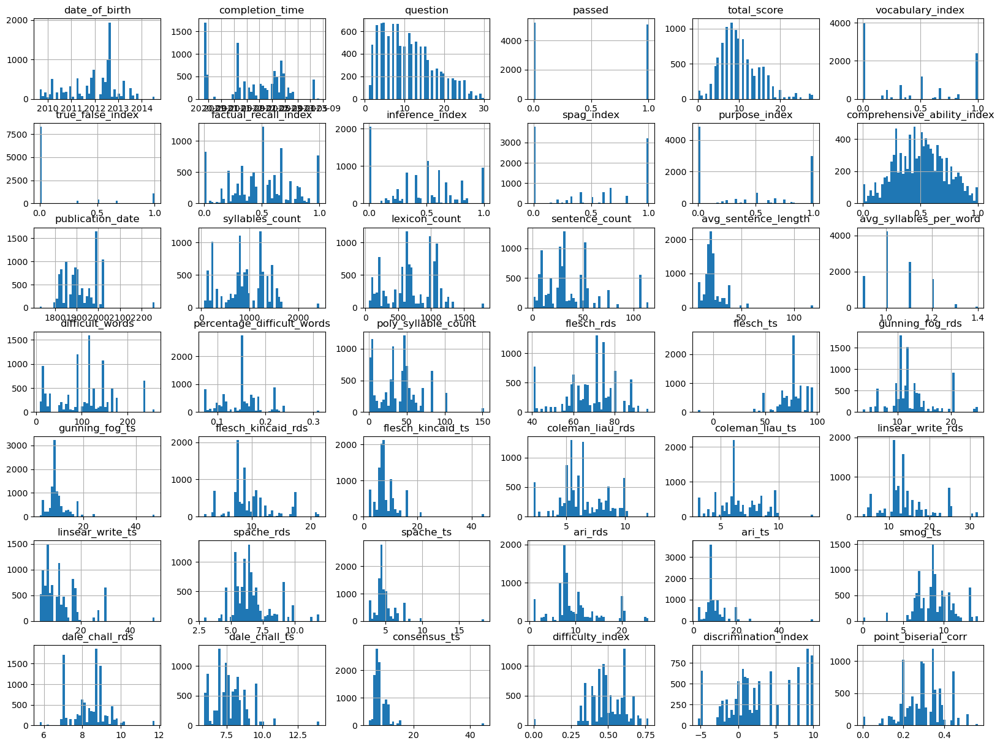

In [129]:
df_train.hist(bins=50, figsize=(20,15))
plt.show()

Spread of Student's Ages at Completion:

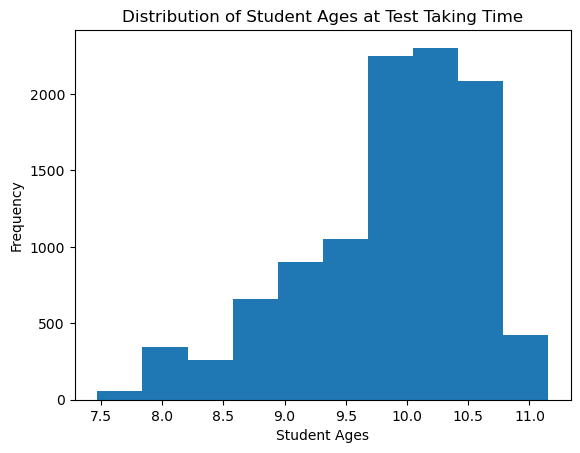

In [130]:
years_per_day = 1 / (365.25 * 24 * 3600)
age_years = df_train.age_at_completion.dt.total_seconds() * years_per_day

age_years.plot(
    kind='hist',
    title='Distribution of Student Ages at Test Taking Time'
)
plt.xlabel('Student Ages')
plt.show()

Summary Statistics for Score per Age:

In [131]:
df_train.assign(
    age_at_completion=lambda x: x.age_at_completion.dt.total_seconds() * years_per_day,
    age_groups=lambda x: pd.cut(
        x.age_at_completion, [0, 8, 9, 10, 11, 12], labels=['Under 8 years', '8-9 years', '9-10 years', '10-11 years', '11-12 years']
    )
).groupby(by='age_groups').agg({
    'total_score':[np.mean, np.std, np.min, np.max],
    'difficulty_index': [np.mean, np.std, np.min, np.max],
    'discrimination_index': [np.mean, np.std, np.min, np.max],
    'point_biserial_corr': [np.mean, np.std, np.min, np.max]
})

total_score                     difficulty_index            \
                     mean       std amin amax             mean       std   
age_groups                                                                 
Under 8 years   16.480263  7.815927    4   28         0.558784  0.081892   
8-9 years       10.043966  5.607738    2   27         0.513271  0.101523   
9-10 years       8.770747  4.104957    0   24         0.503187  0.140243   
10-11 years     10.684232  4.563996    0   25         0.490526  0.100907   
11-12 years     12.769231  6.028273    6   18         0.422860  0.062478   

                                  discrimination_index                      \
                   amin      amax                 mean       std      amin   
age_groups                                                                   
Under 8 years  0.387987  0.611111             8.032337  3.072608  0.545455   
8-9 years      0.322917  0.725000             2.595356  4.923024 -5.333333   
9-10 years     0.000000  0.771429             1.669542  3.561841 -5.333333   
10-11 years    0.000000  0.771429             3.515541  4.556446 -5.000000   
11-12 years    0.352703  0.477073             3.038462  7.158575 -5.000000   

                     point_biserial_corr                                
                amax                mean       std      amin      amax  
age_groups                                                              
Under 8 years  10.00            0.400474  0.061532  0.284110  0.445010  
8-9 years      10.00            0.289189  0.122147  0.000000  0.468114  
9-10 years     10.00            0.285984  0.099742  0.000000  0.565685  
10-11 years    10.00            0.305196  0.081416  0.000000  0.515388  
11-12 years     9.25            0.254834  0.047038  0.202014  0.295649

Relationship between Student's Ages & Scores

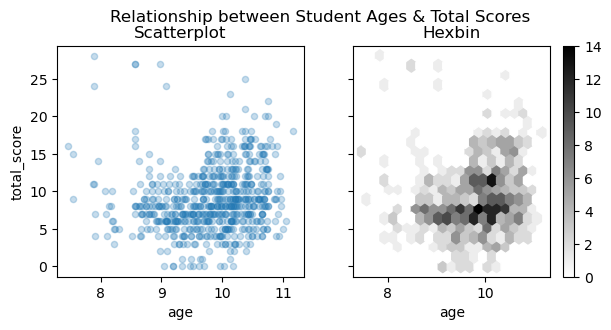

In [132]:
age_scores = pd.DataFrame({
    'student_id':df_train.student_id,
    'text_title':df_train.text_title,
    'age':age_years, 
    'total_score':df_train.total_score
}).drop_duplicates(keep='first')

fig, ax = plt.subplots(1, 2, figsize=(7, 3), sharey=True)
fig.subplots_adjust(hspace=0.5, wspace=0.2)

age_scores.plot(
    kind='scatter', x='age', y='total_score',
    title='Scatterplot',
    alpha=0.25,
    ax=ax.flat[0]
)

age_scores.plot(
    kind='hexbin',
    x='age',
    y='total_score',
    title='Hexbin',
    colormap='gray_r',
    gridsize=20,
    sharex=False,
    ax=ax.flat[1]
)

plt.suptitle('Relationship between Student Ages & Total Scores', y=1)
plt.show()

Many Scores are in the 5–10 range. Is this a function of the number of questions in the test or are students struggling with tests generally:

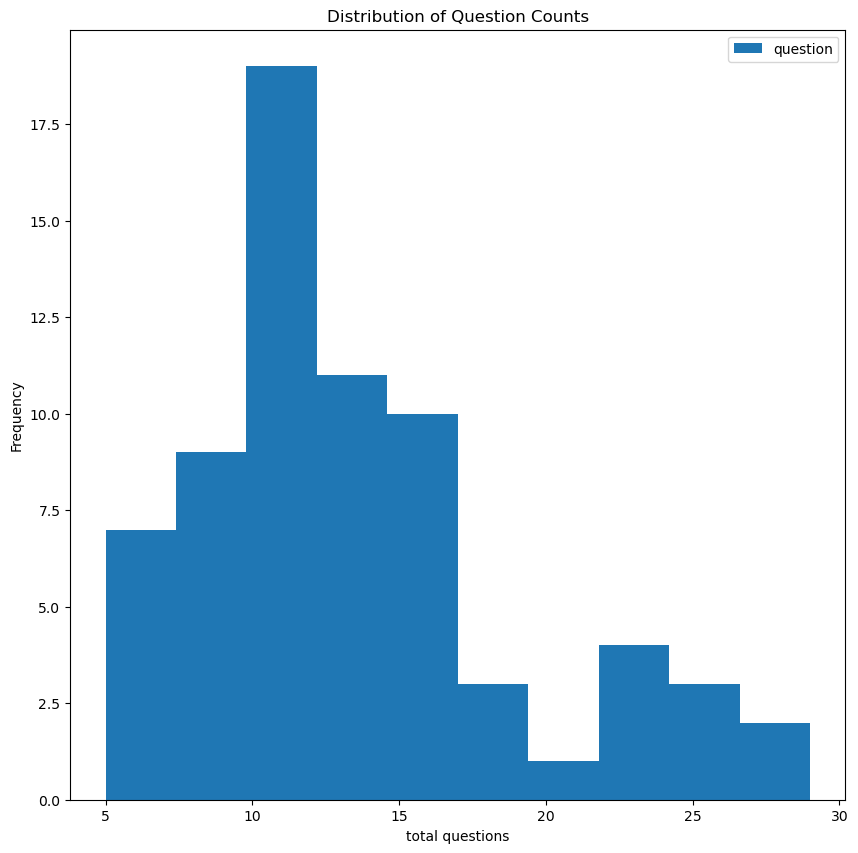

In [133]:
df_train[['text_title', 'question']].drop_duplicates(keep='first').groupby(by='text_title').agg({'question': 'count'}).plot(
    kind='hist',
    figsize=(10, 10),
    title='Distribution of Question Counts',
)
plt.xlabel('total questions')
plt.show()

Questions per Text:

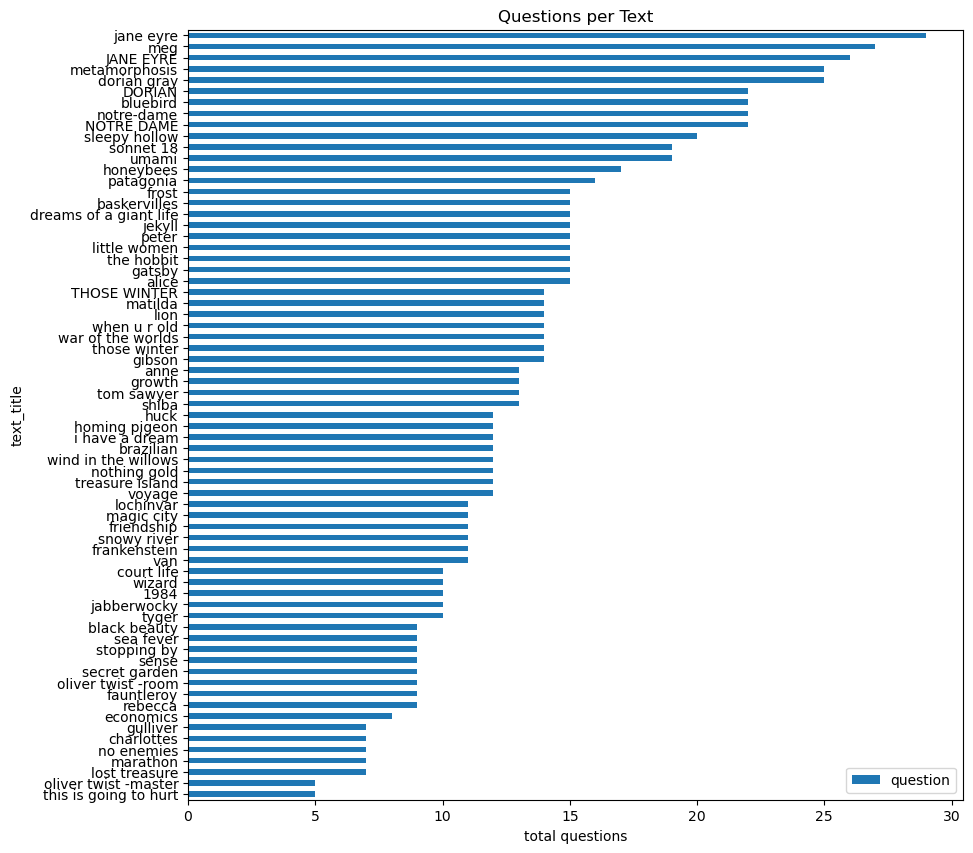

In [134]:
df_train[['text_title', 'question']].drop_duplicates(keep='first').groupby(by='text_title').agg({'question': 'count'}).sort_values(by='question').plot(
    kind='barh',
    figsize=(10, 10),
    title='Questions per Text',
    label='question count',
    legend=True,
)
plt.xlabel('total questions')
plt.show()

Performance & Progress of Students with Multiple Response Entries:

There are texts where students took multiple attempts. We'll measure how students progress through their attempts and calculate the rate of improvement.

It seems that student_id `24` has a duplicate entry recorded as multiple entries. Let's clean it: 

In [135]:
df_train = df_train.drop(
    index=df_train.query('student_id=="24_1"').index
)

df_train = df_train.assign(
    student_id=lambda x: x.student_id.str.replace('24_0', '24')
)

Let's create `publication_year` and `age_year` columns:

In [136]:
df_train = df_train.assign(
    publication_year = lambda x: x.publication_date.dt.year,
    age_year = lambda x: x.age_at_completion.dt.total_seconds() * years_per_day
)

Visualize student's progress for multiple attempts by year attempt was taken:

In [137]:
mult_entr = df_train.query(f'student_id.str.contains("_")').student_id.unique().tolist()

students = list(set([a.split('_')[0] for a in mult_entr]))

mult_texts = df_train.query(f'student_id.isin({mult_entr})').text_title.unique().tolist()

rel_cols = ['student_id', 'text_title', 'completion_time', 'age_at_completion', 'total_score']

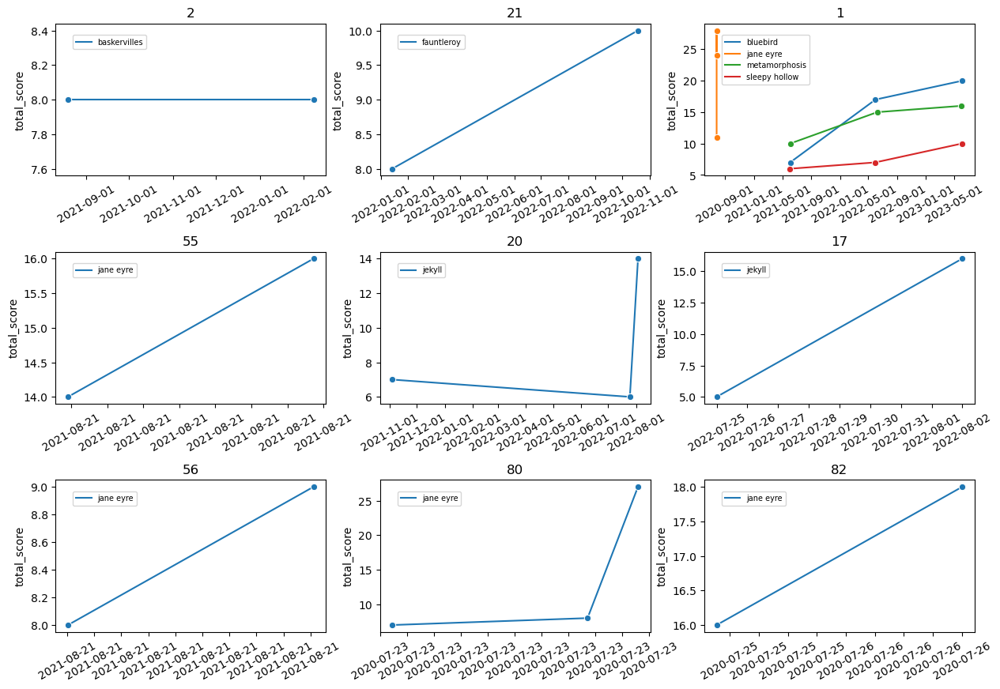

In [138]:
fig, ax = plt.subplots(3, 3, figsize=(15, 10))
fig.subplots_adjust(hspace=0.5, wspace=0.2)


for ax, student in zip(ax.flat, students[:9]):
    sns.lineplot(
        x='completion_time',
        y='total_score',
        hue='text_title',
        data=df_train.query(f'student_id.str.contains("^{student}_", regex=True) &  text_title.isin({mult_texts})')[rel_cols].drop_duplicates(),
        marker='o',
        ax=ax
    )
    ax.set_xticks(ax.get_xticks())
    ax.set_xticklabels(ax.get_xticklabels(), rotation=30)
    ax.legend(loc='upper left', bbox_to_anchor=(0.05, 0.95), fontsize=7)

    ax.set_xlabel('')
    ax.set_title(student)
plt.show()

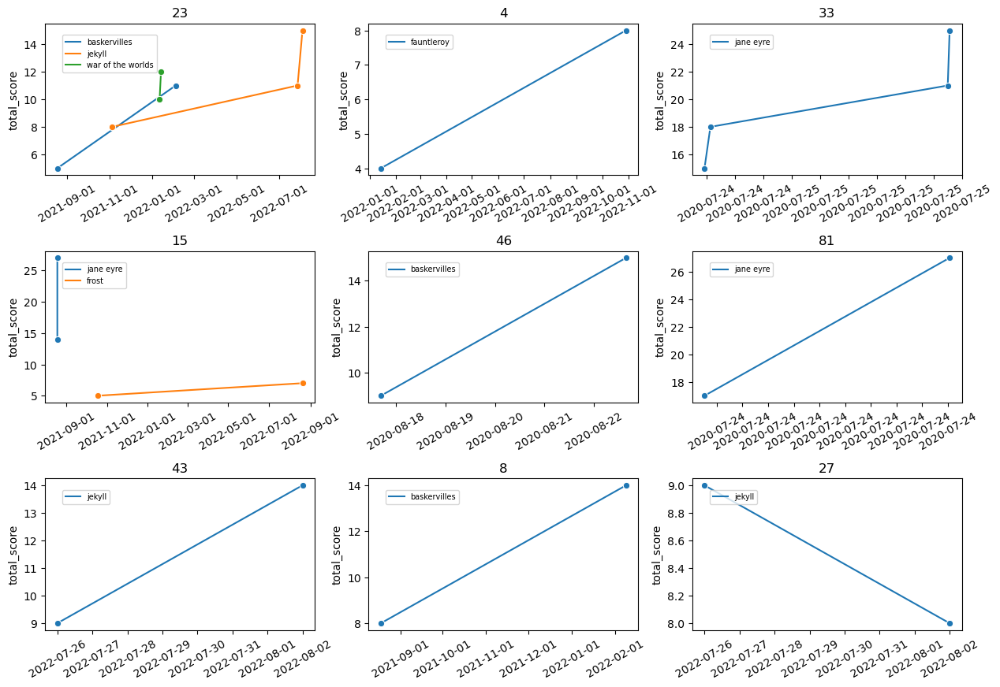

In [139]:
fig, ax = plt.subplots(3, 3, figsize=(15, 10))
fig.subplots_adjust(hspace=0.5, wspace=0.2)

for ax, student in zip(ax.flat, students[9:]):
    sns.lineplot(
        x='completion_time',
        y='total_score',
        hue='text_title',
        data=df_train.query(f'student_id.str.contains("^{student}_", regex=True) &  text_title.isin({mult_texts})')[rel_cols].drop_duplicates(),
        marker='o',
        ax=ax
    )
    ax.set_xticks(ax.get_xticks())
    ax.set_xticklabels(ax.get_xticklabels(), rotation=30)
    ax.legend(loc='upper left', bbox_to_anchor=(0.05, 0.95), fontsize=7)

    ax.set_xlabel('')
    ax.set_title(student)
plt.show()

Visualize student's progress for multiple attempts by age attempt was taken:

Here, we see clearer that a few students took the progress attempts in the same year/ period. 

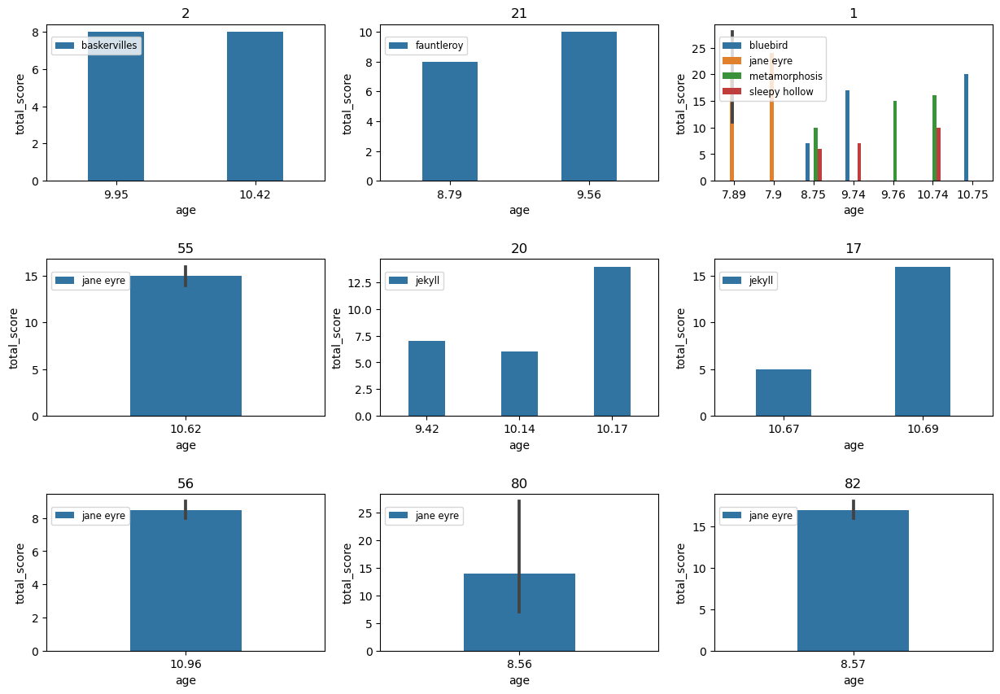

In [140]:
fig, ax = plt.subplots(3, 3, figsize=(15, 10))
fig.subplots_adjust(hspace=0.5, wspace=0.2)
age_scores.age = round(age_scores.age, 2)

for ax, student in zip(ax.flat, students[:9]):
    sns.barplot(
        x='age',
        y='total_score',
        width=0.4,
        hue='text_title',
        data=age_scores.query(f'student_id.str.contains("^{student}_", regex=True) & text_title.isin({mult_texts})').drop_duplicates(),
        ax=ax
    )
    ax.legend(loc='upper left', 
              bbox_to_anchor=(0.00, 0.95), fontsize='small')
    ax.set_xlabel('age')
    ax.set_title(student)
plt.show()

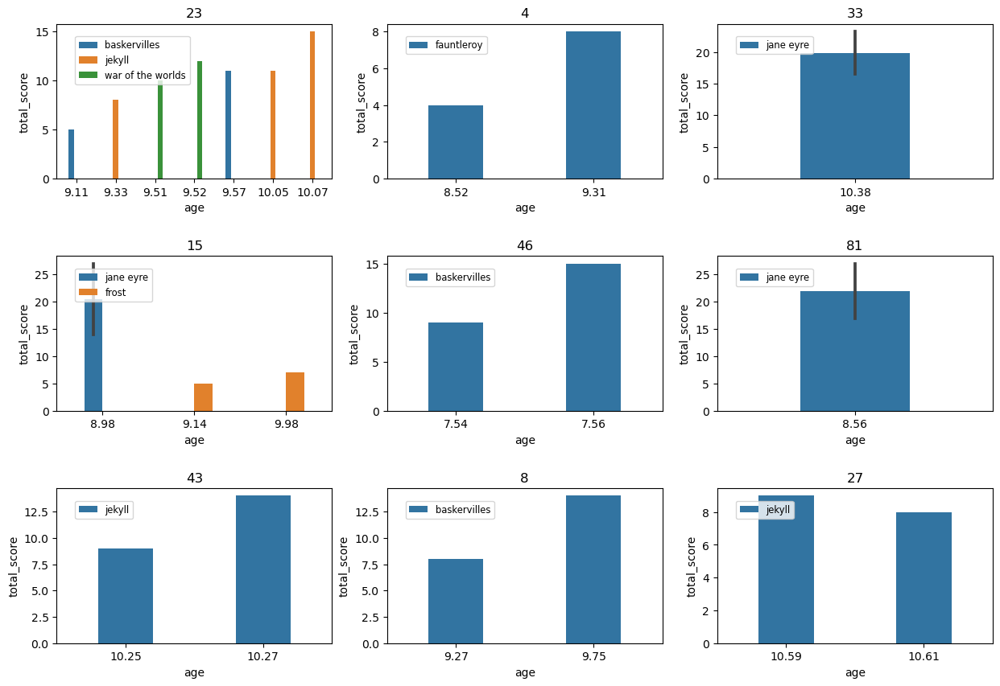

In [141]:
fig, ax = plt.subplots(3, 3, figsize=(15, 10))
fig.subplots_adjust(hspace=0.5, wspace=0.2)

for ax, student in zip(ax.flat, students[9:]):
    sns.barplot(
        x='age',
        y='total_score',
        width=0.4,
        hue='text_title',
        data=age_scores.query(f'student_id.str.contains("^{student}_", regex=True) & text_title.isin({mult_texts})').drop_duplicates(),
        ax=ax
    )
    ax.legend(loc='upper left',
              bbox_to_anchor=(0.05, 0.95), fontsize='small')
    ax.set_xlabel('age')
    ax.set_title(student)
plt.show()

Calculate Rate of Improvement:

In [142]:
rel_cols = [
    'student_id', 'text_title', 'completion_time', 'age_year', 'total_score'
]
id_text_age_score = list()

for student in students:
    for ind, row in df_train.query(f'student_id.str.contains("^{student}_", regex=True) &  text_title.isin({mult_texts})')[rel_cols].drop_duplicates().iterrows():
        id_text_age_score.append([ind, student, row['text_title'], row['completion_time'], row['age_year'], row['total_score']])
    

In [143]:
progress_df = pd.DataFrame(id_text_age_score, columns=[
    'index', 'student_id', 'text_title', 'completion_time', 'age_years', 'total_score'
]).set_index('index').sort_values(by=[
    'student_id', 'text_title', 'completion_time'
]).assign(
    progress_rate_val=lambda x:x.groupby(['student_id', 'text_title'])['total_score'].diff(),
    progress_rate_delta=lambda x:x.groupby(['student_id', 'text_title'])['completion_time'].diff(),
    progress_rate_wk=lambda x: np.where(
        pd.to_numeric(x.progress_rate_delta) / (7 * 24 * 60 * 60 * 1e9) > 0,
        round(pd.to_numeric(x.progress_rate_delta) / (7 * 24 * 60 * 60 * 1e9), 3),
        np.nan
    ),
    progress_rate=lambda x:np.where(
        x.progress_rate_wk > .1,
        round(x.progress_rate_val / x.progress_rate_wk, 3),
        np.nan
    )
)

progress_df

,student_id,text_title,completion_time,age_years,total_score,progress_rate_val,progress_rate_delta,progress_rate_wk,progress_rate
index,,,,,,,,,
10493,1,bluebird,2021-06-03 09:44:16.342,8.748544,7,NaN,NaT,NaN,NaN
10969,1,bluebird,2022-05-31 09:16:51.000,9.739594,17,10.0,361 days 23:32:34.658000,51.712,0.193
10731,1,bluebird,2023-06-03 23:46:03.461,10.748776,20,3.0,368 days 14:29:12.461000,52.658,0.057
10518,1,jane eyre,2020-07-26 15:14:48.534,7.894963,11,NaN,NaT,NaN,NaN
10756,1,jane eyre,2020-07-26 15:20:16.440,7.894974,28,17.0,0 days 00:05:27.906000,0.001,NaN
10994,1,jane eyre,2020-07-26 18:47:02.852,7.895367,24,-4.0,0 days 03:26:46.412000,0.021,NaN
10575,1,metamorphosis,2021-06-03 09:12:25.581,8.748484,10,NaN,NaT,NaN,NaN
11051,1,metamorphosis,2022-06-07 20:11:01.889,9.760003,15,5.0,369 days 10:58:36.308000,52.780,0.095
10813,1,metamorphosis,2023-05-30 08:51:55.000,10.736124,16,1.0,356 days 12:40:53.111000,50.933,0.020


In [144]:
progress_df.groupby(by=['student_id', 'text_title']).agg("mean", numeric_only=True)

age_years  total_score  progress_rate_val  \
student_id text_title                                                     
1          bluebird            9.745638    14.666667           6.500000   
           jane eyre           7.895101    21.000000           6.500000   
           metamorphosis       9.748204    13.666667           3.000000   
           sleepy hollow       9.741779     7.666667           2.000000   
15         frost               9.563313     6.000000           2.000000   
           jane eyre           8.979665    20.500000          13.000000   
17         jekyll             10.683094    10.500000          11.000000   
2          baskervilles       10.186174     8.000000           0.000000   
20         jekyll              9.909195     9.000000           3.500000   
21         fauntleroy          9.174538     9.000000           2.000000   
23         baskervilles        9.342916     8.000000           6.000000   
           jekyll              9.815195    11.333333           3.500000   
           war of the worlds   9.514031    11.000000           2.000000   
27         jekyll             10.596851     8.500000          -1.000000   
33         jane eyre          10.376746    19.750000           3.333333   
4          fauntleroy          8.917180     6.000000           4.000000   
43         jekyll             10.262834    11.500000           5.000000   
46         baskervilles        7.548730    12.000000           6.000000   
55         jane eyre          10.616333    15.000000           2.000000   
56         jane eyre          10.961418     8.500000           1.000000   
8          baskervilles        9.507187    11.000000           6.000000   
80         jane eyre           8.559643    14.000000          10.000000   
81         jane eyre           8.562431    22.000000          10.000000   
82         jane eyre           8.566660    17.000000           2.000000   

                              progress_rate_wk  progress_rate  
student_id text_title                                          
1          bluebird                  52.185000         0.1250  
           jane eyre                  0.011000            NaN  
           metamorphosis             51.856500         0.0575  
           sleepy hollow             52.092500         0.0380  
15         frost                     43.714000         0.0460  
           jane eyre                  0.001000            NaN  
17         jekyll                     1.143000         9.6240  
2          baskervilles              24.714000         0.0000  
20         jekyll                    19.428500         3.0970  
21         fauntleroy                39.714000         0.0500  
23         baskervilles              24.143000         0.2490  
           jekyll                    19.428500         2.0395  
           war of the worlds          0.286000         6.9930  
27         jekyll                     1.000000        -1.0000  
33         jane eyre                  0.034333            NaN  
4          fauntleroy                41.143000         0.0970  
43         jekyll                     1.000000         5.0000  
46         baskervilles               0.708000         8.4750  
55         jane eyre                  0.001000            NaN  
56         jane eyre                  0.027000            NaN  
8          baskervilles              25.000000         0.2400  
80         jane eyre                  0.002500            NaN  
81         jane eyre                  0.001000            NaN  
82         jane eyre                  0.151000        13.2450

In [145]:
df_train['progress_rate'] = 0

for ind, row in df_train.iterrows():
    for ind2, row2 in progress_df.iterrows():
        if ind==ind2:
            df_train.at[ind, 'progress_rate'] = progress_df.at[ind2, 'progress_rate']

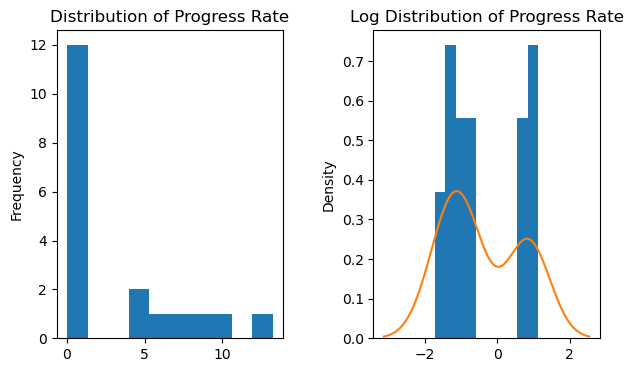

In [146]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(7, 4))
fig.subplots_adjust(wspace=0.4)

df_train.query('progress_rate > 0').progress_rate.plot(
    kind='hist',
    title='Distribution of Progress Rate',
    ax=ax1
)

df_train.query('progress_rate > 0').assign(
    progress_rate=lambda x: np.log10(x.progress_rate)
).progress_rate.plot(
    kind='hist',
    density=True,
    title='Log Distribution of Progress Rate',
    ax=ax2
)
df_train.query('progress_rate > 0').assign(
    progress_rate=lambda x: np.log10(x.progress_rate)
).progress_rate.plot(
    kind='kde',
    title='Log Distribution of Progress Rate',
    ax=ax2
)

plt.show()

For correlation and ML purposes, we may consider log_progress_rate:

In [147]:
df_train['log_progress_rate'] = np.log10(df_train.progress_rate)

/opt/homebrew/Caskroom/miniforge/base/envs/mlp/lib/python3.10/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/opt/homebrew/Caskroom/miniforge/base/envs/mlp/lib/python3.10/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


Spread of Student's Skills

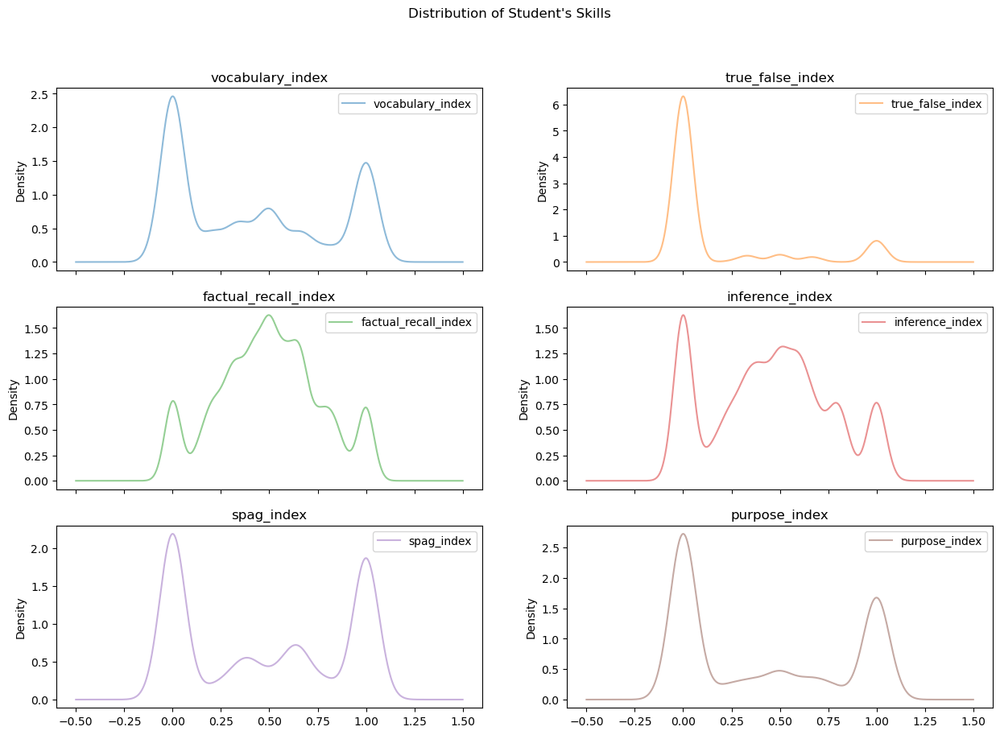

In [148]:
student_skills = [
    'vocabulary_index', 'true_false_index', 'factual_recall_index', 'inference_index', 'spag_index', 'purpose_index', 'comprehensive_ability_index',
]

df_train[student_skills[:-1]].plot(
    kind='kde',
    subplots=True,
    layout=(3, 2),
    figsize=(15, 10),
    alpha=0.5,
    title=student_skills[:-1]
)

plt.suptitle('Distribution of Student\'s Skills')
plt.show()

Vocabulary, grammar and purpose indexes have bimodal distributions. True-False index is right skewed, and factual recall and inference indexes are tri-modal distributions.

Relationship between Skills and Age

In [149]:
age_skills = pd.DataFrame({
    'student_id':df_train.student_id,
    'text_title':df_train.text_title,
    'age':age_years,
    'vocabulary_index':df_train[student_skills[0]],
    'true_false_index':df_train[student_skills[1]],
    'factual_recall_index':df_train[student_skills[2]],
    'inference_index':df_train[student_skills[3]],
    'spag_index':df_train[student_skills[4]],
    'purpose_index':df_train[student_skills[5]],
    'comprehensive_ability_index':df_train[student_skills[6]],
}).drop_duplicates(keep='first')

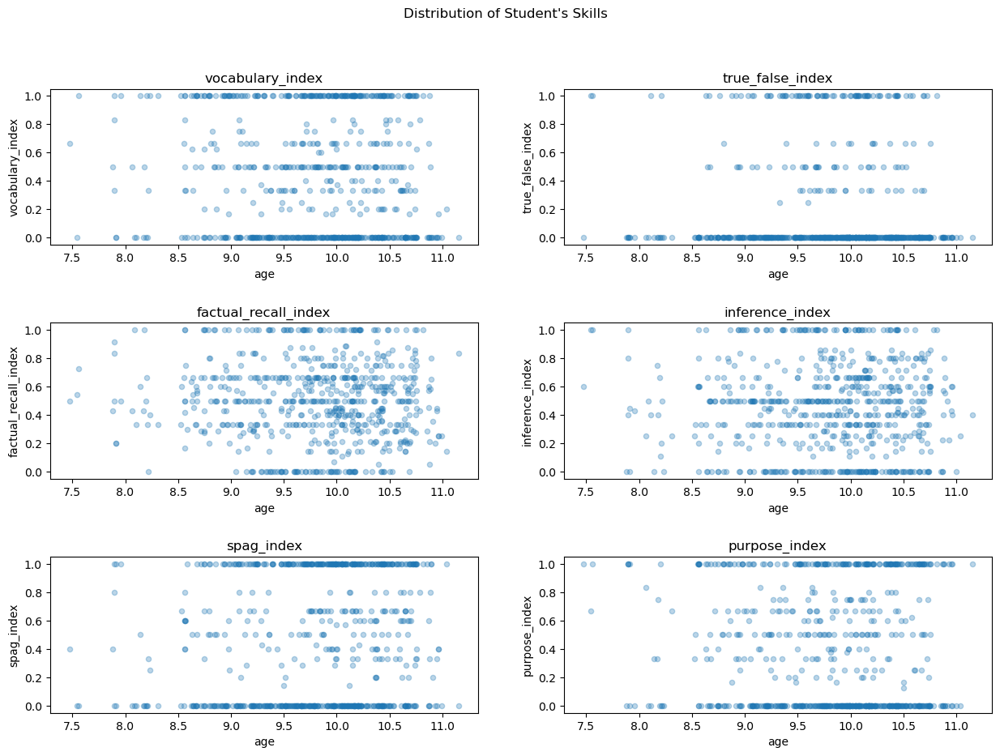

In [150]:
fig, ax = plt.subplots(3, 2, figsize=(15, 10))
fig.subplots_adjust(hspace=0.5, wspace=0.2)

for ax, skill in zip(ax.flat, student_skills[:-1]):
    age_skills.plot(
        kind='scatter',
        x='age', 
        y=skill,
        alpha=.3,
        title=skill,
        ax=ax
    )

plt.suptitle('Distribution of Student\'s Skills')
plt.show()

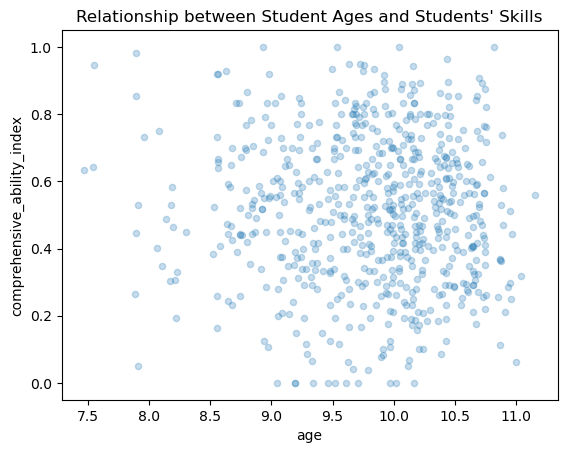

In [151]:
age_skills.plot(
    kind='scatter', 
    x='age', 
    y='comprehensive_ability_index',
    title='Relationship between Student Ages and Students\' Skills',
    alpha=0.25
)

plt.show()

Spread of Question Type

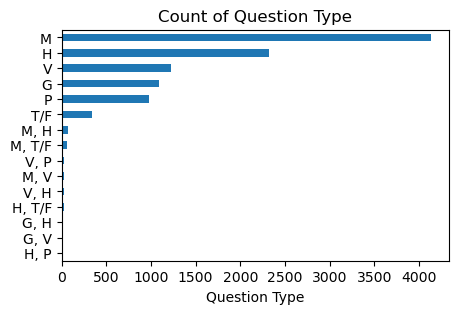

In [152]:
df_train.question_type.value_counts().plot(
    kind='barh', 
    figsize=(5, 3),
    title='Count of Question Type'
).invert_yaxis()
plt.xlabel('Question Type')
plt.show()

Relationship between Question Type and Scores

In [153]:
qtypes = ['G', 'H', 'M', 'P', 'V', 'T/F']
df_train.query(f'question_type.isin({qtypes})').pivot(
    columns='question_type',
    values='total_score'
).describe()

question_type,G,H,M,P,T/F,V
count,1085.000000,2320.000000,4133.000000,974.000000,334.000000,1228.000000
mean,9.989862,9.705172,10.599081,9.414784,8.320359,10.434039
std,5.560377,4.542661,4.850691,4.150859,4.112064,5.572056
min,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000
25%,6.000000,7.000000,7.000000,7.000000,6.000000,7.000000
50%,9.000000,9.000000,10.000000,9.000000,8.000000,9.000000
75%,13.000000,12.000000,14.000000,12.000000,11.000000,13.000000
max,28.000000,28.000000,28.000000,28.000000,23.000000,28.000000


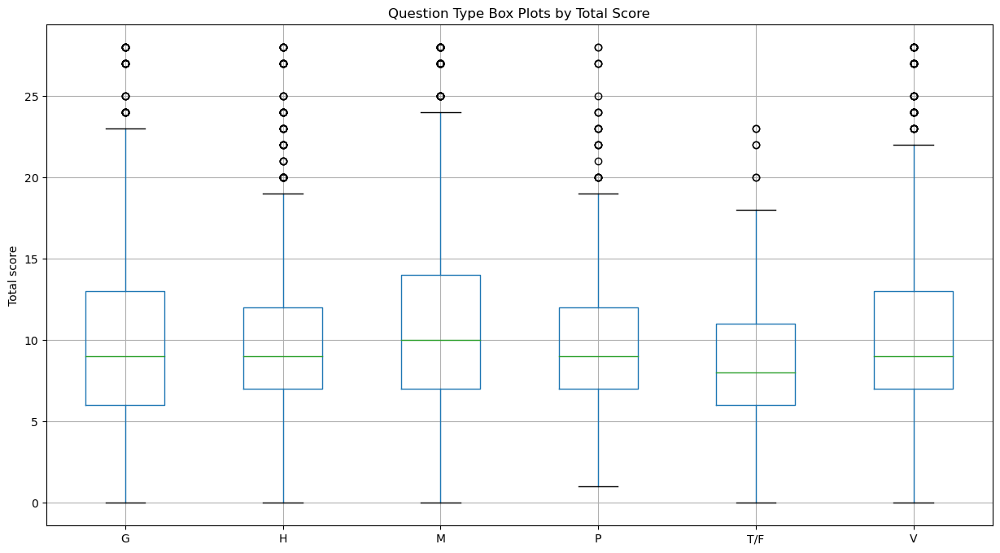

In [154]:
df_train.query(f'question_type.isin({qtypes})').pivot(
    columns='question_type',
    values='total_score'
).boxplot(
    figsize=(15, 8)
)
plt.title('Question Type Box Plots by Total Score')
plt.ylabel('Total score')
plt.show()

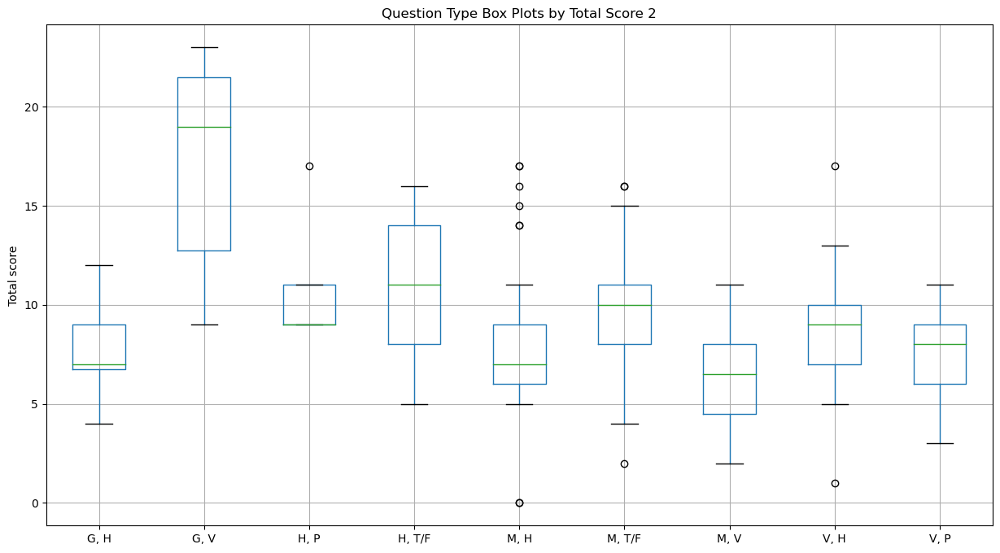

In [155]:
qtypes_2 = [
    'M, T/F', 'M, H', 'M, V', 'G, H', 'V, P', 
    'V, H', 'H, P', 'G, V', 'H, T/F'
]
df_train.query(f'question_type.isin({qtypes_2})').pivot(
    columns='question_type',
    values='total_score'
).boxplot(
    figsize=(15, 8)
)
plt.title('Question Type Box Plots by Total Score 2')
plt.ylabel('Total score')
plt.show()

Distribution of Total scores

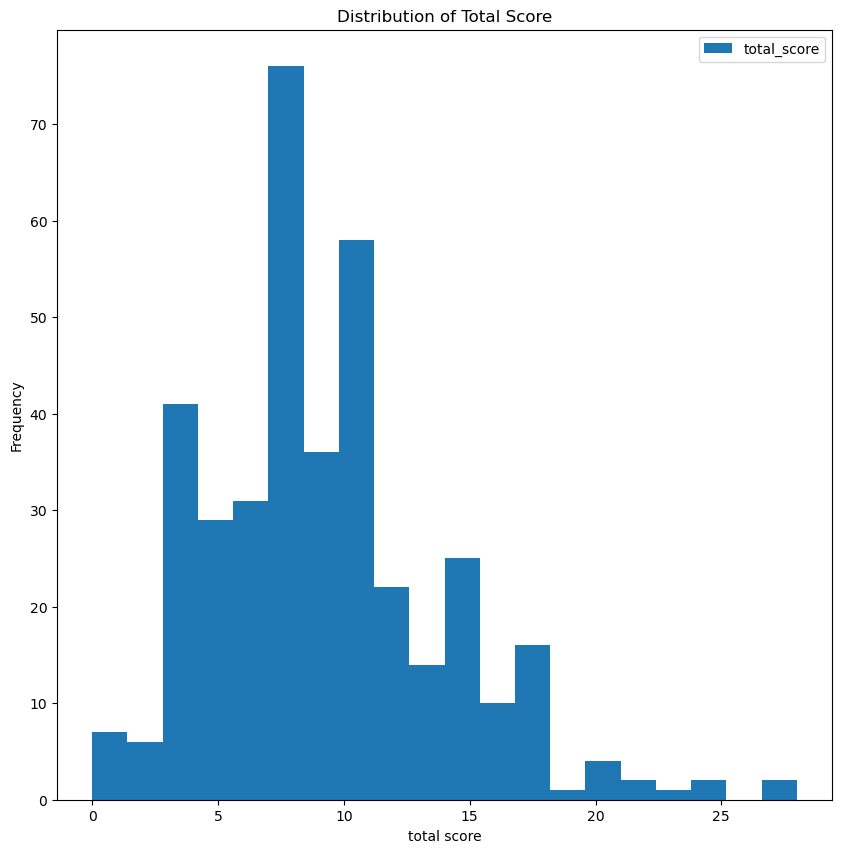

In [156]:
df_train[['text_title', 'total_score']].drop_duplicates(keep='first').set_index('text_title').plot(
    kind='hist',
    bins=20,
    figsize=(10, 10),
    title='Distribution of Total Score',
)
plt.xlabel('total score')
plt.show()

Distribution of Total Scores by Text Genres

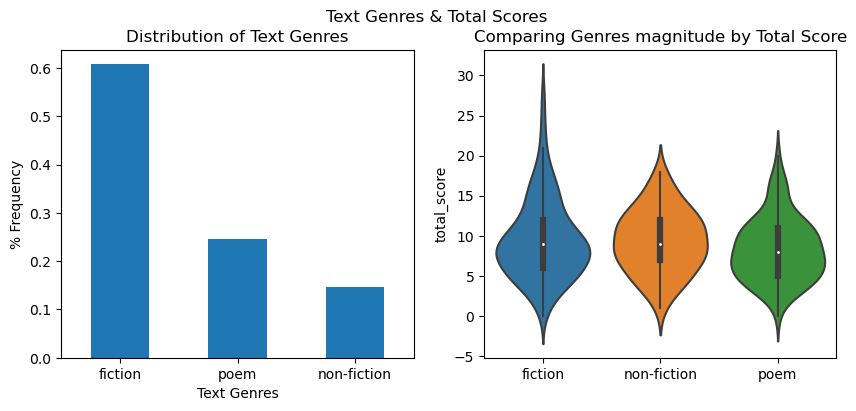

In [157]:
genre_score = df_train[['text_title', 'text_genres', 'total_score']].drop_duplicates()

fig, axes = plt.subplots(1, 2, figsize=(10, 4))

df_train.text_genres.value_counts(dropna=False, normalize=True).plot(
    kind='bar', title='Distribution of Text Genres',
    xlabel='Text Genres', ylabel='% Frequency',
    rot='horizontal', ax=axes.flat[0]
)

sns.violinplot(
    x='text_genres', y='total_score', data=genre_score,
    ax=axes.flat[1], scale='width'
)
axes.flat[1].set_xlabel('')
axes.flat[1].set_title('Comparing Genres magnitude by Total Score')

plt.suptitle('Text Genres & Total Scores')
plt.show()

Spread of Difficulty Index

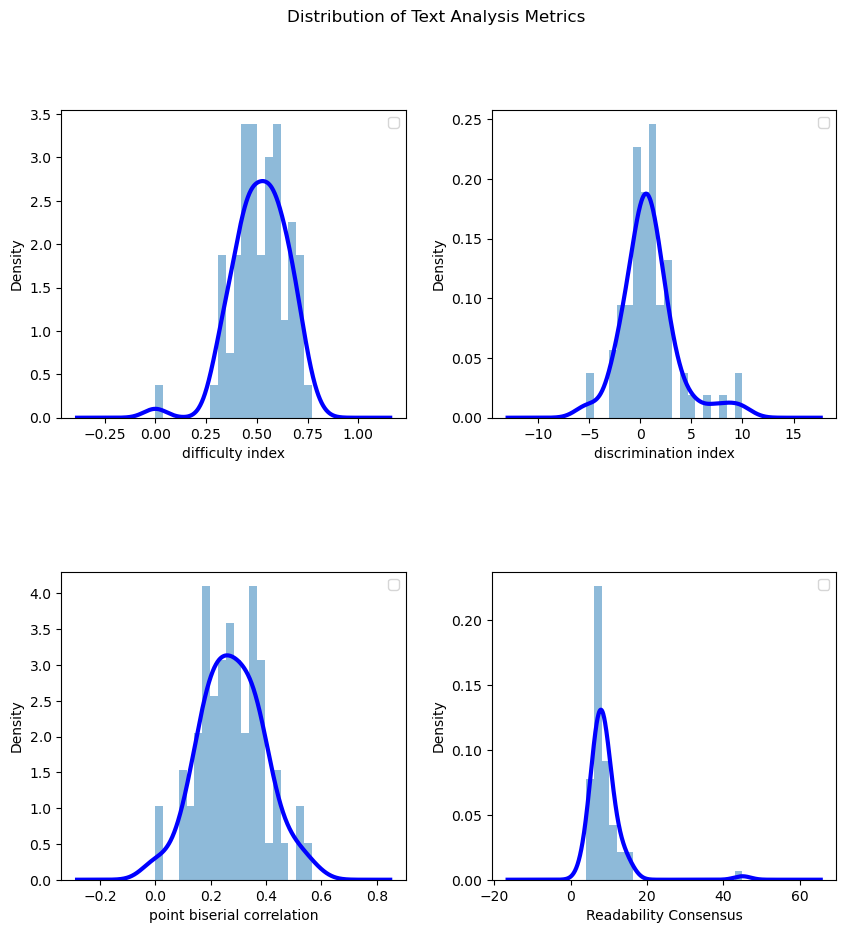

In [158]:
fig, ax = plt.subplots(2, 2, figsize=(10, 10))
fig.subplots_adjust(hspace=0.5, wspace=0.25)

df_train[['text_title', 'difficulty_index']].drop_duplicates(keep='first').set_index('text_title').plot(
    kind='hist',
    bins=20,
    density=True,
    alpha=0.5,
    ax=ax.flat[0]
)
df_train[['text_title', 'difficulty_index']].drop_duplicates(keep='first').set_index('text_title').plot(
    ax=ax.flat[0], kind='kde', color='blue',
    linewidth=3,
)
ax.flat[0].set_xlabel('difficulty index')
ax.flat[0].legend('')

df_train[['text_title', 'discrimination_index']].drop_duplicates(keep='first').set_index('text_title').plot(
    kind='hist',
    bins=20,
    density=True,
    alpha=0.5,
    ax=ax.flat[1]
)
df_train[['text_title', 'discrimination_index']].drop_duplicates(keep='first').set_index('text_title').plot(
    ax=ax.flat[1], kind='kde', color='blue',
    linewidth=3,
)
ax.flat[1].set_xlabel('discrimination index')
ax.flat[1].legend('')

df_train[['text_title', 'point_biserial_corr']].drop_duplicates(keep='first').set_index('text_title').plot(
    kind='hist',
    bins=20,
    density=True,
    alpha=0.5,
    ax=ax.flat[2]
)
df_train[['text_title', 'point_biserial_corr']].drop_duplicates(keep='first').set_index('text_title').plot(
    ax=ax.flat[2], kind='kde', color='blue',
    linewidth=3,
)
ax.flat[2].set_xlabel('point biserial correlation')
ax.flat[2].legend('')

df_train[['text_title', 'consensus_ts']].drop_duplicates(keep='first').set_index('text_title').plot(
    kind='hist',
    bins=20,
    density=True,
    alpha=0.5,
    ax=ax.flat[3]
)
df_train[['text_title', 'consensus_ts']].drop_duplicates(keep='first').set_index('text_title').plot(
    ax=ax.flat[3], kind='kde', color='blue',
    linewidth=3,
)
ax.flat[3].set_xlabel('Readability Consensus')
ax.flat[3].legend('')

plt.suptitle('Distribution of Text Analysis Metrics')
plt.show()

Relationship Between Difficulty and Discrimination Index

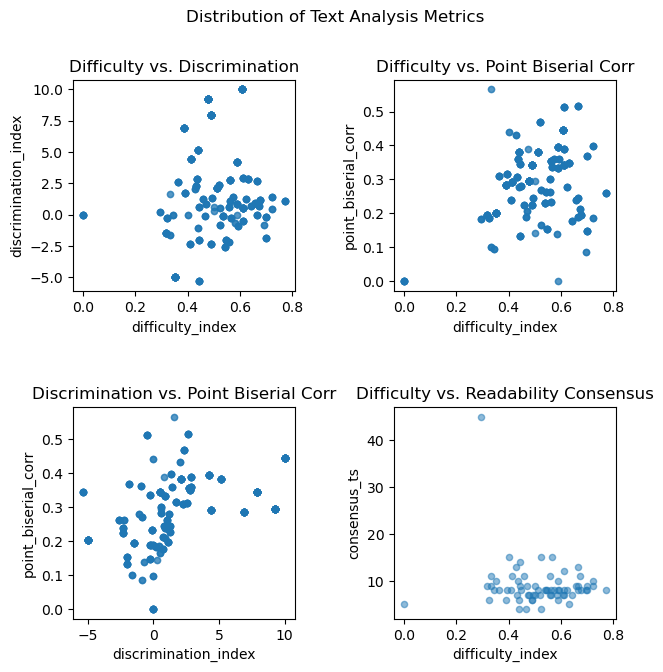

In [159]:
fig, axes = plt.subplots(2, 2, figsize=(7, 7))
fig.subplots_adjust(hspace=.55, wspace=.45)

text_analysis = df_train[[
    'student_id', 'text_title', 'text_genres', 'difficulty_index', 'discrimination_index', 'difficult_words', 'point_biserial_corr', 'consensus_ts', 'total_score', 'lexicon_count', 'publication_date', 'comprehensive_ability_index',
]].drop_duplicates(keep='first')

text_analysis.plot(
    kind='scatter',
    x='difficulty_index', y='discrimination_index',
    alpha=0.5,
    title='Difficulty vs. Discrimination',
    ax=axes.flat[0]
)

text_analysis.plot(
    kind='scatter',
    x='difficulty_index', y='point_biserial_corr',
    alpha=0.5,
    title='Difficulty vs. Point Biserial Corr',
    ax=axes.flat[1]
)

text_analysis.plot(
    kind='scatter',
    x='discrimination_index', y='point_biserial_corr',
    alpha=0.5,
    title='Discrimination vs. Point Biserial Corr',
    ax=axes.flat[2]
)

df_train[[
    'text_title', 'text_genres', 'difficulty_index',  'consensus_ts',
]].drop_duplicates(keep='first').plot(
    kind='scatter',
    x='difficulty_index', y='consensus_ts',
    alpha=0.5,
    title='Difficulty vs. Readability Consensus',
    ax=axes.flat[3]
)

plt.suptitle('Distribution of Text Analysis Metrics')
plt.show()

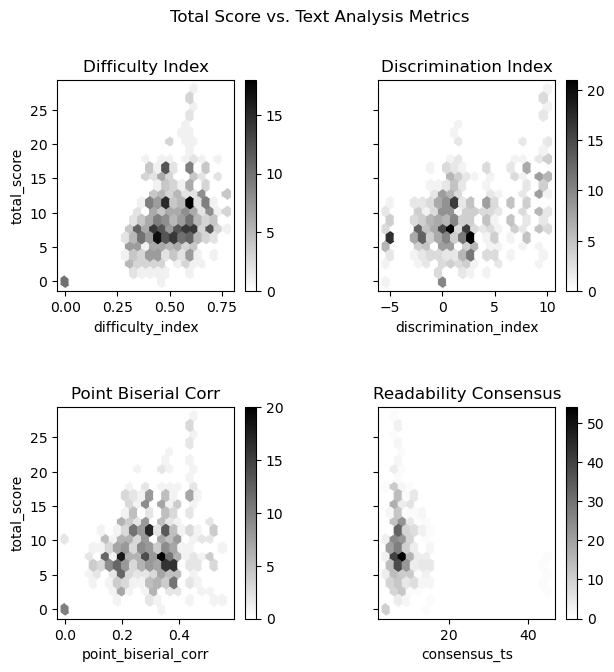

In [160]:
fig, axes = plt.subplots(2, 2, figsize=(7, 7), sharey=True)
fig.subplots_adjust(hspace=.55, wspace=.45)

text_analysis.plot(
    kind='hexbin',
    x='difficulty_index', y='total_score',
    colormap='gray_r',
    gridsize=20,
    sharex=False,
    title='Difficulty Index',
    ax=axes.flat[0]
)

text_analysis.plot(
    kind='hexbin',
    x='discrimination_index', y='total_score',
    colormap='gray_r',
    gridsize=20,
    sharex=False,
    title='Discrimination Index',
    ax=axes.flat[1]
)

text_analysis.plot(
    kind='hexbin',
    x='point_biserial_corr', y='total_score',
    colormap='gray_r',
    gridsize=20,
    sharex=False,
    title='Point Biserial Corr',
    ax=axes.flat[2]
)

text_analysis.plot(
    kind='hexbin',
    x='consensus_ts', y='total_score',
    colormap='gray_r',
    gridsize=20,
    sharex=False,
    title='Readability Consensus',
    ax=axes.flat[3]
)

plt.suptitle('Total Score vs. Text Analysis Metrics')
plt.show()

Relationship between genre, length of text, the complexity of the text (vocabulary, sentence structures), and time in which it was written and total score.

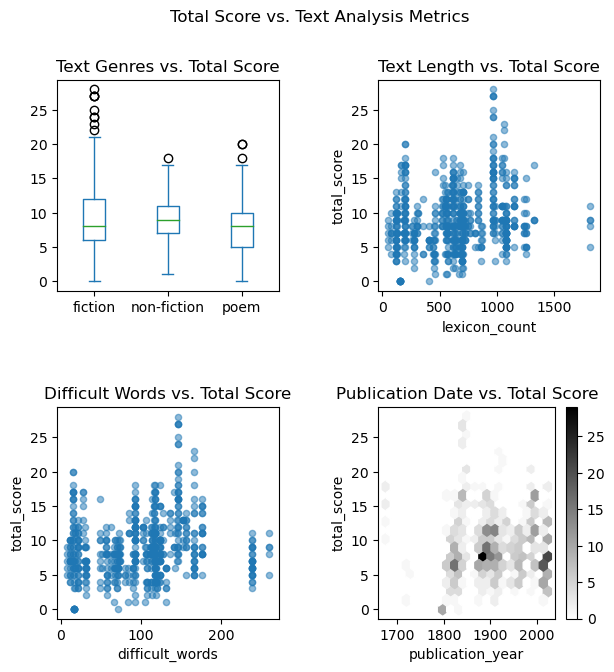

In [161]:
fig, axes = plt.subplots(2, 2, figsize=(7, 7))
fig.subplots_adjust(hspace=.55, wspace=.45)

text_analysis.pivot(
    columns='text_genres',
    values='total_score'
).plot(
    kind='box',
    title='Text Genres vs. Total Score',
    ax=axes.flat[0]
)

text_analysis.plot(
    kind='scatter',
    x='lexicon_count', y='total_score',
    alpha=0.5,
    title='Text Length vs. Total Score',
    ax=axes.flat[1]
)

text_analysis.plot(
    kind='scatter',
    x='difficult_words', y='total_score',
    alpha=0.5,
    title='Difficult Words vs. Total Score',
    ax=axes.flat[2]
)

text_analysis.assign(
    publication_year=lambda x:x.publication_date.dt.year
).plot(
    kind='hexbin',
    x='publication_year', y='total_score',
    colormap='gray_r',
    gridsize=20,
    sharex=False,
    title='Publication Date vs. Total Score',
    ax=axes.flat[3]
)

plt.suptitle('Total Score vs. Text Analysis Metrics')
plt.show()

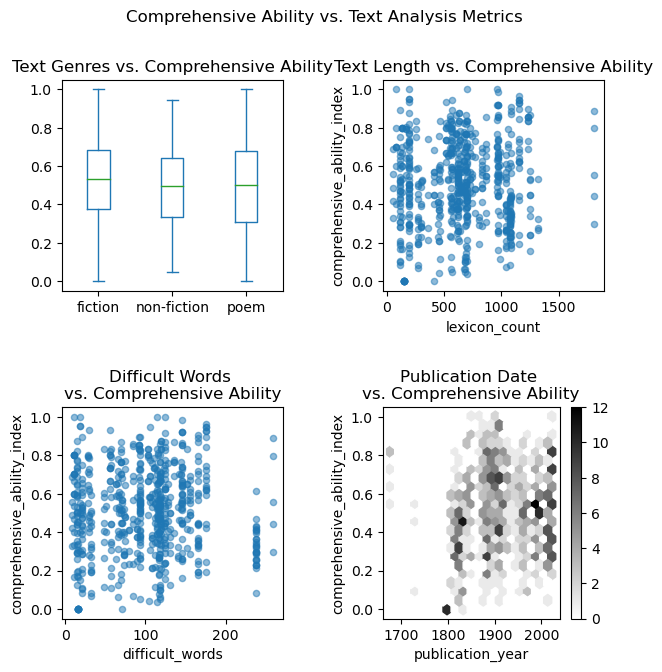

In [162]:
fig, axes = plt.subplots(2, 2, figsize=(7, 7))
fig.subplots_adjust(hspace=.55, wspace=.45)

text_analysis.pivot(
    columns='text_genres',
    values='comprehensive_ability_index'
).plot(
    kind='box',
    title='Text Genres vs. Comprehensive Ability',
    ax=axes.flat[0]
)

text_analysis.plot(
    kind='scatter',
    x='lexicon_count', y='comprehensive_ability_index',
    alpha=0.5,
    title='Text Length vs. Comprehensive Ability',
    ax=axes.flat[1]
)

text_analysis.plot(
    kind='scatter',
    x='difficult_words', y='comprehensive_ability_index',
    alpha=0.5,
    title='Difficult Words \nvs. Comprehensive Ability',
    ax=axes.flat[2]
)

text_analysis.assign(
    publication_year=lambda x:x.publication_date.dt.year
).plot(
    kind='hexbin',
    x='publication_year', y='comprehensive_ability_index',
    colormap='gray_r',
    gridsize=20,
    sharex=False,
    title='Publication Date \nvs. Comprehensive Ability',
    ax=axes.flat[3]
)

plt.suptitle('Comprehensive Ability vs. Text Analysis Metrics')
plt.show()

Text Metrics Compared:

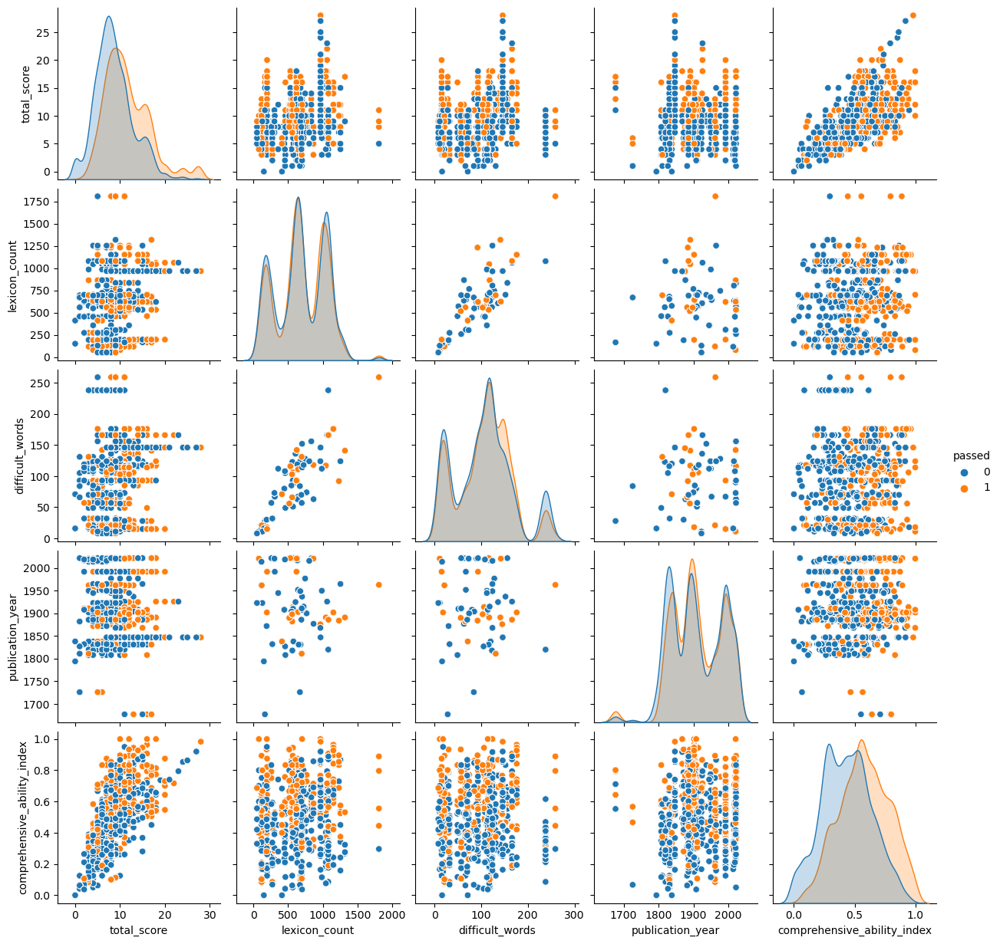

In [163]:
rel_cols = [
    'passed', 'total_score', 'lexicon_count', 'difficult_words', 'publication_year', 'comprehensive_ability_index',
]
sns.pairplot(
    df_train[rel_cols],
    diag_kind='kde',
    hue='passed'
)
plt.show()

Relationship between Numerical Features

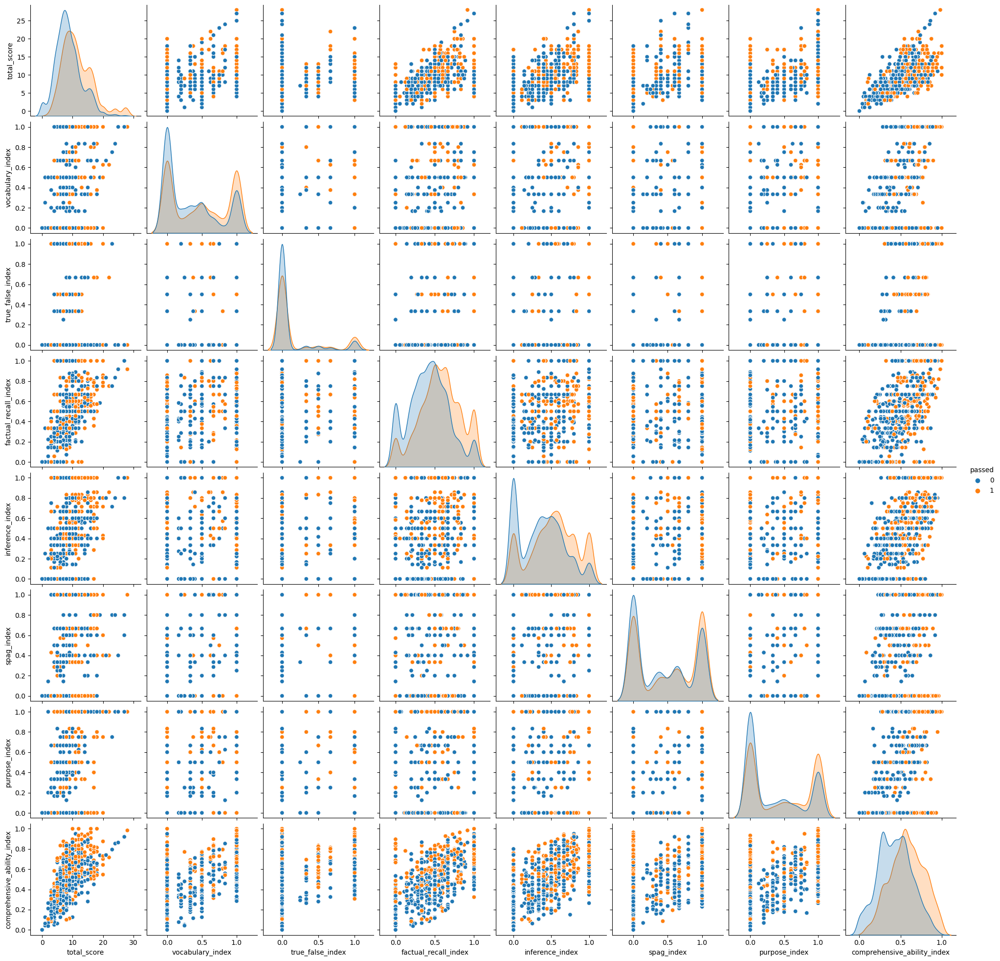

In [164]:
rel_cols = [
    'passed', 'total_score', 'vocabulary_index', 'true_false_index', 'factual_recall_index', 'inference_index', 'spag_index', 'purpose_index', 'comprehensive_ability_index',
]
sns.pairplot(
    df_train[rel_cols],
    diag_kind='kde',
    hue='passed'
)
plt.show()

Spread of Readability & Textstat Metrics

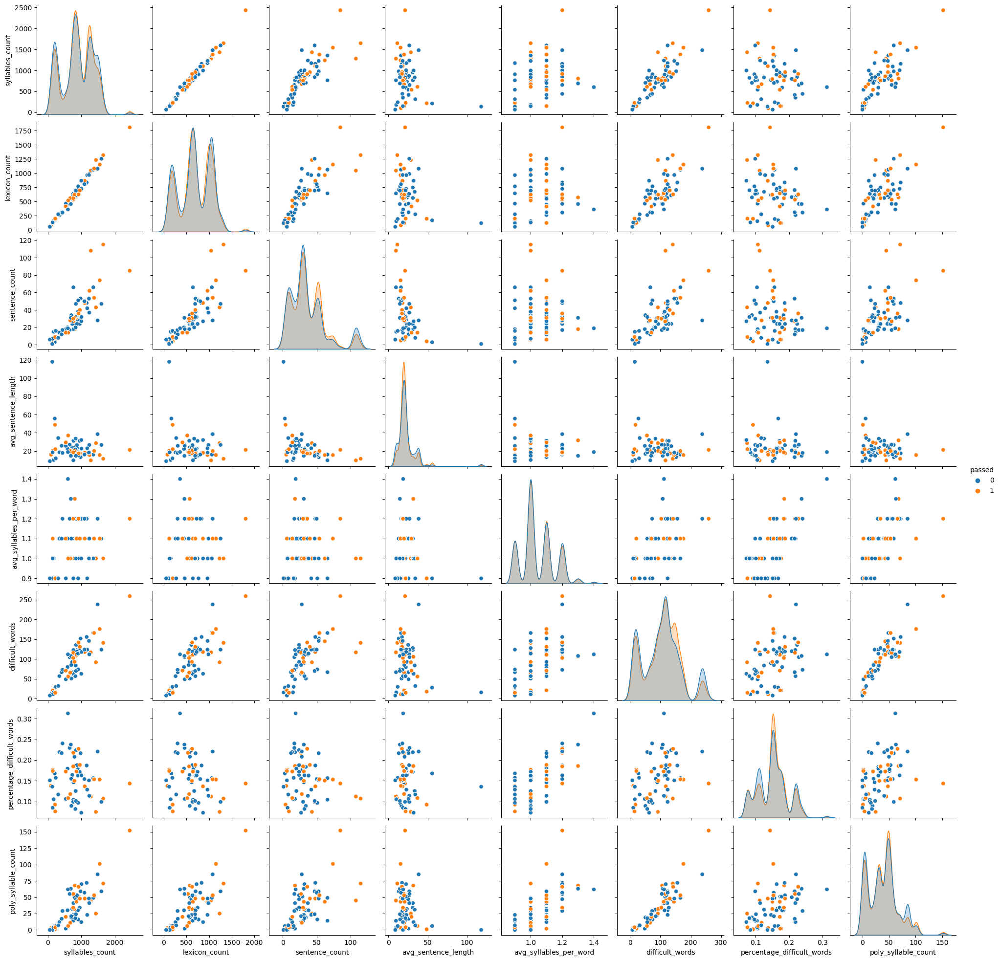

In [165]:
rel_cols = [ 
    'syllables_count', 'lexicon_count', 'sentence_count', 'avg_sentence_length', 'avg_syllables_per_word', 'difficult_words', 'percentage_difficult_words', 'poly_syllable_count', 'passed'
]
sns.pairplot(
    df_train[rel_cols],
    diag_kind='kde',
    hue='passed'
)
plt.show()

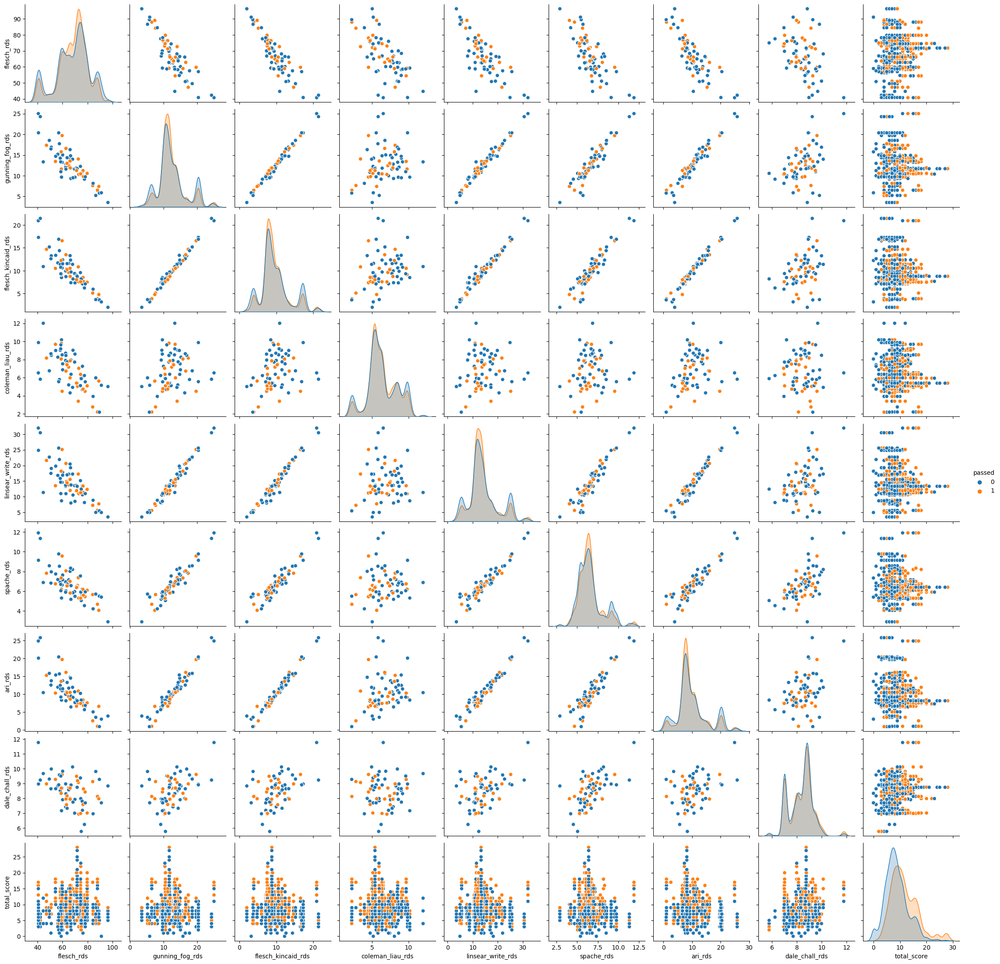

In [166]:
rel_cols = [
    'flesch_rds', 'gunning_fog_rds', 'flesch_kincaid_rds', 'coleman_liau_rds', 'linsear_write_rds', 'spache_rds', 'ari_rds', 'dale_chall_rds', 'total_score', 'passed'
]
sns.pairplot(
    df_train[rel_cols],
    diag_kind='kde',
    hue='passed'
)
plt.show()

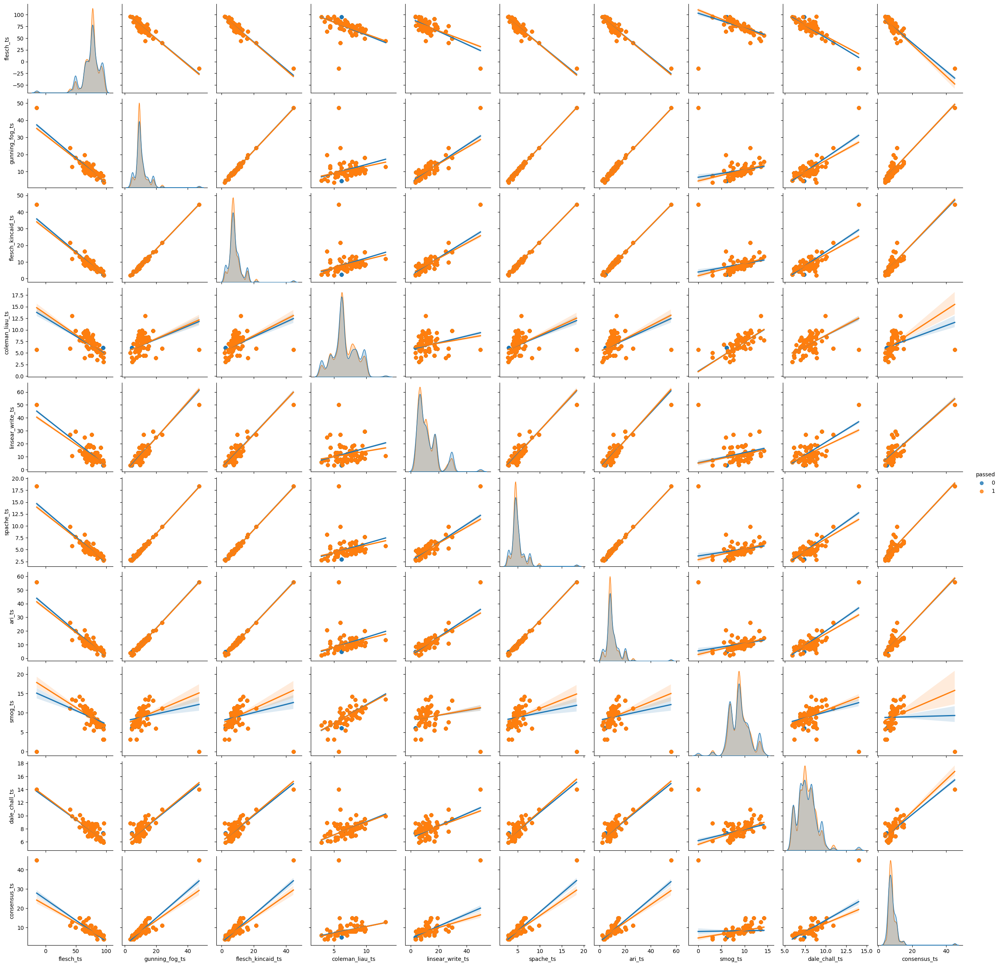

In [167]:
rel_cols = [
    'flesch_ts', 'gunning_fog_ts', 'flesch_kincaid_ts', 'coleman_liau_ts', 'linsear_write_ts', 'spache_ts', 
     'ari_ts', 'smog_ts', 'dale_chall_ts', 'consensus_ts', 'passed'
]
sns.pairplot(
    df_train[rel_cols],
    diag_kind='kde',
    kind='reg',
    hue='passed'
)
plt.show()

Relationship between Question Type and Total Score Grouped by Genre:

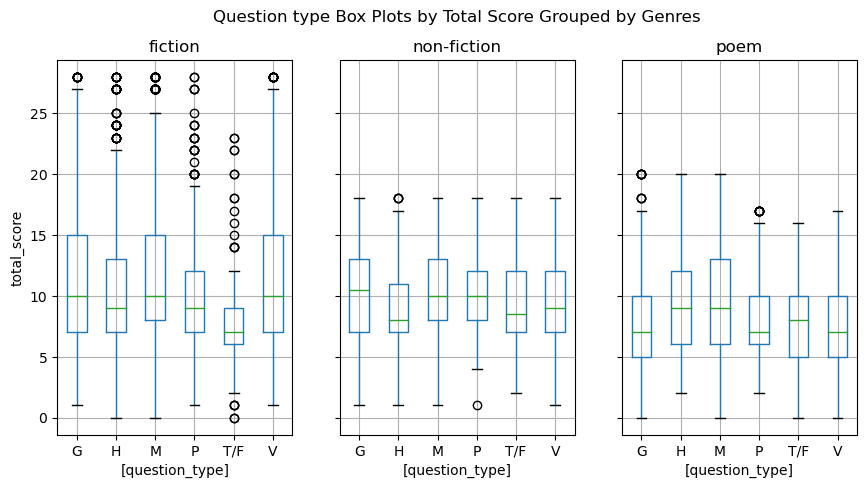

In [168]:
qtypes = ['G', 'H', 'M', 'P', 'V', 'T/F']

df_train.query(f'question_type.isin({qtypes})')[[
    'text_genres', 'total_score', 'question_type'
]].groupby('text_genres').boxplot(
    figsize=(10, 5),
    layout=(1, 3),
    by='question_type',
    ylabel='total_score'
)
plt.suptitle('Question type Box Plots by Total Score Grouped by Genres', y=1)
plt.show()

Relationship between Question Type and Difficulty Index Grouped by Genre:

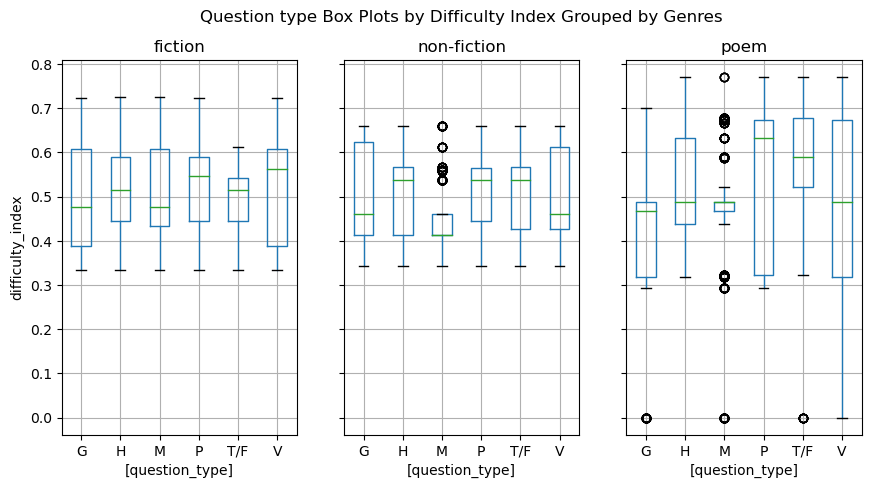

In [169]:
qtypes = ['G', 'H', 'M', 'P', 'V', 'T/F']

df_train.query(f'question_type.isin({qtypes})')[[
    'text_genres', 'difficulty_index', 'question_type'
]].groupby('text_genres').boxplot(
    figsize=(10, 5),
    layout=(1, 3),
    by='question_type',
    ylabel='difficulty_index'
)
plt.suptitle('Question type Box Plots by Difficulty Index Grouped by Genres', y=1)
plt.show()

Relationship between Question Type and Discrimination Index Grouped by Genre:

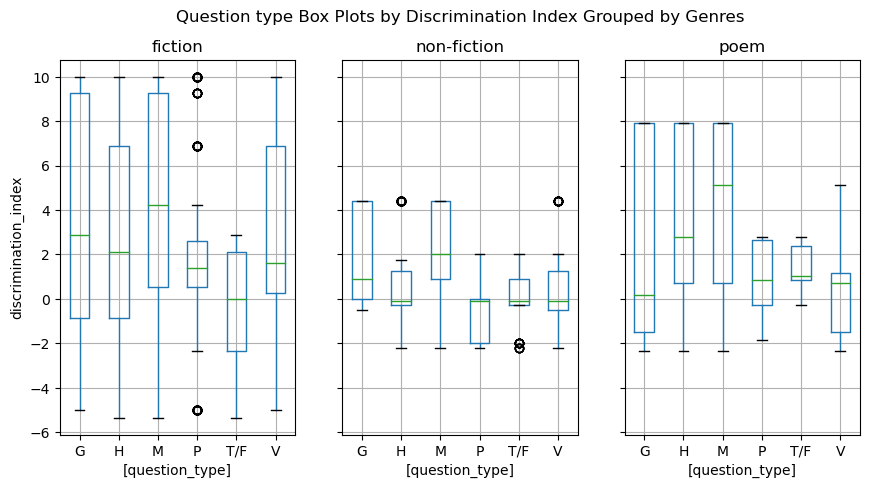

In [170]:
qtypes = ['G', 'H', 'M', 'P', 'V', 'T/F']

df_train.query(f'question_type.isin({qtypes})')[[
    'text_genres', 'discrimination_index', 'question_type'
]].groupby('text_genres').boxplot(
    figsize=(10, 5),
    layout=(1, 3),
    by='question_type',
    ylabel='discrimination_index'
)
plt.suptitle('Question type Box Plots by Discrimination Index Grouped by Genres', y=1)
plt.show()

Relationship between Question Type and Point Biserial Correlation Grouped by Genre:

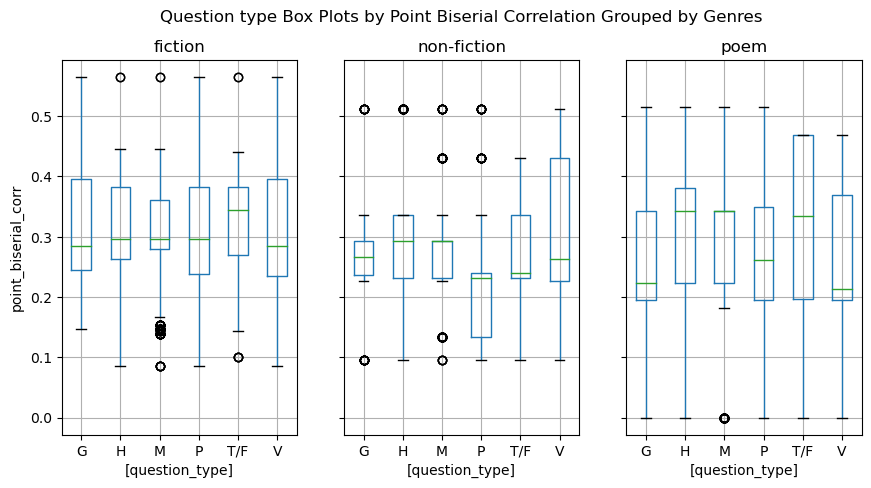

In [171]:
qtypes = ['G', 'H', 'M', 'P', 'V', 'T/F']

df_train.query(f'question_type.isin({qtypes})')[[
    'text_genres', 'point_biserial_corr', 'question_type'
]].groupby('text_genres').boxplot(
    figsize=(10, 5),
    layout=(1, 3),
    by='question_type',
    ylabel='point_biserial_corr'
)
plt.suptitle('Question type Box Plots by Point Biserial Correlation Grouped by Genres', y=1)
plt.show()

Compare Scores on Timed vs. Non-Timed Tests

In [172]:
print(df_train.loc[df_train.completion_time.dt.time > dt.time(0,0)].text_title.unique())

['dorian gray' 'notre-dame' 'the hobbit' 'those winter' 'sleepy hollow'
 'jane eyre' 'bluebird' 'metamorphosis' 'baskervilles']


Clean timed_completion feature:

In [173]:
df_train = df_train.assign(
    timed_completion=lambda x: np.where(
        x.completion_time.dt.time > dt.time(0, 0),
        True, False
    )
)

In [174]:
timed_tests = [
    'dorian gray', 'DORIAN', 'jane eyre', 'JANE EYRE','notre-dame', 'NOTRE DAME', 'those winter', 'THOSE WINTER', 'baskervilles', 
]

df_train.query(f'text_title.isin({timed_tests})').loc[df_train.completion_time.dt.time == dt.time(0,0)].text_title.unique()

array(['DORIAN', 'JANE EYRE', 'NOTRE DAME', 'baskervilles',
       'THOSE WINTER'], dtype=object)

In [175]:
rel_cols = [
    'student_id', 'text_title', 'completion_time', 'total_score', 'timed_completion'
]

df_time = df_train.query(f'text_title.isin({timed_tests})').loc[df_train.completion_time.dt.time >= dt.time(0,0)][rel_cols].drop_duplicates()

In [176]:
df_time.timed_completion.value_counts()

True     96
False    38
Name: timed_completion, dtype: int64

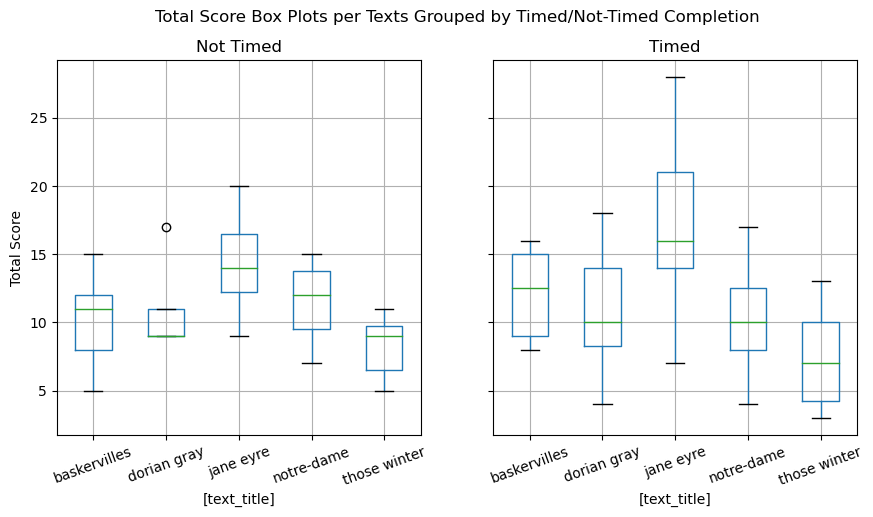

In [177]:
df_time.assign(
    timed_completion=lambda x: np.where(
        x.timed_completion==True, 'Timed', 'Not Timed'
    ),
    text_title=lambda x: x.text_title.str.replace(
        'DORIAN', 'dorian gray'
    ).str.replace(
        'JANE EYRE', 'jane eyre'
    ).str.replace(
        'NOTRE DAME', 'notre-dame'
    ).str.replace(
        'THOSE WINTER', 'those winter'
    )
).groupby('timed_completion').boxplot(
    figsize=(10, 5), layout=(1, 2), by='text_title', rot=20, xlabel='', ylabel='Total Score'
)
plt.suptitle('Total Score Box Plots per Texts Grouped by Timed/Not-Timed Completion', y=1)
plt.show()

Correlations:

In [178]:
df_train.columns

Index(['student_id', 'text_title', 'text_genres', 'date_of_birth',
       'completion_time', 'age_at_completion', 'question', 'question_type',
       'question_type_meaning', 'answer', 'student_response', 'passed',
       'total_score', 'timed_completion', 'vocabulary_index',
       'true_false_index', 'factual_recall_index', 'inference_index',
       'spag_index', 'purpose_index', 'comprehensive_ability_index',
       'genre_score', 'text', 'publication_date', 'break_sentences',
       'syllables_count', 'lexicon_count', 'sentence_count',
       'avg_sentence_length', 'avg_syllables_per_word', 'difficult_words',
       'percentage_difficult_words', 'poly_syllable_count', 'flesch_rds',
       'flesch_label_rds', 'flesch_ts', 'flesch_label_ts', 'gunning_fog_rds',
       'gunning_fog_label_rds', 'gunning_fog_ts', 'gunning_fog_label_ts',
       'flesch_kincaid_rds', 'flesch_kincaid_label_rds', 'flesch_kincaid_ts',
       'flesch_kincaid_label_ts', 'coleman_liau_rds', 'coleman_liau_label_r

In [179]:
cat_cols = [
    'student_id', 'text_title', 'text_genres', 'question', 'question_type', 'question_type_meaning', 'answer', 'student_response', 'text', 'break_sentences', 'flesch_label_rds', 'flesch_label_ts', 'gunning_fog_label_rds', 'gunning_fog_label_ts', 'flesch_kincaid_label_rds', 'flesch_kincaid_label_ts', 'coleman_liau_label_rds', 'coleman_liau_label_ts', 'linsear_write_label_rds', 'linsear_write_label_ts', 'spache_label_rds', 'spache_label_ts', 'ari_label_ts', 'smog_label_ts', 'dale_chall_label_ts', 'consensus_label_ts', 'ari_label_rds',
    'dale_chall_label_rds',
]

df[cat_cols].head()

,student_id,text_title,text_genres,question,question_type,question_type_meaning,answer,student_response,text,break_sentences,...,linsear_write_label_rds,linsear_write_label_ts,spache_label_rds,spache_label_ts,ari_label_ts,smog_label_ts,dale_chall_label_ts,consensus_label_ts,ari_label_rds,dale_chall_label_rds
0,1,dorian gray,fiction,1,M,Factual recall: there is a sentence that basic...,A,A,The Picture of Dorian Gray\n\nby Oscar Wilde\n...,"[(The, Picture, of, Dorian, Gray, , by, Oscar...",...,0 6.0\n1 6.0\n2 6.0\n3...,6th grade,0 5.0\n1 5.0\n2 5.0\n3 ...,4th grade,4th grade,7th grade,avg 5th or 6th-grade student,5th and 6th grade,"'1', '2'","'11', '12'"
1,1,dorian gray,fiction,2,M,Factual recall: there is a sentence that basic...,E,D,The Picture of Dorian Gray\n\nby Oscar Wilde\n...,"[(The, Picture, of, Dorian, Gray, , by, Oscar...",...,0 6.0\n1 6.0\n2 6.0\n3...,6th grade,0 5.0\n1 5.0\n2 5.0\n3 ...,4th grade,4th grade,7th grade,avg 5th or 6th-grade student,5th and 6th grade,"'1', '2'","'11', '12'"
2,1,dorian gray,fiction,3,P,Purpose: understanding why the author writes s...,E,D,The Picture of Dorian Gray\n\nby Oscar Wilde\n...,"[(The, Picture, of, Dorian, Gray, , by, Oscar...",...,0 6.0\n1 6.0\n2 6.0\n3...,6th grade,0 5.0\n1 5.0\n2 5.0\n3 ...,4th grade,4th grade,7th grade,avg 5th or 6th-grade student,5th and 6th grade,"'1', '2'","'11', '12'"
3,1,dorian gray,fiction,4,H,Inference: they will have to infer information...,D,A,The Picture of Dorian Gray\n\nby Oscar Wilde\n...,"[(The, Picture, of, Dorian, Gray, , by, Oscar...",...,0 6.0\n1 6.0\n2 6.0\n3...,6th grade,0 5.0\n1 5.0\n2 5.0\n3 ...,4th grade,4th grade,7th grade,avg 5th or 6th-grade student,5th and 6th grade,"'1', '2'","'11', '12'"
4,1,dorian gray,fiction,5,M,Factual recall: there is a sentence that basic...,C,C,The Picture of Dorian Gray\n\nby Oscar Wilde\n...,"[(The, Picture, of, Dorian, Gray, , by, Oscar...",...,0 6.0\n1 6.0\n2 6.0\n3...,6th grade,0 5.0\n1 5.0\n2 5.0\n3 ...,4th grade,4th grade,7th grade,avg 5th or 6th-grade student,5th and 6th grade,"'1', '2'","'11', '12'"


In [180]:
numeric_cols = [
    'student_id', 'text_title', 'date_of_birth', 'completion_time', 'age_at_completion', 'passed', 'total_score', 'timed_completion', 'vocabulary_index', 'true_false_index', 'factual_recall_index', 'inference_index', 'spag_index', 'purpose_index', 'comprehensive_ability_index', 'genre_score', 'publication_date', 'syllables_count', 'lexicon_count', 'sentence_count', 'avg_sentence_length', 'avg_syllables_per_word', 'difficult_words', 'poly_syllable_count', 'flesch_rds', 'flesch_ts', 'gunning_fog_rds', 'gunning_fog_ts', 'flesch_kincaid_rds', 'flesch_kincaid_ts', 'coleman_liau_rds', 'coleman_liau_ts', 'linsear_write_rds', 'linsear_write_ts', 'spache_rds', 'spache_ts', 'ari_rds', 'ari_ts', 'smog_ts', 'dale_chall_rds', 'dale_chall_ts', 'consensus_ts', 'difficulty_index', 'discrimination_index', 'point_biserial_corr', 'progress_rate', 'log_progress_rate'
]
df_corr = df_train[numeric_cols].drop_duplicates()

_Numeric Features Correlation:_

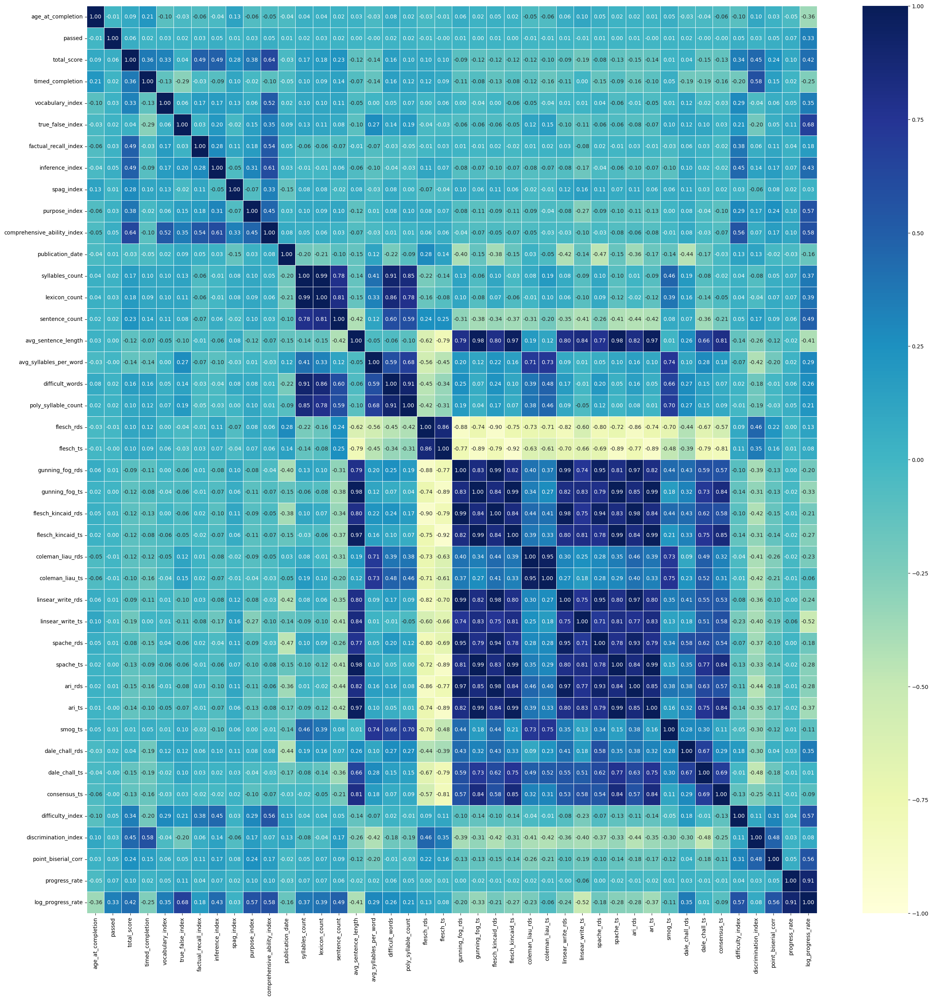

In [181]:
plt.figure(figsize=(30, 30))
sns.heatmap(
    df_corr.assign(
        publication_date=lambda x: pd.to_numeric(x.publication_date),
        age_at_completion=lambda x: pd.to_numeric(x.age_at_completion),
        timed_completion=lambda x: pd.to_numeric(x.timed_completion),
    ).corr(numeric_only=True),
            annot=True,
            linewidths=0.5,
            center=0, 
            vmin=-1, 
            vmax=1,
            fmt= ".2f",
            cmap="YlGnBu");

Correlation of other Features with the `Passed` variable

In [182]:
df_train.assign(
    publication_date=lambda x: pd.to_numeric(x.publication_date)
).corr(numeric_only=True).passed.sort_values(ascending=True).iloc[:-1]

question                      -0.069838
linsear_write_ts              -0.055447
avg_sentence_length           -0.035246
ari_ts                        -0.034313
gunning_fog_ts                -0.031682
consensus_ts                  -0.031216
spache_ts                     -0.030106
flesch_kincaid_ts             -0.029714
timed_completion              -0.026026
ari_rds                       -0.025670
age_year                      -0.021427
flesch_kincaid_rds            -0.021226
spache_rds                    -0.020925
gunning_fog_rds               -0.019850
linsear_write_rds             -0.018471
avg_syllables_per_word        -0.009280
dale_chall_ts                 -0.006927
smog_ts                       -0.005263
coleman_liau_rds              -0.004095
coleman_liau_ts                0.001123
poly_syllable_count            0.002723
percentage_difficult_words     0.010606
difficult_words                0.010914
sentence_count                 0.011294
flesch_rds                     0.013758


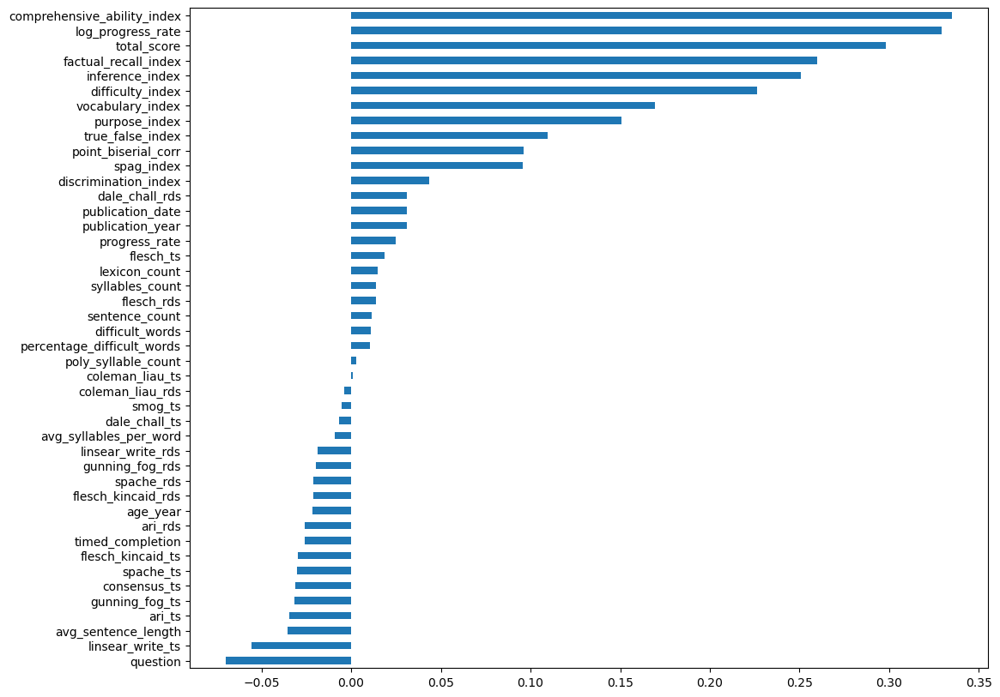

In [183]:
df_train.assign(
    publication_date=lambda x: pd.to_numeric(x.publication_date),
).corr(numeric_only=True).passed.sort_values(ascending=True).iloc[:-1].plot(
    kind='barh', figsize=(12, 10)
)
plt.show()

_Full Correlation:_

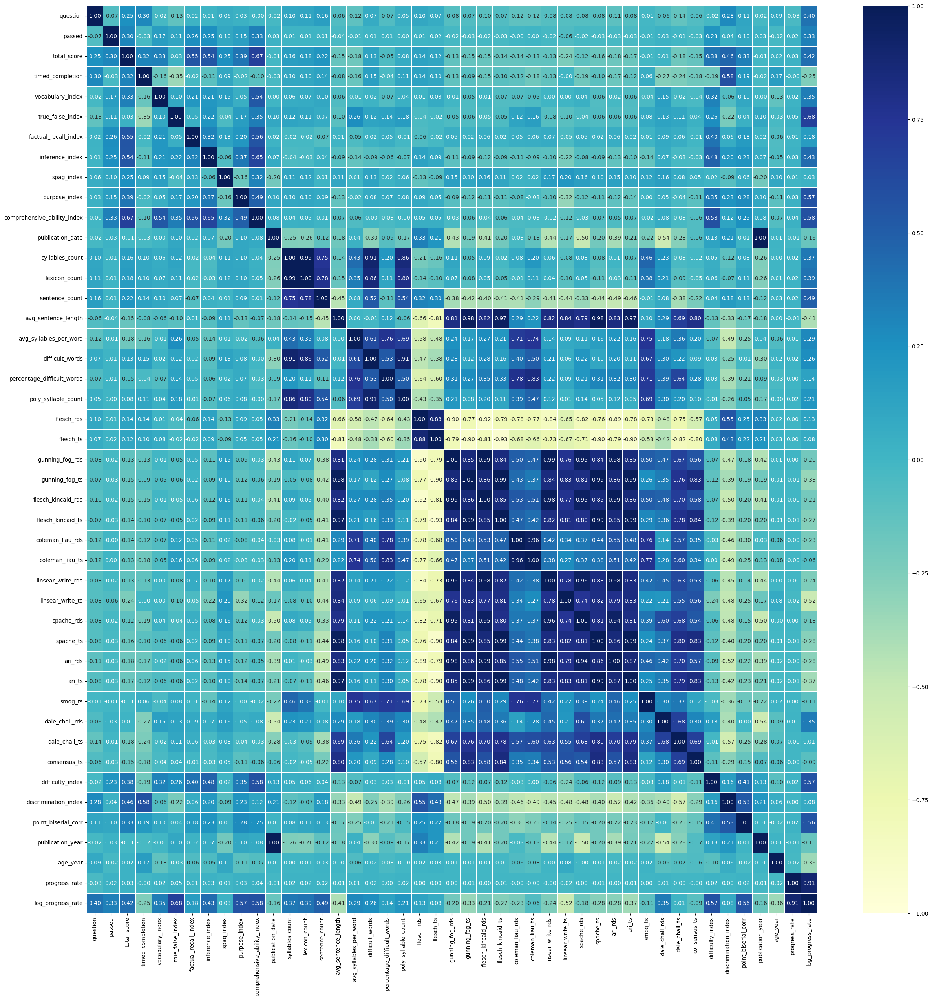

In [184]:
plt.figure(figsize=(30, 30))
sns.heatmap(
    df_train.assign(
        publication_date=lambda x: pd.to_numeric(x.publication_date),
        timed_completion=lambda x: pd.to_numeric(x.timed_completion)
    ).corr(numeric_only=True),
            annot=True,
            linewidths=0.5,
            center=0,
            vmin=-1,
            vmax=1,
            fmt= ".2f",
            cmap="YlGnBu");

Correlations may benefit from attribute interactions and combinations.

In [185]:
df_train.consensus_label_ts.unique()

array(['5th and 6th grade', '10th and 11th grade', '7th and 8th grade',
       '8th and 9th grade', '11th and 12th grade', '9th and 10th grade',
       '14th and 15th grade', '3rd and 4th grade', '6th and 7th grade',
       '13th and 14th grade', '4th and 5th grade', '44th and 45th grade',
       '12th and 13th grade'], dtype=object)

In [186]:
df_train.query('consensus_label_ts=="44th and 45th grade"')[['text_title', 'consensus_ts', 'consensus_label_ts']]

,text_title,consensus_ts,consensus_label_ts
506,when u r old,45.0,44th and 45th grade
507,when u r old,45.0,44th and 45th grade
508,when u r old,45.0,44th and 45th grade
510,when u r old,45.0,44th and 45th grade
511,when u r old,45.0,44th and 45th grade
...,...,...,...
9574,when u r old,45.0,44th and 45th grade
9575,when u r old,45.0,44th and 45th grade
9576,when u r old,45.0,44th and 45th grade
9577,when u r old,45.0,44th and 45th grade


### Machine Learning

In [187]:
df = df.assign(
    publication_date=lambda x: np.where(
        x.publication_date < str(pd.Timestamp.min), pd.Timestamp.min,
        x.publication_date
    ),
    student_id=lambda x: x.student_id.astype(str),
)

df = df.drop(index=df.query('student_id=="24_1"').index)
df.age_at_completion = df.age_at_completion.apply(lambda x: pd.Timedelta(x))

In [188]:
df.head()

,student_id,text_title,text_genres,date_of_birth,completion_time,age_at_completion,question,question_type,question_type_meaning,answer,...,dale_chall_rds,dale_chall_ts,dale_chall_label_ts,consensus_ts,consensus_label_ts,ari_label_rds,dale_chall_label_rds,difficulty_index,discrimination_index,point_biserial_corr
0,1,dorian gray,fiction,2012-09-03,2020-07-22 14:32:20.554,2879 days 14:32:20.554000,1,M,Factual recall: there is a sentence that basic...,A,...,8.132917,5.9,avg 5th or 6th-grade student,6.0,5th and 6th grade,"'1', '2'","'11', '12'",0.387987,6.9,0.28411
1,1,dorian gray,fiction,2012-09-03,2020-07-22 14:32:20.554,2879 days 14:32:20.554000,2,M,Factual recall: there is a sentence that basic...,E,...,8.132917,5.9,avg 5th or 6th-grade student,6.0,5th and 6th grade,"'1', '2'","'11', '12'",0.387987,6.9,0.28411
2,1,dorian gray,fiction,2012-09-03,2020-07-22 14:32:20.554,2879 days 14:32:20.554000,3,P,Purpose: understanding why the author writes s...,E,...,8.132917,5.9,avg 5th or 6th-grade student,6.0,5th and 6th grade,"'1', '2'","'11', '12'",0.387987,6.9,0.28411
3,1,dorian gray,fiction,2012-09-03,2020-07-22 14:32:20.554,2879 days 14:32:20.554000,4,H,Inference: they will have to infer information...,D,...,8.132917,5.9,avg 5th or 6th-grade student,6.0,5th and 6th grade,"'1', '2'","'11', '12'",0.387987,6.9,0.28411
4,1,dorian gray,fiction,2012-09-03,2020-07-22 14:32:20.554,2879 days 14:32:20.554000,5,M,Factual recall: there is a sentence that basic...,C,...,8.132917,5.9,avg 5th or 6th-grade student,6.0,5th and 6th grade,"'1', '2'","'11', '12'",0.387987,6.9,0.28411


In [189]:
years_per_day = 1 / (365.25 * 24 * 3600)

df = df.assign(
    date_of_birth=lambda x: pd.to_datetime(x.date_of_birth),
    completion_time=lambda x: pd.to_datetime(x.completion_time),
    publication_date=lambda x: pd.to_datetime(x.publication_date),
    publication_year = lambda x: x.publication_date.dt.year,
    # student_id=lambda x: x.student_id.str.replace('24_0', '24'),
    age_years=lambda x: x.age_at_completion.dt.total_seconds() * years_per_day,
    age_groups=lambda x: pd.cut(
        x=x.age_years, 
        bins=[0, 8, 9, 10, 11, 12], 
        labels=['Under 8 years', '8-9 years', '9-10 years', '10-11 years', '11-12 years']
    ),
    timed_completion=lambda x: np.where(
        x.completion_time.dt.time > dt.time(0, 0),
        True, False
    ),
    text_title=lambda x: x.text_title.str.replace(
        'DORIAN', 'dorian gray'
    ).str.replace(
        'JANE EYRE', 'jane eyre'
    ).str.replace(
        'NOTRE DAME', 'notre-dame'
    ).str.replace(
        'THOSE WINTER', 'those winter'
    ),
    
)
                                                  

Rate of Improvement:

In [190]:
rel_cols = [
    'student_id', 'text_title', 'completion_time', 'age_years', 'total_score'
]
mult_entr = df.query(f'student_id.str.contains("_")').student_id.unique().tolist()

students = list(set([a.split('_')[0] for a in mult_entr]))

mult_texts = df.query(f'student_id.isin({mult_entr})').text_title.unique().tolist()

id_text_age_score = list()

for student in students:
    for ind, row in df.query(f'student_id.str.contains("^{student}_", regex=True) &  text_title.isin({mult_texts})')[rel_cols].drop_duplicates().iterrows():
        id_text_age_score.append([ind, student, row['text_title'], row['completion_time'], row['age_years'], row['total_score']])
    
progress_df = pd.DataFrame(id_text_age_score, columns=[
    'index', 'student_id', 'text_title', 'completion_time', 'age_years', 'total_score'
]).set_index('index').sort_values(by=[
    'student_id', 'text_title', 'completion_time'
]).assign(
    progress_rate_val=lambda x:x.groupby(['student_id', 'text_title'])['total_score'].diff(),
    progress_rate_delta=lambda x:x.groupby(['student_id', 'text_title'])['completion_time'].diff(),
    progress_rate_wk=lambda x: np.where(
        pd.to_numeric(x.progress_rate_delta) / (7 * 24 * 60 * 60 * 1e9) > 0,
        round(pd.to_numeric(x.progress_rate_delta) / (7 * 24 * 60 * 60 * 1e9), 3),
        np.nan
    ),
    progress_rate=lambda x:np.where(
        x.progress_rate_wk > .1,
        round(x.progress_rate_val / x.progress_rate_wk, 3),
        np.nan
    )
)

df['progress_rate'] = 0

for ind, row in df.iterrows():
    for ind2, row2 in progress_df.iterrows():
        if ind==ind2:
            df.at[ind, 'progress_rate'] = progress_df.at[ind2, 'progress_rate']

In [191]:
progress_df.groupby(by=['student_id', 'text_title']).agg("mean", numeric_only=True)

age_years  total_score  progress_rate_val  \
student_id text_title                                                     
1          bluebird            9.745638    14.666667           6.500000   
           jane eyre           7.895101    21.000000           6.500000   
           metamorphosis       9.748204    13.666667           3.000000   
           sleepy hollow       9.741779     7.666667           2.000000   
15         frost               9.563313     6.000000           2.000000   
           jane eyre           8.979665    20.500000          13.000000   
17         jekyll             10.683094    10.500000          11.000000   
2          baskervilles       10.186174     8.000000           0.000000   
20         jekyll              9.909195     9.000000           3.500000   
21         fauntleroy          9.174538     9.000000           2.000000   
23         baskervilles        9.342916     8.000000           6.000000   
           jekyll              9.815195    11.333333           3.500000   
           war of the worlds   9.514031    11.000000           2.000000   
24         homing pigeon       9.374401     4.000000                NaN   
27         jekyll             10.596851     8.500000          -1.000000   
33         jane eyre          10.376746    19.750000           3.333333   
4          fauntleroy          8.917180     6.000000           4.000000   
43         jekyll             10.262834    11.500000           5.000000   
46         baskervilles        7.548730    12.000000           6.000000   
55         jane eyre          10.616333    15.000000           2.000000   
56         jane eyre          10.961418     8.500000           1.000000   
8          baskervilles        9.507187    11.000000           6.000000   
80         jane eyre           8.559643    14.000000          10.000000   
81         jane eyre           8.562431    22.000000          10.000000   
82         jane eyre           8.566660    17.000000           2.000000   

                              progress_rate_wk  progress_rate  
student_id text_title                                          
1          bluebird                  52.185000         0.1250  
           jane eyre                  0.011000            NaN  
           metamorphosis             51.856500         0.0575  
           sleepy hollow             52.092500         0.0380  
15         frost                     43.714000         0.0460  
           jane eyre                  0.001000            NaN  
17         jekyll                     1.143000         9.6240  
2          baskervilles              24.714000         0.0000  
20         jekyll                    19.428500         3.0970  
21         fauntleroy                39.714000         0.0500  
23         baskervilles              24.143000         0.2490  
           jekyll                    19.428500         2.0395  
           war of the worlds          0.286000         6.9930  
24         homing pigeon                   NaN            NaN  
27         jekyll                     1.000000        -1.0000  
33         jane eyre                  0.034333            NaN  
4          fauntleroy                41.143000         0.0970  
43         jekyll                     1.000000         5.0000  
46         baskervilles               0.708000         8.4750  
55         jane eyre                  0.001000            NaN  
56         jane eyre                  0.027000            NaN  
8          baskervilles              25.000000         0.2400  
80         jane eyre                  0.002500            NaN  
81         jane eyre                  0.001000            NaN  
82         jane eyre                  0.151000        13.2450

In [192]:
df.progress_rate = df.progress_rate.fillna(0)

In [193]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 12272 entries, 0 to 12286
Data columns (total 76 columns):
 #   Column                       Non-Null Count  Dtype          
---  ------                       --------------  -----          
 0   student_id                   12272 non-null  object         
 1   text_title                   12272 non-null  object         
 2   text_genres                  12272 non-null  category       
 3   date_of_birth                12272 non-null  datetime64[ns] 
 4   completion_time              12272 non-null  datetime64[ns] 
 5   age_at_completion            12272 non-null  timedelta64[ns]
 6   question                     12272 non-null  int64          
 7   question_type                12272 non-null  object         
 8   question_type_meaning        12270 non-null  object         
 9   answer                       12272 non-null  object         
 10  student_response             11762 non-null  object         
 11  passed                      

Descriptive Statistics:

In [196]:
df_train.describe()

,age_at_completion,question,passed,total_score,vocabulary_index,true_false_index,factual_recall_index,inference_index,spag_index,purpose_index,...,smog_ts,dale_chall_rds,dale_chall_ts,consensus_ts,difficulty_index,discrimination_index,point_biserial_corr,publication_year,age_years,progress_rate
count,10328,10328.000000,10328.000000,10328.000000,10328.000000,10328.000000,10328.000000,10328.000000,10328.000000,10328.000000,...,10328.000000,10328.000000,10328.000000,10328.000000,10328.000000,10328.000000,10328.000000,10328.000000,10328.000000,10328.000000
mean,3600 days 18:27:30.374184384,10.900562,0.493029,10.082688,0.409516,0.147302,0.494923,0.448074,0.481058,0.409913,...,8.856836,8.343035,7.696605,8.231119,0.499561,2.856510,0.298673,1910.387490,9.858369,0.001983
std,264 days 14:29:24.523800372,6.532878,0.499976,4.876428,0.401221,0.322892,0.265956,0.308742,0.422695,0.434105,...,2.194671,0.936395,1.185351,3.653896,0.117491,4.411331,0.095294,72.561573,0.724446,0.147379
min,2728 days 23:35:02.124000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,5.772204,5.900000,4.000000,0.000000,-5.333333,0.000000,1677.000000,7.471547,0.000000
25%,3462 days 00:00:00,5.000000,0.000000,7.000000,0.000000,0.000000,0.333333,0.222222,0.000000,0.000000,...,7.200000,7.703234,6.890000,7.000000,0.426667,-0.090909,0.232044,1847.000000,9.478439,0.000000
50%,3649 days 04:38:38.500000,10.000000,0.000000,9.000000,0.333333,0.000000,0.500000,0.500000,0.500000,0.250000,...,8.700000,8.642133,7.560000,8.000000,0.488750,1.750000,0.295649,1902.000000,9.990947,0.000000
75%,3798 days 09:14:00.106000,15.000000,1.000000,13.000000,0.833333,0.000000,0.666667,0.666667,1.000000,1.000000,...,10.100000,8.917942,8.290000,9.000000,0.592593,6.900000,0.359499,1992.000000,10.399411,0.000000
max,4073 days 17:26:47.482000,30.000000,1.000000,28.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,14.200000,11.771421,14.040000,45.000000,0.771429,10.000000,0.565685,2022.000000,11.153257,13.245000


In [197]:
df_train.describe(include=['O'])

,student_id,text_title,question_type,question_type_meaning,answer,student_response,text,break_sentences,flesch_label_rds,gunning_fog_label_rds,flesch_kincaid_label_rds,coleman_liau_label_rds,linsear_write_label_rds,spache_label_rds,consensus_label_ts,ari_label_rds,dale_chall_label_rds
count,10328,10328,10328,10328,10328,9899,10328,10328,10328,10328,10328,10328,10328,10328,10328,10328,10328
unique,128,65,15,15,7,7,69,176,6,10,1,1,1,1,13,13,6
top,12,jane eyre,M,Factual recall: there is a sentence that basic...,C,A,"The Metamorphosis \nOne morning, when Gregor S...","[(The, Metamorphosis, , One, morning, ,, when...",fairly_easy,college,0 4.0\n1 4.0\n2 4.0\n3...,0 2.0\n1 2.0\n2 2.0\n3 ...,0 6.0\n1 6.0\n2 6.0\n3...,0 5.0\n1 5.0\n2 5.0\n3 ...,6th and 7th grade,'8',"'11', '12'"
freq,503,997,4142,4142,2784,2476,920,920,4388,2169,10328,10328,10328,10328,2777,2164,5136


The features wtih significant correlation with `passed` are:

In [198]:
passed_corr = [
    'total_score', 'vocabulary_index', 'true_false_index', 
    'factual_recall_index', 'inference_index', 'purpose_index',
    'comprehensive_ability_index', 'difficulty_index', 
    'point_biserial_corr'
    ]

Correlations may benefit from attribute interactions and combinations.

### Feature Interactions & Attribute Combinations

Progress Rate:

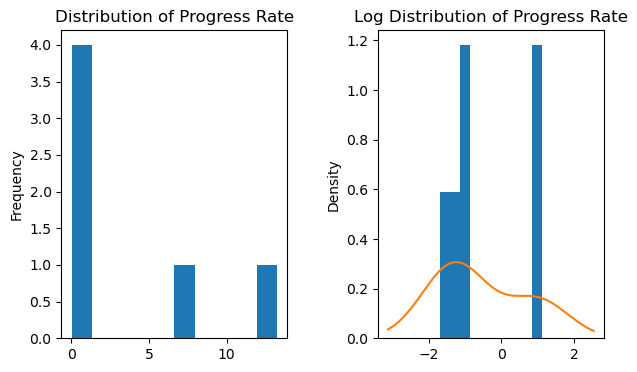

In [199]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(7, 4))
fig.subplots_adjust(wspace=0.4)

df_train.query('progress_rate > 0').progress_rate.plot(
    kind='hist',
    title='Distribution of Progress Rate',
    ax=ax1
)

df_train.query('progress_rate > 0').assign(
    progress_rate=lambda x: np.log10(x.progress_rate)
).progress_rate.plot(
    kind='hist',
    density=True,
    title='Log Distribution of Progress Rate',
    ax=ax2
)
df_train.query('progress_rate > 0').assign(
    progress_rate=lambda x: np.log10(x.progress_rate)
).progress_rate.plot(
    kind='kde',
    title='Log Distribution of Progress Rate',
    ax=ax2
)

plt.show()

In [200]:
df_train['log_progress_rate'] = np.log10(df_train.progress_rate)

/opt/homebrew/Caskroom/miniforge/base/envs/mlp/lib/python3.10/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


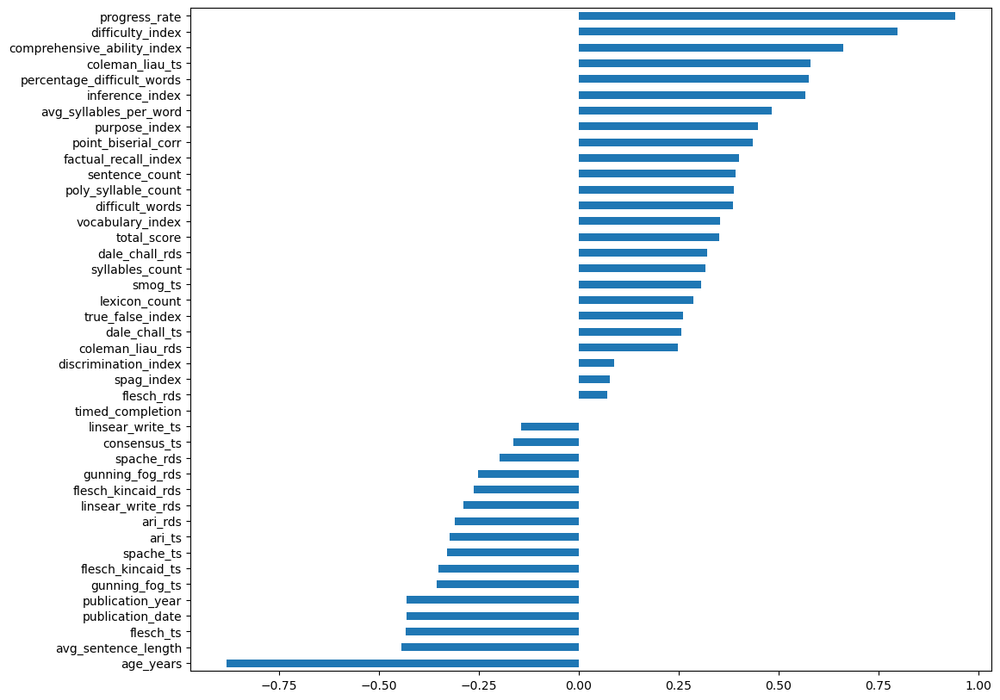

In [201]:
df_train.assign(
    publication_date=lambda x: pd.to_numeric(x.publication_date),
).corr(numeric_only=True).log_progress_rate.sort_values(ascending=True).iloc[:-3].plot(
    kind='barh', figsize=(12, 10)
)
plt.show()

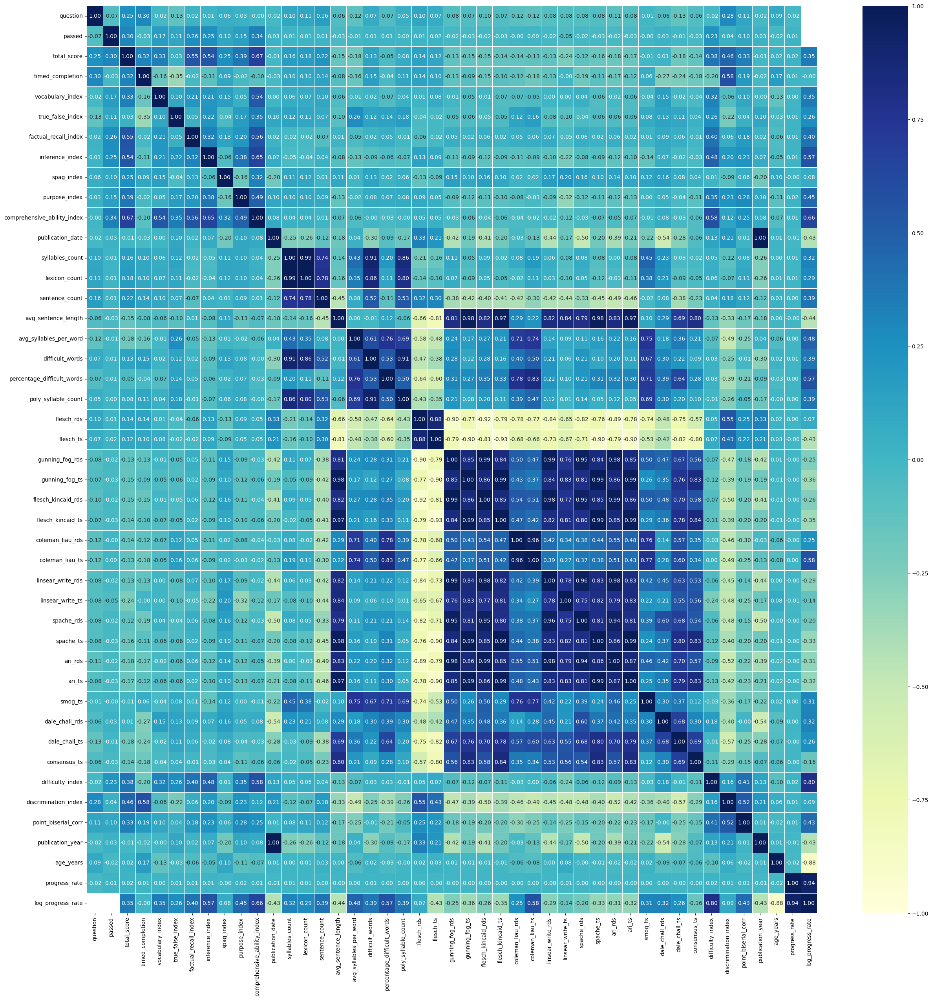

In [202]:
plt.figure(figsize=(30, 30))
sns.heatmap(
    df_train.assign(
        publication_date=lambda x: pd.to_numeric(x.publication_date),
        timed_completion=lambda x: pd.to_numeric(x.timed_completion)
    ).corr(numeric_only=True),
    annot=True,
    linewidths=0.5,
    center=0,
    vmin=-1,
    vmax=1,
    fmt= ".2f",
    cmap="YlGnBu");

### Prepare the Data for Machine Learning Algorithms

1. **Predicting Student Responses (Part 1)**
The first part of the project will be to use student profiles and your understanding of each passage to predict whether a student will get an answer right or wrong.

2. **Predicting Student Responses (Part 2)**
The second stage of the project will be to predict the exact multiple-choice option that a student will choose in a test. This is much harder as it would require additional analysis of each multiple-choice option. You may consider analysing or producing a model that is able to recognise the tendencies of students' choices or the style of the multiple-choice option.

### Handling Text & Categorical Attributes

The important categorical columns for machine learning are: text_genres, question_type, and the `_label` columns. We'll use OneHotEncoder to encode them:

In [203]:
cat_cols = [
    'text_genres', 'question_type', 'flesch_label_rds', 
    'flesch_label_ts', 'gunning_fog_label_rds', 'gunning_fog_label_ts', 
    'flesch_kincaid_label_rds', 'flesch_kincaid_label_ts', 
    'coleman_liau_label_rds', 'coleman_liau_label_ts', 
    'linsear_write_label_rds', 'linsear_write_label_ts', 
    'spache_label_rds', 'spache_label_ts', 'ari_label_ts', 
    'smog_label_ts', 'dale_chall_label_ts', 'consensus_label_ts', 
    'ari_label_rds', 'dale_chall_label_rds'
]

Let's convert the date features to numeric:

In [204]:
df_train = df_train.assign(
    date_of_birth=lambda x:pd.to_numeric(x.date_of_birth),
    completion_time=lambda x:pd.to_numeric(x.completion_time),
    publication_date=lambda x:pd.to_numeric(x.publication_date),
    log_progress_rate=lambda x: np.where(
        np.isinf(x.log_progress_rate), 
        np.nan, x.log_progress_rate
    ),  
)

df_train.age_at_completion = pd.to_numeric(df_train.age_at_completion)

df_train.head()

,student_id,text_title,text_genres,date_of_birth,completion_time,age_at_completion,question,question_type,question_type_meaning,answer,...,ari_label_rds,dale_chall_label_rds,difficulty_index,discrimination_index,point_biserial_corr,publication_year,age_years,age_groups,progress_rate,log_progress_rate
0,1,dorian gray,fiction,1346630400000000000,1595428340554000000,248797940554000000,1,M,Factual recall: there is a sentence that basic...,A,...,"'1', '2'","'11', '12'",0.387987,6.9,0.28411,1891,7.883931,Under 8 years,0.0,NaN
1,1,dorian gray,fiction,1346630400000000000,1595428340554000000,248797940554000000,2,M,Factual recall: there is a sentence that basic...,E,...,"'1', '2'","'11', '12'",0.387987,6.9,0.28411,1891,7.883931,Under 8 years,0.0,NaN
2,1,dorian gray,fiction,1346630400000000000,1595428340554000000,248797940554000000,3,P,Purpose: understanding why the author writes s...,E,...,"'1', '2'","'11', '12'",0.387987,6.9,0.28411,1891,7.883931,Under 8 years,0.0,NaN
3,1,dorian gray,fiction,1346630400000000000,1595428340554000000,248797940554000000,4,H,Inference: they will have to infer information...,D,...,"'1', '2'","'11', '12'",0.387987,6.9,0.28411,1891,7.883931,Under 8 years,0.0,NaN
4,1,dorian gray,fiction,1346630400000000000,1595428340554000000,248797940554000000,5,M,Factual recall: there is a sentence that basic...,C,...,"'1', '2'","'11', '12'",0.387987,6.9,0.28411,1891,7.883931,Under 8 years,0.0,NaN


In [205]:
num_cols = [
    'date_of_birth', 'completion_time', 'age_at_completion', 
    'vocabulary_index', 'true_false_index', 'factual_recall_index', 
    'inference_index', 'spag_index', 'purpose_index', 
    'comprehensive_ability_index', 'syllables_count', 
    'lexicon_count', 'sentence_count', 'avg_sentence_length', 
    'avg_syllables_per_word', 'difficult_words', 
    'percentage_difficult_words','poly_syllable_count', 
    'flesch_rds', 'flesch_ts', 'gunning_fog_rds', 'gunning_fog_ts', 
    'flesch_kincaid_rds', 'flesch_kincaid_ts', 'coleman_liau_rds', 
    'coleman_liau_ts', 'linsear_write_rds', 'linsear_write_ts', 
    'spache_rds', 'spache_ts', 'ari_rds', 'ari_ts', 'smog_ts', 
    'dale_chall_rds', 'dale_chall_ts', 'consensus_ts', 
    'difficulty_index', 'discrimination_index', 'point_biserial_corr', 
    'publication_year', 'age_years', 'progress_rate',
]

Transform features:

In [206]:
drop_index = df_train[df_train.student_response.isnull()].index
df_train = df_train.drop(index=drop_index)

In [264]:
# Tranform pipeline for numeric columns
num_pipeline = Pipeline([
    ('imputer', SimpleImputer(strategy='mean')),
    ('std_scaler', StandardScaler()),
])

# Transform pipeline for categorical features
cat_pipeline = Pipeline([
    ('onehot', OneHotEncoder()),
])

# Combined column transformer
full_pipeline = ColumnTransformer([
    ("num", num_pipeline, num_cols),
    ("cat", cat_pipeline, cat_cols),
])

# Transform the DataFrame
transformed_df = full_pipeline.fit_transform(df_train)
transformed_column_names = full_pipeline.get_feature_names_out()

# Convert the transformed data array to a DataFrame with column names
transformed_df = pd.DataFrame(transformed_df, columns=transformed_column_names)

transformed_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9899 entries, 0 to 9898
Columns: 203 entries, num__date_of_birth to cat__dale_chall_label_rds_'college_graduate'
dtypes: float64(203)
memory usage: 15.3 MB


In [266]:
X = transformed_df
y1 = df_train.passed.reset_index(drop=True)
y2 = df_train.student_response.reset_index(drop=True)

cols_to_drop = ['cat__question_type_H, T/F', 'cat__question_type_V, P', 
                'cat__question_type_M, T/F', 
                'cat__question_type_V, H', 'cat__question_type_G, V',
                'cat__question_type_G, H']

X = X.drop(columns=cols_to_drop)

X.info(), y1.info(), y2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9899 entries, 0 to 9898
Columns: 197 entries, num__date_of_birth to cat__dale_chall_label_rds_'college_graduate'
dtypes: float64(197)
memory usage: 14.9 MB
<class 'pandas.core.series.Series'>
RangeIndex: 9899 entries, 0 to 9898
Series name: passed
Non-Null Count  Dtype
--------------  -----
9899 non-null   int64
dtypes: int64(1)
memory usage: 77.5 KB
<class 'pandas.core.series.Series'>
RangeIndex: 9899 entries, 0 to 9898
Series name: student_response
Non-Null Count  Dtype 
--------------  ----- 
9899 non-null   object
dtypes: object(1)
memory usage: 77.5+ KB


(None, None, None)

### Polynomial Features:
We'll start testing model parameters using different preprocessing methods, including polynomial transformations and feature selection:

In [270]:
poly = PolynomialFeatures(degree=2, include_bias=False)
poly.fit(X)
X_poly = poly.transform(X)

X_poly = pd.DataFrame(X_poly, columns=poly.get_feature_names_out(input_features=X.columns))

In [271]:
print("X.shape: {}".format(X.shape))
print("X_poly.shape: {}".format(X_poly.shape))

X.shape: (9899, 197)
X_poly.shape: (9899, 19700)


In [211]:
reg = LogisticRegression(max_iter=3000, n_jobs=-1)

print('Regular Accuracy:', reg.fit(X, y1).score(X, y1))
print('Polynomial Accuracy:', reg.fit(X_poly, y1).score(X_poly, y1))

Regular Accuracy: 0.6506717850287908
Polynomial Accuracy: 0.7419941408223053


There is a 10% increase in accuracy using a 2nd degree polynomial. Let's try a higher regularization:

In [212]:
reg = LogisticRegression(max_iter=3000, penalty='l1', solver='liblinear')
reg_poly = LogisticRegression(max_iter=3000, penalty='l1', solver='liblinear')

print('Regular Accuracy:', reg.fit(X, y1).score(X, y1))
print('Polynomial Accuracy:', reg_poly.fit(X_poly, y1).score(X_poly, y1))

Regular Accuracy: 0.6509748459440348
Polynomial Accuracy: 0.7399737347206788


This runs much faster with the same accuracy. Let's see which features were used:

In [213]:
# Get the coefficients of the fitted model
coefficients = reg_poly.coef_

# Identify which features have non-zero coefficients (i.e., were used in the model)
used_features = X_poly.columns[coefficients[0] != 0]

print("Used features:", used_features)

Used features: Index(['num__inference_index', 'num__lexicon_count', 'num__linsear_write_ts',
       'num__discrimination_index', 'num__point_biserial_corr',
       'cat__question_type_M, T/F', 'cat__question_type_T/F',
       'cat__flesch_kincaid_label_rds_0         4.0\n1         4.0\n2         4.0\n3         4.0\n4         4.0\n         ... \n12657    11.0\n12658    11.0\n12659    11.0\n12660    11.0\n12661    11.0\nName: flesch_kincaid_rds, Length: 12287, dtype: float64',
       'cat__linsear_write_label_rds_0         6.0\n1         6.0\n2         6.0\n3         6.0\n4         6.0\n         ... \n12657    16.0\n12658    16.0\n12659    16.0\n12660    16.0\n12661    16.0\nName: linsear_write_rds, Length: 12287, dtype: float64',
       'num__date_of_birth num__completion_time',
       ...
       'cat__flesch_kincaid_label_rds_0         4.0\n1         4.0\n2         4.0\n3         4.0\n4         4.0\n         ... \n12657    11.0\n12658    11.0\n12659    11.0\n12660    11.0\n12661    11.

In [214]:
svc=SVC(gamma=1)
print(f'Regular Accuracy: ', svc.fit(X, y1).score(X, y1))

Regular Accuracy:  0.74694413577129


We find similar accuracy values for gamma at 10 & 100. For linear kernels, C values of 0.1, 1 and 10 have very similar accuracy:

In [215]:
svc = SVC(gamma=1, kernel='linear', C=10)
print(f'Regular Accuracy: ', svc.fit(X, y1).score(X, y1))

Regular Accuracy:  0.6484493383170017


The best train accuracy we've seen thus far is from the SVC (rbf-kernel  c=1) model with X, y1 parameters.

### Univariate Feature Selection

Let's try feature selection using the `SelectPercentile` class in `sklearn` library. This class uses a threshold to discard all features with too high a p-value (i.e., they are unlikely to be related to the target).

X.shape: (9899, 203)
X_select.shape: (9899, 101)


/opt/homebrew/Caskroom/miniforge/base/envs/mlp/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: UserWarning: Features [ 97 111 120 132] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/opt/homebrew/Caskroom/miniforge/base/envs/mlp/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:113: RuntimeWarning: invalid value encountered in divide
  f = msb / msw


([], [])

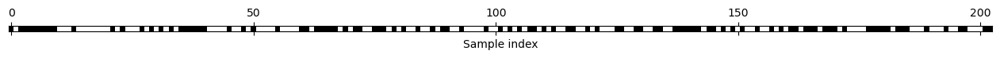

In [216]:
select = SelectPercentile(percentile=50)
select.fit(X, y1)
X_select = select.transform(X)

print("X.shape: {}".format(X.shape))
print("X_select.shape: {}".format(X_select.shape))

# Check which features are selected:
mask = select.get_support()
# print(mask)
# visualize the mask. black is True, white is False
plt.matshow(mask.reshape(1, -1), cmap='gray_r')
plt.xlabel("Sample index")
plt.yticks(())

/opt/homebrew/Caskroom/miniforge/base/envs/mlp/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:112: UserWarning: Features [   97   111   120 ... 20904 20905 20907] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
/opt/homebrew/Caskroom/miniforge/base/envs/mlp/lib/python3.10/site-packages/sklearn/feature_selection/_univariate_selection.py:113: RuntimeWarning: invalid value encountered in divide
  f = msb / msw


X.shape: (9899, 20909)
X_select.shape: (9899, 10454)


([], [])

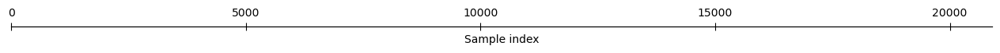

In [217]:
select_poly = SelectPercentile(percentile=50)

select_poly.fit(X_poly, y1)
X_poly_select = select_poly.transform(X_poly)

print("X.shape: {}".format(X_poly.shape))
print("X_select.shape: {}".format(X_poly_select.shape))

# Check which features are selected:
mask = select_poly.get_support()
# print(mask)
# visualize the mask. black is True, white is False
plt.matshow(mask.reshape(1, -1), cmap='gray_r')
plt.xlabel("Sample index")
plt.yticks(())

In [218]:
reg = LogisticRegression(max_iter=3000)
print('Regular R2: ', reg.fit(X, y1).score(X, y1))
print('Select Percentile R2: ', reg.fit(X_select, y1).score(X_select, y1))
print('Poly Select Percentile R2: ', reg.fit(X_poly_select, y1).score(X_poly_select, y1))

Regular R2:  0.6507728053338722
Select Percentile R2:  0.6482472977068391
Poly Select Percentile R2:  0.741893120517224


In [219]:
reg = LogisticRegression(max_iter=3000, penalty='l1', solver='liblinear')
print('Regular R2: ', reg.fit(X, y1).score(X, y1))
print('Select Percentile R2: ', reg.fit(X_select, y1).score(X_select, y1))
print('Poly Select Percentile R2: ', reg.fit(X_poly_select, y1).score(X_poly_select, y1))

Regular R2:  0.6511768865541974
Select Percentile R2:  0.648853419537327
Poly Select Percentile R2:  0.7400747550257601


### Model-based Feature Selection:

X.shape: (9899, 203)
X_l1.shape: (9899, 102)


([], [])

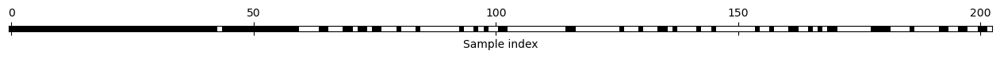

In [220]:
from sklearn.feature_selection import SelectFromModel
from sklearn.ensemble import RandomForestClassifier
select = SelectFromModel(
    RandomForestClassifier(n_estimators=100, random_state=42),
    threshold="median")

select.fit(X, y1)
X_l1 = select.transform(X)
print("X.shape: {}".format(X.shape))
print("X_l1.shape: {}".format(X_l1.shape))

mask = select.get_support()
# visualize the mask. black is True, white is False
plt.matshow(mask.reshape(1, -1), cmap='gray_r')
plt.xlabel("Sample index")
plt.yticks(())

X_poly.shape: (9899, 20909)
X_poly_l1.shape: (9899, 20909)


([], [])

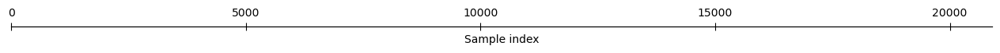

In [221]:
select = SelectFromModel(
    RandomForestClassifier(n_estimators=100, random_state=42),
    threshold="median")

select.fit(X_poly, y1)
X_poly_l1 = select.transform(X_poly)
print("X_poly.shape: {}".format(X_poly.shape))
print("X_poly_l1.shape: {}".format(X_poly_l1.shape))

mask = select.get_support()
# visualize the mask. black is True, white is False
plt.matshow(mask.reshape(1, -1), cmap='gray_r')
plt.xlabel("Sample index")
plt.yticks(())

In [222]:
reg = LogisticRegression(max_iter=3000)
print('Regular R2: ', reg.fit(X, y1).score(X, y1))
print('Select From Model R2: ', reg.fit(X_l1, y1).score(X_l1, y1))
print('Poly Select From Model R2: ', reg.fit(X_poly_l1, y1).score(X_poly_l1, y1))

Regular R2:  0.6507728053338722
Select From Model R2:  0.651681988079604
Poly Select From Model R2:  0.7419941408223053


In [223]:
reg = LogisticRegression(max_iter=3000, penalty='l1', solver='liblinear')
print('Regular R2: ', reg.fit(X, y1).score(X, y1))
print('Select From Model R2: ', reg.fit(X_l1, y1).score(X_l1, y1))
print('Poly Select From Model R2: ', reg.fit(X_poly_l1, y1).score(X_poly_l1, y1))

Regular R2:  0.6508738256389535
Select From Model R2:  0.6505707647237094
Poly Select From Model R2:  0.7399737347206788


### Sequential Feature Selection

In [224]:
reg = LogisticRegression(max_iter=3000, penalty='l1', solver='liblinear')
sfs = SequentialFeatureSelector(reg, n_features_to_select=50)
X_sfs = sfs.fit_transform(X, y1)

print(sfs.get_feature_names_out())
print('\n')
print('Regular R2: ', reg.fit(X_sfs, y1).score(X_sfs, y1))

['num__factual_recall_index' 'num__comprehensive_ability_index'
 'num__syllables_count' 'num__spache_rds' 'num__consensus_ts'
 'num__progress_rate' 'cat__text_genres_non-fiction'
 'cat__question_type_G' 'cat__question_type_G, H'
 'cat__question_type_G, V' 'cat__question_type_H, P'
 'cat__question_type_M' 'cat__question_type_M, T/F'
 'cat__question_type_M, V' 'cat__question_type_V, H'
 'cat__question_type_V, P' 'cat__flesch_label_rds_difficult'
 'cat__flesch_label_rds_easy' 'cat__flesch_label_rds_standard'
 'cat__flesch_label_ts_Very Confusing' 'cat__gunning_fog_label_rds_7'
 'cat__gunning_fog_label_rds_college_graduate'
 'cat__gunning_fog_label_ts_College Sophomore'
 'cat__gunning_fog_label_ts_HS Freshman'
 'cat__gunning_fog_label_ts_HS Junior'
 'cat__flesch_kincaid_label_rds_0         4.0\n1         4.0\n2         4.0\n3         4.0\n4         4.0\n         ... \n12657    11.0\n12658    11.0\n12659    11.0\n12660    11.0\n12661    11.0\nName: flesch_kincaid_rds, Length: 12287, dtype: 

### Dimensionality Reduction

In [225]:
pca = PCA(n_components=.95)
X_pca = pca.fit_transform(X)
X_poly_pca = pca.fit_transform(X_poly)

print("X_pca.shape: {}".format(X_pca.shape))
print("X_poly_pca.shape: {}".format(X_poly_pca.shape))

reg = LogisticRegression(max_iter=3000)
print('Regular R2: ', reg.fit(X, y1).score(X, y1))
print('PCA R2: ', reg.fit(X_pca, y1).score(X_pca, y1))
print('Poly PCA R2: ', reg.fit(X_poly_pca, y1).score(X_poly_pca, y1))

X_pca.shape: (9899, 33)
X_poly_pca.shape: (9899, 27)
Regular R2:  0.6507728053338722
PCA R2:  0.6395595514698454
Poly PCA R2:  0.6312758864531771


In [226]:
reg = LogisticRegression(max_iter=3000, penalty='l1', solver='liblinear')
print('Regular R2: ', reg.fit(X, y1).score(X, y1))
print('PCA R2: ', reg.fit(X_pca, y1).score(X_pca, y1))
print('Poly PCA R2: ', reg.fit(X_poly_pca, y1).score(X_poly_pca, y1))

Regular R2:  0.6509748459440348
PCA R2:  0.6395595514698454
Poly PCA R2:  0.6313769067582584


We've noticed a few things:
- The 2nd degree polynomial featurers have the highest trainset accuracy
- Dimensionality reduction does not help with increased accuracy.
- Feature selection provides no increased accuracy than using the full dataset.
-

### Model Development: Train & Evaluate Model on Train Set

Classification Models to Test:
* Naive Bayes
* K Neighbours
* Logistic Regression
* Linear SVC
* SVM
* SGDClassifier
* Random Forest
* Extra Trees
* Gradient Boost
* XGBoost
* MLP
* Bagging + Decision Tree

Final Model will be tested using Voting and Stacking Classifiers

**Model Testing for Passed**

In [227]:
# train test split
X_train, X_test, y1_train, y1_test = train_test_split(X, y1, test_size=0.3, random_state=0)
Xp_train, Xp_test, y1_train, y1_test = train_test_split(X_poly, y1, test_size=0.3, random_state=0)
X_train_pca, X_test_pca, y1_train, y1_test = train_test_split(X_pca, y1, test_size=0.3, random_state=0)

y2_train = y2.loc[y1_train.index]
y2_test = y2.loc[y1_test.index]


In [228]:
model_names = [
    'Gaussian Naive Bayes', 'Bernoulli Naive Bayes', 
    'KNeighborsClassifier', 'LogisticRegression', 'LinearSVC', 'SVC',
    'SGDClassifier', 'DecisionTreeClassifier', 'RandomForestClassifier',
    'ExtraTreesClassifier', 'GradientBoostingClassifier', 
    'XGBClassifier', 'MLPClassifier'
]
models = [
    GaussianNB(), 
    BernoulliNB(), 
    KNeighborsClassifier(n_neighbors=30), 
    LogisticRegression(max_iter=10000), 
    LinearSVC(max_iter=25000), 
    SVC(max_iter=10000), 
    SGDClassifier(alpha=.001), 
    DecisionTreeClassifier(max_depth=6, criterion='entropy', min_samples_leaf=6), 
    RandomForestClassifier(max_depth=6, criterion='entropy', min_samples_split=4, min_samples_leaf=6), 
    ExtraTreesClassifier(max_depth=6, criterion='entropy', min_samples_split=4, min_samples_leaf=6), 
    GradientBoostingClassifier(learning_rate=.1, criterion='friedman_mse', max_depth=6, min_samples_split=4, min_samples_leaf=6), 
    XGBClassifier(), 
    MLPClassifier(hidden_layer_sizes=[8], activation='relu', max_iter=10_000, random_state=42)
    ]

Regular Parameters:

In [229]:
for model_name, model in zip(model_names, models):
    if model_name=='XGBClassifier':
        label_encoder = LabelEncoder()
        y2_train = label_encoder.fit_transform(y2_train)
        y2_test = label_encoder.fit_transform(y2_test)

        model.fit(X_train.to_numpy(), y1_train)
        accuracy1 = accuracy_score(y1_test, model.predict(X_test.to_numpy()))
        model.fit(X_train.to_numpy(), y2_train)
        accuracy2 = accuracy_score(y2_test, model.predict(X_test))
    elif model_name == 'MLPClassifier':
        label_encoder = LabelEncoder()
        y2_train = label_encoder.fit_transform(y2_train)
        y2_test = label_encoder.fit_transform(y2_test)

        model.fit(X_train, y1_train)
        accuracy1 = accuracy_score(y1_test, model.predict(X_test))
        model.fit(X_train, y2_train)
        accuracy2 = accuracy_score(y2_test, model.predict(X_test))
    else:
        model.fit(X_train, y1_train)
        accuracy1 = accuracy_score(y1_test, model.predict(X_test))
        model.fit(X_train, y2_train)
        accuracy2 = accuracy_score(y2_test, model.predict(X_test))

    print(f'{model_name} - Passed: {accuracy1:.2f}, Student Response: {accuracy2:.2f}')

Gaussian Naive Bayes - Passed: 0.57, Student Response: 0.25
Bernoulli Naive Bayes - Passed: 0.59, Student Response: 0.27
KNeighborsClassifier - Passed: 0.64, Student Response: 0.29
LogisticRegression - Passed: 0.65, Student Response: 0.29
LinearSVC - Passed: 0.64, Student Response: 0.29
SVC - Passed: 0.66, Student Response: 0.31
SGDClassifier - Passed: 0.64, Student Response: 0.25
DecisionTreeClassifier - Passed: 0.69, Student Response: 0.28
RandomForestClassifier - Passed: 0.65, Student Response: 0.31
ExtraTreesClassifier - Passed: 0.65, Student Response: 0.32
GradientBoostingClassifier - Passed: 0.69, Student Response: 0.32
XGBClassifier - Passed: 0.66, Student Response: 0.30
MLPClassifier - Passed: 0.69, Student Response: 0.32


The most promising models are the MLP and the Gradient Boost model.

Polynomial Parameters:

In [230]:
label_encoder.fit_transform(y2_test)

array([0, 3, 3, ..., 3, 3, 2])

In [231]:
for model_name, model in zip(model_names, models):
    if model_name=='XGBClassifier':
        pass
    elif model_name == 'MLPClassifier':
        label_encoder = LabelEncoder()
        y2_train = label_encoder.fit_transform(y2_train)
        y2_test = label_encoder.fit_transform(y2_test)

        model.fit(Xp_train, y1_train)
        accuracy1 = accuracy_score(y1_test, model.predict(Xp_test))
        model.fit(Xp_train, y2_train)
        accuracy2 = accuracy_score(y2_test, model.predict(Xp_test))
    else:
        model.fit(Xp_train, y1_train)
        accuracy1 = accuracy_score(y1_test, model.predict(Xp_test))
        model.fit(Xp_train, y2_train)
        accuracy2 = accuracy_score(y2_test, model.predict(Xp_test))

    print(f'{model_name} - Poly Passed: {accuracy1:.2f}, Poly Student Reponse: {accuracy2:.2f}')

Gaussian Naive Bayes - Poly Passed: 0.57, Poly Student Reponse: 0.23
Bernoulli Naive Bayes - Poly Passed: 0.60, Poly Student Reponse: 0.23
KNeighborsClassifier - Poly Passed: 0.63, Poly Student Reponse: 0.28
LogisticRegression - Poly Passed: 0.70, Poly Student Reponse: 0.33


/opt/homebrew/Caskroom/miniforge/base/envs/mlp/lib/python3.10/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/opt/homebrew/Caskroom/miniforge/base/envs/mlp/lib/python3.10/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


LinearSVC - Poly Passed: 0.70, Poly Student Reponse: 0.33
SVC - Poly Passed: 0.65, Poly Student Reponse: 0.30
SGDClassifier - Poly Passed: 0.64, Poly Student Reponse: 0.28
DecisionTreeClassifier - Poly Passed: 0.66, Poly Student Reponse: 0.28
RandomForestClassifier - Poly Passed: 0.67, Poly Student Reponse: 0.32
ExtraTreesClassifier - Poly Passed: 0.67, Poly Student Reponse: 0.32
GradientBoostingClassifier - Poly Passed: 0.69, Poly Student Reponse: 0.31
XGBClassifier - Poly Passed: 0.69, Poly Student Reponse: 0.31
MLPClassifier - Poly Passed: 0.68, Poly Student Reponse: 0.32


Passed corr:

We'll limit the features to those that have the highest correlation (positive or negative) with the `passed` feature.

In [232]:
passed_corr.remove('total_score')

In [233]:
# Tranform pipeline for numeric columns
num_pipeline = Pipeline([
    ('imputer', SimpleImputer(strategy='mean')),
    ('std_scaler', StandardScaler()),
])

# Transform pipeline for categorical features
cat_pipeline = Pipeline([
    ('onehot', OneHotEncoder()),
])

# Combined column transformer
full_pipeline = ColumnTransformer([
    ("num", num_pipeline, passed_corr),
    ("cat", cat_pipeline, cat_cols),
])

# Transform the DataFrame
transformed_df = full_pipeline.fit_transform(df_train)
transformed_column_names = full_pipeline.get_feature_names_out()

X_corr = X[transformed_column_names]

poly = PolynomialFeatures(degree=2, include_bias=False)
poly.fit(X_corr)
Xc_poly = poly.transform(X_corr)

Xc_poly = pd.DataFrame(Xc_poly, columns=poly.get_feature_names_out(input_features=X_corr.columns))

Xc_train, Xc_test, y1_train, y1_test = train_test_split(X_corr, y1, test_size=0.3, random_state=0)
Xcp_train, Xcp_test, y1_train, y1_test = train_test_split(Xc_poly, y1, test_size=0.3, random_state=0)

y2_train = y2.loc[y1_train.index]
y2_test = y2.loc[y1_test.index]

In [234]:
for model_name, model in zip(model_names, models):
    if model_name=='XGBClassifier':
        pass
    elif model_name == 'MLPClassifier':
        label_encoder = LabelEncoder()
        y2_train = label_encoder.fit_transform(y2_train)
        y2_test = label_encoder.fit_transform(y2_test)

        model.fit(Xc_train, y1_train)
        accuracy1 = accuracy_score(y1_test, model.predict(Xc_test))
        model.fit(Xc_train, y2_train)
        accuracy2 = accuracy_score(y2_test, model.predict(Xc_test))
    else:
        model.fit(Xc_train, y1_train)
        accuracy1 = accuracy_score(y1_test, model.predict(Xc_test))
        model.fit(Xc_train, y2_train)
        accuracy2 = accuracy_score(y2_test, model.predict(Xc_test))

    print(f'{model_name} - Corr Passed: {accuracy1:.2f}, Corr Student Reponse: {accuracy2:.2f}')

Gaussian Naive Bayes - Corr Passed: 0.56, Corr Student Reponse: 0.25
Bernoulli Naive Bayes - Corr Passed: 0.61, Corr Student Reponse: 0.26
KNeighborsClassifier - Corr Passed: 0.65, Corr Student Reponse: 0.31
LogisticRegression - Corr Passed: 0.65, Corr Student Reponse: 0.30
LinearSVC - Corr Passed: 0.64, Corr Student Reponse: 0.29
SVC - Corr Passed: 0.67, Corr Student Reponse: 0.32
SGDClassifier - Corr Passed: 0.63, Corr Student Reponse: 0.25
DecisionTreeClassifier - Corr Passed: 0.69, Corr Student Reponse: 0.29
RandomForestClassifier - Corr Passed: 0.65, Corr Student Reponse: 0.32
ExtraTreesClassifier - Corr Passed: 0.66, Corr Student Reponse: 0.33
GradientBoostingClassifier - Corr Passed: 0.69, Corr Student Reponse: 0.32
XGBClassifier - Corr Passed: 0.69, Corr Student Reponse: 0.32
MLPClassifier - Corr Passed: 0.69, Corr Student Reponse: 0.32


In [235]:
for model_name, model in zip(model_names, models):
    if model_name=='XGBClassifier':
        pass
    elif model_name == 'MLPClassifier':
        label_encoder = LabelEncoder()
        y2_train = label_encoder.fit_transform(y2_train)
        y2_test = label_encoder.fit_transform(y2_test)

        model.fit(Xcp_train, y1_train)
        accuracy1 = accuracy_score(y1_test, model.predict(Xcp_test))
        model.fit(Xcp_train, y2_train)
        accuracy2 = accuracy_score(y2_test, model.predict(Xcp_test))
    else:
        model.fit(Xcp_train, y1_train)
        accuracy1 = accuracy_score(y1_test, model.predict(Xcp_test))
        model.fit(Xcp_train, y2_train)
        accuracy2 = accuracy_score(y2_test, model.predict(Xcp_test))

    print(f'{model_name} - Poly Corr Passed: {accuracy1:.2f}, Poly Corr Student Reponse: {accuracy2:.2f}')

Gaussian Naive Bayes - Poly Corr Passed: 0.58, Poly Corr Student Reponse: 0.24
Bernoulli Naive Bayes - Poly Corr Passed: 0.61, Poly Corr Student Reponse: 0.23
KNeighborsClassifier - Poly Corr Passed: 0.65, Poly Corr Student Reponse: 0.30
LogisticRegression - Poly Corr Passed: 0.71, Poly Corr Student Reponse: 0.33


/opt/homebrew/Caskroom/miniforge/base/envs/mlp/lib/python3.10/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


LinearSVC - Poly Corr Passed: 0.71, Poly Corr Student Reponse: 0.34
SVC - Poly Corr Passed: 0.67, Poly Corr Student Reponse: 0.32
SGDClassifier - Poly Corr Passed: 0.68, Poly Corr Student Reponse: 0.34
DecisionTreeClassifier - Poly Corr Passed: 0.66, Poly Corr Student Reponse: 0.29
RandomForestClassifier - Poly Corr Passed: 0.66, Poly Corr Student Reponse: 0.31
ExtraTreesClassifier - Poly Corr Passed: 0.67, Poly Corr Student Reponse: 0.32
GradientBoostingClassifier - Poly Corr Passed: 0.70, Poly Corr Student Reponse: 0.31
XGBClassifier - Poly Corr Passed: 0.70, Poly Corr Student Reponse: 0.31
MLPClassifier - Poly Corr Passed: 0.67, Poly Corr Student Reponse: 0.32


Spline Models

In [236]:
spline = SplineTransformer()
spline.fit(X)
X_spline = spline.transform(X)
X_spline = pd.DataFrame(X_spline, columns=spline.get_feature_names_out(input_features=X.columns))

Xs_train, Xs_test, y1_train, y1_test = train_test_split(X_spline, y1, test_size=0.3, random_state=0)
y2_train = y2.loc[y1_train.index]
y2_test = y2.loc[y1_test.index]

for model_name, model in zip(model_names, models):
    if model_name=='XGBClassifier':
        pass
    elif model_name == 'MLPClassifier':
        label_encoder = LabelEncoder()
        y2_train = label_encoder.fit_transform(y2_train)
        y2_test = label_encoder.fit_transform(y2_test)

        model.fit(Xs_train, y1_train)
        accuracy1 = accuracy_score(y1_test, model.predict(Xs_test))
        model.fit(Xs_train, y2_train)
        accuracy2 = accuracy_score(y2_test, model.predict(Xs_test))
    else:
        model.fit(Xs_train, y1_train)
        accuracy1 = accuracy_score(y1_test, model.predict(Xs_test))
        model.fit(Xs_train, y2_train)
        accuracy2 = accuracy_score(y2_test, model.predict(Xs_test))

    print(f'{model_name} - Corr Passed: {accuracy1:.2f}, Corr Student Reponse: {accuracy2:.2f}')


Gaussian Naive Bayes - Corr Passed: 0.57, Corr Student Reponse: 0.25
Bernoulli Naive Bayes - Corr Passed: 0.59, Corr Student Reponse: 0.26
KNeighborsClassifier - Corr Passed: 0.64, Corr Student Reponse: 0.32
LogisticRegression - Corr Passed: 0.64, Corr Student Reponse: 0.28
LinearSVC - Corr Passed: 0.64, Corr Student Reponse: 0.29
SVC - Corr Passed: 0.66, Corr Student Reponse: 0.29
SGDClassifier - Corr Passed: 0.62, Corr Student Reponse: 0.27
DecisionTreeClassifier - Corr Passed: 0.68, Corr Student Reponse: 0.29
RandomForestClassifier - Corr Passed: 0.67, Corr Student Reponse: 0.32
ExtraTreesClassifier - Corr Passed: 0.67, Corr Student Reponse: 0.33
GradientBoostingClassifier - Corr Passed: 0.69, Corr Student Reponse: 0.30
XGBClassifier - Corr Passed: 0.69, Corr Student Reponse: 0.30
MLPClassifier - Corr Passed: 0.67, Corr Student Reponse: 0.25


_Deep Neural Networks_

Let's try different tf models using different optimization parameters:

Regular Parameters:

In [237]:
import tensorflow as tf

tf.keras.backend.clear_session()
tf.random.set_seed(42)

model = tf.keras.Sequential([
    # tf.keras.layers.Flatten(input_shape=[, 203]),
    tf.keras.layers.Dense(100, activation="relu",
                              kernel_initializer="he_normal"),
    tf.keras.layers.Dense(100, activation="relu",
                              kernel_initializer="he_normal"),
    tf.keras.layers.Dense(100, activation="relu",
                              kernel_initializer="he_normal"),
    tf.keras.layers.Dense(10, activation="softmax")
])

for optimizer in ['adam', 'sgd', 'rmsprop']:
    print(optimizer)
    model.compile(loss="sparse_categorical_crossentropy",
                optimizer=optimizer, metrics="accuracy")
    model.fit(X_train, y1_train, epochs=10, validation_data=(X_test, y1_test))

adam
Epoch 1/10


2023-09-03 15:16:33.840240: W tensorflow/tsl/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz


217/217 [==============================] - 0s 1ms/step - loss: 0.6963 - accuracy: 0.6059 - val_loss: 0.6334 - val_accuracy: 0.6313
Epoch 2/10
217/217 [==============================] - 0s 768us/step - loss: 0.6357 - accuracy: 0.6330 - val_loss: 0.6290 - val_accuracy: 0.6465
Epoch 3/10
217/217 [==============================] - 0s 768us/step - loss: 0.6241 - accuracy: 0.6450 - val_loss: 0.6207 - val_accuracy: 0.6539
Epoch 4/10
217/217 [==============================] - 0s 755us/step - loss: 0.6119 - accuracy: 0.6531 - val_loss: 0.6150 - val_accuracy: 0.6532
Epoch 5/10
217/217 [==============================] - 0s 755us/step - loss: 0.5987 - accuracy: 0.6672 - val_loss: 0.6042 - val_accuracy: 0.6707
Epoch 6/10
217/217 [==============================] - 0s 887us/step - loss: 0.5888 - accuracy: 0.6819 - val_loss: 0.6052 - val_accuracy: 0.6717
Epoch 7/10
217/217 [==============================] - 0s 757us/step - loss: 0.5790 - accuracy: 0.6923 - val_loss: 0.5867 - val_accuracy: 0.6825
Epoch

Polynomial Parameters:

In [238]:
import tensorflow as tf

tf.keras.backend.clear_session()
tf.random.set_seed(42)

model = tf.keras.Sequential([
    # tf.keras.layers.Flatten(input_shape=[, 203]),
    tf.keras.layers.Dense(100, activation="relu",
                              kernel_initializer="he_normal"),
    tf.keras.layers.Dense(100, activation="relu",
                              kernel_initializer="he_normal"),
    tf.keras.layers.Dense(100, activation="relu",
                              kernel_initializer="he_normal"),
    tf.keras.layers.Dense(10, activation="softmax")
])

for optimizer in ['adam', 'sgd', 'rmsprop']:
    print(optimizer)
    model.compile(loss="sparse_categorical_crossentropy",
                optimizer=optimizer, metrics="accuracy")
    model.fit(Xp_train, y1_train, epochs=10, validation_data=(Xp_test, y1_test))

adam
Epoch 1/10
217/217 [==============================] - 2s 6ms/step - loss: 0.8021 - accuracy: 0.5911 - val_loss: 0.6521 - val_accuracy: 0.6131
Epoch 2/10
217/217 [==============================] - 1s 5ms/step - loss: 0.6599 - accuracy: 0.6225 - val_loss: 0.6632 - val_accuracy: 0.6071
Epoch 3/10
217/217 [==============================] - 1s 5ms/step - loss: 0.6403 - accuracy: 0.6363 - val_loss: 0.6152 - val_accuracy: 0.6566
Epoch 4/10
217/217 [==============================] - 1s 5ms/step - loss: 0.6156 - accuracy: 0.6558 - val_loss: 0.6358 - val_accuracy: 0.6438
Epoch 5/10
217/217 [==============================] - 1s 5ms/step - loss: 0.6091 - accuracy: 0.6578 - val_loss: 0.6156 - val_accuracy: 0.6596
Epoch 6/10
217/217 [==============================] - 1s 6ms/step - loss: 0.5994 - accuracy: 0.6725 - val_loss: 0.6147 - val_accuracy: 0.6636
Epoch 7/10
217/217 [==============================] - 1s 5ms/step - loss: 0.5969 - accuracy: 0.6746 - val_loss: 0.6041 - val_accuracy: 0.6586
E

The tensor flow models do not provide any higher accuracies than the sklearn models. We'll limit model evaluation to the models with the highest validation accuracies.

The best model & parameter combination is the Logistic Regression and Linear SVC models with the 2nd degree polynomial variables using only features that are strongly correlated with the `passed` variable.

### Model Evaluation using Cross-Validation

In [239]:
model_names = [
    'LogisticRegression', 'LinearSVC', 'GradientBoostingClassifier', 'MLPClassifier'
]
models = [
    LogisticRegression(max_iter=10000), LinearSVC(max_iter=25000), 
    GradientBoostingClassifier(learning_rate=.1, criterion='friedman_mse', max_depth=6, min_samples_split=4, min_samples_leaf=6), 
    MLPClassifier(hidden_layer_sizes=[8], activation='relu', max_iter=10_000, random_state=42),
    ]

Regular Parameters:

In [240]:
for model_name, model in zip(model_names, models):
    scores = cross_val_score(model, X, y1, cv=5)
    print(model_name, 'Passed')
    print(scores)
    print("%0.2f avg accuracy with a standard deviation of %0.2f" % (scores.mean(), scores.std()))

    label_encoder = LabelEncoder()
    y2 = label_encoder.fit_transform(y2)
    scores = cross_val_score(model, X, y2, cv=5)
    print(model_name, 'Student Response')
    print(scores)
    print("%0.2f avg accuracy with a standard deviation of %0.2f" % (scores.mean(), scores.std()))

    print('\n')

LogisticRegression Passed
[0.63080808 0.63030303 0.61313131 0.6459596  0.62607377]
0.63 avg accuracy with a standard deviation of 0.01


/opt/homebrew/Caskroom/miniforge/base/envs/mlp/lib/python3.10/site-packages/sklearn/model_selection/_split.py:700: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  warnings.warn(


LogisticRegression Student Response
[0.32424242 0.2979798  0.25454545 0.28181818 0.24254674]
0.28 avg accuracy with a standard deviation of 0.03


LinearSVC Passed
[0.63232323 0.62929293 0.61818182 0.6459596  0.62506316]
0.63 avg accuracy with a standard deviation of 0.01


/opt/homebrew/Caskroom/miniforge/base/envs/mlp/lib/python3.10/site-packages/sklearn/model_selection/_split.py:700: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  warnings.warn(
/opt/homebrew/Caskroom/miniforge/base/envs/mlp/lib/python3.10/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/opt/homebrew/Caskroom/miniforge/base/envs/mlp/lib/python3.10/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/opt/homebrew/Caskroom/miniforge/base/envs/mlp/lib/python3.10/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/opt/homebrew/Caskroom/miniforge/base/envs/mlp/lib/python3.10/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, incre

LinearSVC Student Response
[0.32171717 0.29848485 0.25808081 0.28686869 0.24254674]
0.28 avg accuracy with a standard deviation of 0.03


GradientBoostingClassifier Passed
[0.69343434 0.6469697  0.62020202 0.68737374 0.69732188]
0.67 avg accuracy with a standard deviation of 0.03


/opt/homebrew/Caskroom/miniforge/base/envs/mlp/lib/python3.10/site-packages/sklearn/model_selection/_split.py:700: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  warnings.warn(


GradientBoostingClassifier Student Response
[0.39191919 0.29747475 0.24848485 0.28181818 0.29257201]
0.30 avg accuracy with a standard deviation of 0.05


MLPClassifier Passed
[0.6959596  0.67979798 0.67676768 0.68989899 0.70439616]
0.69 avg accuracy with a standard deviation of 0.01


/opt/homebrew/Caskroom/miniforge/base/envs/mlp/lib/python3.10/site-packages/sklearn/model_selection/_split.py:700: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  warnings.warn(


MLPClassifier Student Response
[0.33585859 0.31616162 0.28737374 0.3010101  0.34057605]
0.32 avg accuracy with a standard deviation of 0.02




Polynomial Parameters:

In [ ]:
for model_name, model in zip(model_names, models):
    scores = cross_val_score(model, X_poly, y1, cv=5)
    print(model_name)
    print(scores)
    print("%0.2f avg accuracy with a standard deviation of %0.2f" % (scores.mean(), scores.std()))

    label_encoder = LabelEncoder()
    y2 = label_encoder.fit_transform(y2)
    scores = cross_val_score(model, X_poly, y2, cv=5)
    print(model_name, 'Student Response')
    print(scores)
    print("%0.2f avg accuracy with a standard deviation of %0.2f" % (scores.mean(), scores.std()))

    print('\n')

LogisticRegression
[0.69444444 0.64444444 0.65606061 0.68383838 0.70995452]
0.68 avg accuracy with a standard deviation of 0.02


/opt/homebrew/Caskroom/miniforge/base/envs/mlp/lib/python3.10/site-packages/sklearn/model_selection/_split.py:700: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  warnings.warn(


LogisticRegression Student Response
[0.3479798  0.29545455 0.23636364 0.27828283 0.27235978]
0.29 avg accuracy with a standard deviation of 0.04




/opt/homebrew/Caskroom/miniforge/base/envs/mlp/lib/python3.10/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/opt/homebrew/Caskroom/miniforge/base/envs/mlp/lib/python3.10/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/opt/homebrew/Caskroom/miniforge/base/envs/mlp/lib/python3.10/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/opt/homebrew/Caskroom/miniforge/base/envs/mlp/lib/python3.10/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/opt/homebrew/Caskroom/miniforge/base/envs/mlp/lib/python3.10/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iter

LinearSVC
[0.68434343 0.62777778 0.6510101  0.66818182 0.69732188]
0.67 avg accuracy with a standard deviation of 0.02


/opt/homebrew/Caskroom/miniforge/base/envs/mlp/lib/python3.10/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/opt/homebrew/Caskroom/miniforge/base/envs/mlp/lib/python3.10/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/opt/homebrew/Caskroom/miniforge/base/envs/mlp/lib/python3.10/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Passed correlation Parameters:

In [241]:
for model_name, model in zip(model_names, models):
    scores = cross_val_score(model, X_corr, y1, cv=5)
    print(model_name)
    print(scores)
    print("%0.2f avg accuracy with a standard deviation of %0.2f" % (scores.mean(), scores.std()))

    label_encoder = LabelEncoder()
    y2 = label_encoder.fit_transform(y2)
    scores = cross_val_score(model, X_corr, y2, cv=5)
    print(model_name, 'Student Response')
    print(scores)
    print("%0.2f avg accuracy with a standard deviation of %0.2f" % (scores.mean(), scores.std()))

    print('\n')

LogisticRegression
[0.62929293 0.63333333 0.61666667 0.6489899  0.63567458]
0.63 avg accuracy with a standard deviation of 0.01


/opt/homebrew/Caskroom/miniforge/base/envs/mlp/lib/python3.10/site-packages/sklearn/model_selection/_split.py:700: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  warnings.warn(


LogisticRegression Student Response
[0.32525253 0.30505051 0.25909091 0.28383838 0.24861041]
0.28 avg accuracy with a standard deviation of 0.03


LinearSVC
[0.62878788 0.63383838 0.61666667 0.64747475 0.62203133]
0.63 avg accuracy with a standard deviation of 0.01


/opt/homebrew/Caskroom/miniforge/base/envs/mlp/lib/python3.10/site-packages/sklearn/model_selection/_split.py:700: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  warnings.warn(


LinearSVC Student Response
[0.31969697 0.2969697  0.26111111 0.28787879 0.25063163]
0.28 avg accuracy with a standard deviation of 0.02


GradientBoostingClassifier
[0.69494949 0.65959596 0.65858586 0.68838384 0.70894391]
0.68 avg accuracy with a standard deviation of 0.02


/opt/homebrew/Caskroom/miniforge/base/envs/mlp/lib/python3.10/site-packages/sklearn/model_selection/_split.py:700: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  warnings.warn(


GradientBoostingClassifier Student Response
[0.38585859 0.31515152 0.25757576 0.29242424 0.28802425]
0.31 avg accuracy with a standard deviation of 0.04


MLPClassifier
[0.69949495 0.68484848 0.67525253 0.69292929 0.71349166]
0.69 avg accuracy with a standard deviation of 0.01


/opt/homebrew/Caskroom/miniforge/base/envs/mlp/lib/python3.10/site-packages/sklearn/model_selection/_split.py:700: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  warnings.warn(


MLPClassifier Student Response
[0.33030303 0.30909091 0.30050505 0.28535354 0.29711976]
0.30 avg accuracy with a standard deviation of 0.01




### Model Deployment: Test Set Modelling & Evaluation

In [242]:
df_test = df_test.assign(
    date_of_birth=lambda x: pd.to_numeric(x.date_of_birth),
    completion_time=lambda x: pd.to_numeric(x.completion_time),
    publication_date=lambda x: pd.to_numeric(x.publication_date),
    age_at_completion=lambda x: pd.to_numeric(x.age_at_completion),
    timed_completion=lambda x: pd.to_numeric(x.timed_completion),
)

drop_index = df_test[df_test.student_response.isnull()].index
df_test = df_test.drop(index=drop_index)

df_test.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1863 entries, 9 to 12275
Data columns (total 76 columns):
 #   Column                       Non-Null Count  Dtype   
---  ------                       --------------  -----   
 0   student_id                   1863 non-null   object  
 1   text_title                   1863 non-null   object  
 2   text_genres                  1863 non-null   category
 3   date_of_birth                1863 non-null   int64   
 4   completion_time              1863 non-null   int64   
 5   age_at_completion            1863 non-null   int64   
 6   question                     1863 non-null   int64   
 7   question_type                1863 non-null   object  
 8   question_type_meaning        1861 non-null   object  
 9   answer                       1863 non-null   object  
 10  student_response             1863 non-null   object  
 11  passed                       1863 non-null   int64   
 12  total_score                  1863 non-null   int64   
 13  ti

In [267]:
# Tranform pipeline for numeric columns
num_pipeline = Pipeline([
    ('imputer', SimpleImputer(strategy='mean')),
    ('std_scaler', StandardScaler()),
])

# Transform pipeline for categorical features
cat_pipeline = Pipeline([
    ('onehot', OneHotEncoder()),
])

# Combined column transformer
full_pipeline = ColumnTransformer([
    ("num", num_pipeline, num_cols),
    ("cat", cat_pipeline, cat_cols),
])

# Transform the DataFrame
transformed_df = full_pipeline.fit_transform(df_test)
transformed_column_names = full_pipeline.get_feature_names_out()

# Convert the transformed data array to a DataFrame with column names
transformed_df = pd.DataFrame(transformed_df, columns=transformed_column_names)

X_t = transformed_df
yt_1 = df_test.passed
yt_2 = df_test.student_response

cols_to_drop = 'cat__question_type_M, V,'
X_t = X_t.drop(columns=cols_to_drop)

X_t.info(), yt_1.info(), yt_2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1863 entries, 0 to 1862
Columns: 197 entries, num__date_of_birth to cat__dale_chall_label_rds_'college_graduate'
dtypes: float64(197)
memory usage: 2.8 MB
<class 'pandas.core.series.Series'>
Int64Index: 1863 entries, 9 to 12275
Series name: passed
Non-Null Count  Dtype
--------------  -----
1863 non-null   int64
dtypes: int64(1)
memory usage: 29.1 KB
<class 'pandas.core.series.Series'>
Int64Index: 1863 entries, 9 to 12275
Series name: student_response
Non-Null Count  Dtype 
--------------  ----- 
1863 non-null   object
dtypes: object(1)
memory usage: 29.1+ KB


(None, None, None)

In [244]:
model_names = [
    'LogisticRegression', 'LinearSVC', 'GradientBoostingClassifier', 'MLPClassifier'
]
models = [
    LogisticRegression(max_iter=10000), LinearSVC(max_iter=25000), 
    GradientBoostingClassifier(learning_rate=.1, criterion='friedman_mse', max_depth=6, min_samples_split=4, min_samples_leaf=6), 
    MLPClassifier(hidden_layer_sizes=[8], activation='relu', max_iter=10_000, random_state=42),
    ]

for model_name, model in zip(model_names, models):
    scores = cross_val_score(model, X_t, yt_1, cv=5)
    print(model_name, 'Passed')
    print(scores)
    print("%0.2f avg accuracy with a standard deviation of %0.2f" % (scores.mean(), scores.std()))

    scores = cross_val_score(model, X_t, yt_2, cv=5)
    print(model_name, 'Student Response')
    print(scores)
    print("%0.2f avg accuracy with a standard deviation of %0.2f" % (scores.mean(), scores.std()))

    print('\n')

LogisticRegression
[0.67292225 0.65147453 0.6997319  0.63978495 0.6344086 ]
0.66 avg accuracy with a standard deviation of 0.02
LogisticRegression Student Response
[0.46380697 0.52546917 0.35656836 0.40591398 0.37096774]
0.42 avg accuracy with a standard deviation of 0.06


LinearSVC
[0.67024129 0.6541555  0.70241287 0.62634409 0.62096774]
0.65 avg accuracy with a standard deviation of 0.03
LinearSVC Student Response
[0.44504021 0.5308311  0.34852547 0.40591398 0.3655914 ]
0.42 avg accuracy with a standard deviation of 0.07


GradientBoostingClassifier
[0.78016086 0.73726542 0.70509383 0.70967742 0.70967742]
0.73 avg accuracy with a standard deviation of 0.03
GradientBoostingClassifier Student Response
[0.52815013 0.53887399 0.38605898 0.41397849 0.46236559]
0.47 avg accuracy with a standard deviation of 0.06


MLPClassifier
[0.769437   0.75603217 0.6997319  0.66935484 0.69086022]
0.72 avg accuracy with a standard deviation of 0.04
MLPClassifier Student Response
[0.49329759 0.52010724 

In [269]:
poly = PolynomialFeatures(degree=2, include_bias=False)
poly.fit(X_t)
Xt_poly = poly.transform(X_t)

Xt_poly = pd.DataFrame(Xt_poly, columns=poly.get_feature_names_out(input_features=X_t.columns))


In [246]:
poly = PolynomialFeatures(degree=2, include_bias=False)
poly.fit(X_t)
Xt_poly = poly.transform(X_t)

Xt_poly = pd.DataFrame(Xt_poly, columns=poly.get_feature_names_out(input_features=X_t.columns))

model_names = [
    'LogisticRegression', 'LinearSVC', 'GradientBoostingClassifier', 'MLPClassifier'
]
models = [
    LogisticRegression(max_iter=10000), LinearSVC(max_iter=25000), 
    GradientBoostingClassifier(learning_rate=.1, criterion='friedman_mse', loss='exponential', max_depth=6, min_samples_split=4, min_samples_leaf=6), 
    MLPClassifier(hidden_layer_sizes=[8], activation='relu', max_iter=10_000, random_state=42),
    ]

for model_name, model in zip(model_names, models):
    scores = cross_val_score(model, Xt_poly, yt_1, cv=5)
    print(model_name, 'Passed')
    print(scores)
    print("%0.2f avg accuracy with a standard deviation of %0.2f" % (scores.mean(), scores.std()))

    scores = cross_val_score(model, Xt_poly, yt_2, cv=5)
    print(model_name, 'Student Response')
    print(scores)
    print("%0.2f avg accuracy with a standard deviation of %0.2f" % (scores.mean(), scores.std()))

    print('\n')

LogisticRegression Passed
[0.75335121 0.70241287 0.68096515 0.71236559 0.69623656]
0.71 avg accuracy with a standard deviation of 0.02
LogisticRegression Student Response
[0.45040214 0.48525469 0.33512064 0.41129032 0.40322581]
0.42 avg accuracy with a standard deviation of 0.05




/opt/homebrew/Caskroom/miniforge/base/envs/mlp/lib/python3.10/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/opt/homebrew/Caskroom/miniforge/base/envs/mlp/lib/python3.10/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/opt/homebrew/Caskroom/miniforge/base/envs/mlp/lib/python3.10/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/opt/homebrew/Caskroom/miniforge/base/envs/mlp/lib/python3.10/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/opt/homebrew/Caskroom/miniforge/base/envs/mlp/lib/python3.10/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iter

LinearSVC Passed
[0.71045576 0.64343164 0.63806971 0.70430108 0.68548387]
0.68 avg accuracy with a standard deviation of 0.03


/opt/homebrew/Caskroom/miniforge/base/envs/mlp/lib/python3.10/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/opt/homebrew/Caskroom/miniforge/base/envs/mlp/lib/python3.10/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/opt/homebrew/Caskroom/miniforge/base/envs/mlp/lib/python3.10/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/opt/homebrew/Caskroom/miniforge/base/envs/mlp/lib/python3.10/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/opt/homebrew/Caskroom/miniforge/base/envs/mlp/lib/python3.10/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iter

LinearSVC Student Response
[0.43431635 0.44504021 0.31099196 0.37903226 0.40322581]
0.39 avg accuracy with a standard deviation of 0.05


GradientBoostingClassifier Passed
[0.78820375 0.77211796 0.75603217 0.74193548 0.74193548]
0.76 avg accuracy with a standard deviation of 0.02
GradientBoostingClassifier Student Response
[0.54691689 0.57908847 0.4155496  0.44086022 0.45430108]
0.49 avg accuracy with a standard deviation of 0.06


MLPClassifier Passed
[0.71581769 0.71581769 0.70241287 0.69623656 0.65860215]
0.70 avg accuracy with a standard deviation of 0.02
MLPClassifier Student Response
[0.49597855 0.49329759 0.40482574 0.45698925 0.42741935]
0.46 avg accuracy with a standard deviation of 0.04




# Final Solution

In [272]:
X_poly.info(), Xt_poly.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9899 entries, 0 to 9898
Columns: 19700 entries, num__date_of_birth to cat__dale_chall_label_rds_'college_graduate'^2
dtypes: float64(19700)
memory usage: 1.5 GB
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1863 entries, 0 to 1862
Columns: 19700 entries, num__date_of_birth to cat__dale_chall_label_rds_'college_graduate'^2
dtypes: float64(19700)
memory usage: 280.0 MB


(None, None)

In [273]:
model = GradientBoostingClassifier(learning_rate=.1, criterion='friedman_mse', max_depth=6, min_samples_split=4, min_samples_leaf=6)
model.fit(X_poly, y1)
passed_pred = model.predict(Xt_poly)

('Model Accuracy for Passed Feature: ', accuracy_score(yt_1, passed_pred))

('Model Accuracy for Passed Feature: ', 0.7316156736446592)

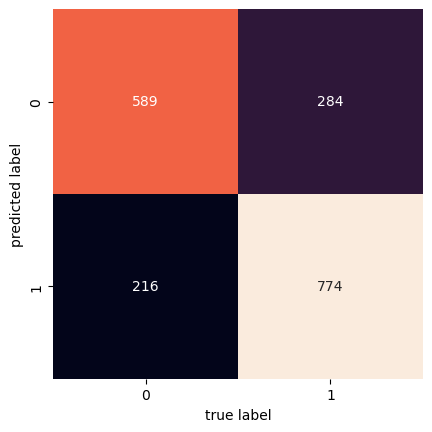

In [274]:
mat = confusion_matrix(yt_1, passed_pred)
sns.heatmap(mat.T, square=True, annot=True, fmt='d', cbar=False)
plt.xlabel('true label')
plt.ylabel('predicted label');

In [275]:
model = GradientBoostingClassifier(learning_rate=.1, criterion='friedman_mse', max_depth=6, min_samples_split=4, min_samples_leaf=6)
model.fit(X_poly, y2)
response_pred = model.predict(Xt_poly)

('Model Accuracy for Student Response Feature (without Passed variable): ', accuracy_score(yt_2, response_pred))

In [ ]:

mat = confusion_matrix(yt_2, response_pred)
sns.heatmap(mat.T, square=True, annot=True, fmt='d', cbar=False)
plt.xlabel('true label')
plt.ylabel('predicted label');

In [ ]:
X_poly2 = pd.concat([X_poly, y1])
Xt_poly2 = pd.concat([Xt_poly, yt_1])

model = GradientBoostingClassifier(learning_rate=.1, criterion='friedman_mse', max_depth=6, min_samples_split=4, min_samples_leaf=6)
model.fit(X_poly2, y2)
response_pred = model.predict(Xt_poly2)

('Model Accuracy for Student Response Feature (with Passed variable): ', accuracy_score(yt_2, response_pred))

In [ ]:
mat = confusion_matrix(yt_2, response_pred)
sns.heatmap(mat.T, square=True, annot=True, fmt='d', cbar=False)
plt.xlabel('true label')
plt.ylabel('predicted label');

Alt!

In [ ]:
model = LogisticRegression(max_iter=10000)
model.fit(X_poly, y1)
passed_pred = model.predict(Xt_poly)

('Model Accuracy for Passed Feature: ', accuracy_score(yt_1, passed_pred))

In [ ]:
mat = confusion_matrix(yt_1, passed_pred)
sns.heatmap(mat.T, square=True, annot=True, fmt='d', cbar=False)
plt.xlabel('true label')
plt.ylabel('predicted label');

In [ ]:
model = LogisticRegression(max_iter=10000)
model.fit(X_poly, y2)
response_pred = model.predict(Xt_poly)

('Model Accuracy for Passed Feature (Passed Variable Excluded): ', accuracy_score(yt_2, response_pred))

In [ ]:
mat = confusion_matrix(yt_2, response_pred)
sns.heatmap(mat.T, square=True, annot=True, fmt='d', cbar=False)
plt.xlabel('true label')
plt.ylabel('predicted label');

In [ ]:
X_poly2 = pd.concat([X_poly, y1])
Xt_poly2 = pd.concat([Xt_poly, yt_1])

model = LogisticRegression(max_iter=10000)
model.fit(X_poly2, y2)
response_pred = model.predict(Xt_poly2)

('Model Accuracy for Student Response Feature (with Passed variable): ', accuracy_score(yt_2, response_pred))

In [ ]:
mat = confusion_matrix(yt_2, response_pred)
sns.heatmap(mat.T, square=True, annot=True, fmt='d', cbar=False)
plt.xlabel('true label')
plt.ylabel('predicted label');